In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from pandas.api.types import is_numeric_dtype

In [2]:
!pip install tensorflow

  Using cached flatbuffers-23.5.26-py2.py3-none-any.whl (26 kB)
  Using cached libclang-16.0.6-py2.py3-none-manylinux2010_x86_64.whl (22.9 MB)
  Using cached tensorflow_estimator-2.11.0-py2.py3-none-any.whl (439 kB)
  Using cached termcolor-2.3.0-py3-none-any.whl (6.9 kB)
  Using cached tensorflow_io_gcs_filesystem-0.33.0-cp37-cp37m-manylinux_2_12_x86_64.manylinux2010_x86_64.whl (2.4 MB)
  Using cached tensorboard_data_server-0.6.1-py3-none-manylinux2010_x86_64.whl (4.9 MB)
  Using cached tensorboard_plugin_wit-1.8.1-py3-none-any.whl (781 kB)
  Using cached Werkzeug-2.2.3-py3-none-any.whl (233 kB)


In [3]:
import tensorflow as tf

2023-08-21 21:18:41.269846: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-21 21:18:42.862943: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:18:42.863131: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such 

In [4]:
!pip install keras

In [5]:
!pip install scikeras

  Using cached scikeras-0.10.0-py3-none-any.whl (27 kB)


In [6]:
import keras
from keras.layers import Input
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout
# from keras.layers import Flatten
# from keras.layers.convolutional import Conv1D
# from keras.layers.convolutional import MaxPooling1D
from keras.callbacks import ModelCheckpoint, EarlyStopping

In [7]:
import sklearn
from sklearn.neighbors import NearestNeighbors
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score

In [8]:
!pip install livelossplot
from livelossplot.tf_keras import PlotLossesCallback

  Using cached livelossplot-0.5.5-py3-none-any.whl (22 kB)
  Using cached bokeh-2.4.3-py3-none-any.whl (18.5 MB)


In [9]:
!pip install shap
import shap

  Using cached shap-0.42.1-cp37-cp37m-manylinux_2_12_x86_64.manylinux2010_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl (545 kB)
  Using cached slicer-0.0.7-py3-none-any.whl (14 kB)


Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


In [10]:
from google.cloud import bigquery

---------

### Authentication for working from Google Colab

In [11]:
# from google.colab import auth
# auth.authenticate_user()

---------

### Destination to save trained models

#### Google disk

In [12]:
# from google.colab import drive

# drive.mount('/content/gdrive')
# project_folder_path = '/content/gdrive/Shareddrives/Magisterka/PROJEKT/'
# models_path = project_folder_path + '/models'

#### Vertex AI Jupyter Lab

In [13]:
data_analysis_folder_path = '../'
models_path = data_analysis_folder_path + '/models'

---------

### Connect to Bigquery service

In [14]:
project_id = "master-thesis-2023-393813" # Fill project id
bqclient = bigquery.Client(project_id)

## Loading data

In [15]:
dataset_name = "twitbot_22_preprocessed_common_users_ids" #"twitbot_22_preprocessed"
users_table_name = "users"
BQ_TABLE_USERS = dataset_name + "." + users_table_name
table_id = project_id + "." + BQ_TABLE_USERS

In [16]:
job_config = bigquery.QueryJobConfig(
    allow_large_results=True, destination=table_id, use_legacy_sql=True
)

In [17]:
# SQL_QUERY = f"""SELECT * FROM {BQ_TABLE_USERS} LIMIT 10000"""
# users_df1 = bqclient.query(SQL_QUERY).to_dataframe()

In [ ]:
SQL_QUERY = f"""WITH 
  human_records AS (
    SELECT *, ROW_NUMBER() OVER () row_num 
    FROM {BQ_TABLE_USERS}
    WHERE label = 'human' 
    LIMIT 5000),
  bot_records AS (
  SELECT *, ROW_NUMBER() OVER () row_num 
    FROM {BQ_TABLE_USERS}
    WHERE label = 'bot' 
    LIMIT 5000)
  SELECT * FROM human_records 
    UNION ALL SELECT * 
    FROM bot_records 
    ORDER BY row_num;"""

users_df1 = bqclient.query(SQL_QUERY).to_dataframe()
users_df1 = users_df1.drop(['row_num'], axis=1)

In [18]:
# LIMIT RESULTS OPTIONS
pd.set_option('display.max_rows', 100)
# pd.set_option('display.max_rows', None)
pd.set_option('display.max_column', None)
pd.set_option('display.max_colwidth', None)

In [19]:
num_bots = len(users_df1.loc[users_df1['label']=='bot'])       # bots number
num_humans = len(users_df1.loc[users_df1['label']=='human'])   # humans number

print("Number of real users: ", num_humans)
print("Number of bots: ", num_bots)

Number of real users:  7867
Number of bots:  2133


In [20]:
org_users_df = pd.DataFrame(users_df1).copy()
users_df2 = pd.DataFrame(org_users_df).copy()

#### Filter to have same number of record for each class - part I (second part after data analysis and reducing some of outliers)

In [21]:
def filter_df_for_balanced_classes(df, bot_label_value='bot', human_label_value='human'):
    new_df = pd.DataFrame()

    i = 0 # bots iter.
    j = 0 # humans iter.
    k = 0
    num_bots = len(df.loc[df['label']==bot_label_value])
    num_humans = len(df.loc[df['label']==human_label_value])
    max_num = min(num_bots, num_humans)
    for index, record in df.iterrows():
      if k < (2*max_num):
        if record['label']==bot_label_value and i < max_num:
          new_df = new_df.append(record)
          # users_df = pd.concat([users_df, record], ignore_index=True)
          i += 1
          k += 1
        if record['label']==human_label_value and j < max_num:
          new_df = new_df.append(record)
          # users_df = pd.concat([users_df, record], ignore_index=True)
          j += 1
          k += 1
            
    print("Number of bots: ", len(new_df.loc[new_df['label']==bot_label_value]))
    print("Number of human users: ", len(new_df.loc[new_df['label']==human_label_value]))
    
    return pd.DataFrame(new_df).copy();

In [22]:
users_df = filter_df_for_balanced_classes(users_df2)

Number of bots:  2133
Number of human users:  2133


## Data preparation

In [23]:
def drop_columns(df, columns):
    for column_name in columns:
      df = df.drop([column_name], axis=1)
    return df

In [24]:
def encode_not_numeric_columns(df):
  for column_name in df:
    if not is_numeric_dtype(df[column_name]):
      unique_values_dict = dict(enumerate(df[column_name].unique()))
      unique_values_dict = dict((v, k) for k, v in unique_values_dict.items())
      df[column_name] = df[column_name].map(unique_values_dict)
  return df

#### Align values for bool columns

In [25]:
boolean_columns = ["verified", "protected", "withheld", "has_location", "has_profile_image_url", "has_pinned_tweet", "has_description"]

In [26]:
# Firstly align boolean columns values
for col_name in boolean_columns:
    users_df[col_name] = users_df[col_name].astype(bool)

column_to_remove = []
# Check unique values (some of subset can have only one unique value for some feature) if so it column will be removed from dataframe
for col_name in boolean_columns:
    uniq_val_list = users_df[col_name].unique()
    print("Column {:<24} {}".format(col_name, str(uniq_val_list)))
    if (len(uniq_val_list) < 2):
        column_to_remove.append(col_name)

Column verified                 [False  True]
Column protected                [False  True]
Column withheld                 [False]
Column has_location             [ True False]
Column has_profile_image_url    [ True False]
Column has_pinned_tweet         [False  True]
Column has_description          [ True False]


In [27]:
column_to_remove

['withheld']

In [28]:
# remove from bool columns:
for col_name in column_to_remove:
    boolean_columns.remove(col_name)
# remove from dataframe
users_df = drop_columns(users_df, column_to_remove)

### Encoding of non-numeric information which will be used by model

In [29]:
# Remap the values of the dataframe
for col_name in boolean_columns:
  users_df[col_name] = users_df[col_name].map({True:1,False:0})

# Remap label values human/bot for 0/1
label_col = "label"
users_df[label_col] = users_df[label_col].map({"human":0,"bot":1})


In [30]:
users_df

,id,label,username,name,created_at,verified,protected,has_location,location,has_profile_image_url,has_pinned_tweet,url,followers_count,following_count,tweet_count,listed_count,has_description,description,descr_no_hashtags,descr_no_cashtags,descr_no_mentions,descr_no_urls,url_no_urls
0,1484544053572419585,0,blessing_xettry,#Blessing xettry,1.642778e+09,0,0,1,Nepal,1,0,,0.0,24.0,1.0,0.0,1,"Okay, well, maybe not forever. But at least until you make some changes.",0.0,0.0,0.0,0.0,0.0
1,1447956502443069446,0,menametaken,winwinnie,1.634055e+09,0,0,1,your walls,1,0,,0.0,20.0,1.0,0.0,1,20 | uni student | life goes brrr \nyes I do and it's called art\n#thickthighssavelifes,1.0,0.0,0.0,0.0,0.0
2,1487790036322033674,0,VShipExpress1,V Ship Express,1.643552e+09,0,0,1,Canada,1,0,https://t.co/HE80bmcMvk,0.0,0.0,26.0,0.0,1,"VShip Express is a one-stop shop for all your logistics needs be it a local parcel or international cargo sent through air, ship, or land.",0.0,0.0,0.0,0.0,1.0
3,901531094507507715,0,dbamiloye,Damilola Mike-Bamiloye,1.503777e+09,0,0,1,Nigeria,1,1,,54528.0,190.0,5039.0,11.0,1,"A gospel film writer, producer, director and actor working in Mount Zion films production.",0.0,0.0,0.0,0.0,0.0
4,1329634133379665921,0,Languagegamesny,Languagegamesnyc,1.605844e+09,0,0,1,New York,1,1,https://t.co/jN9HYPLgeV,1.0,128.0,79.0,0.0,1,Trying to catch my white whale TikTok languagegames instagram Languagegamesnyc,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9977,1214029823984599040,1,againstempiric1,magee ��,1.578282e+09,0,0,0,None,1,0,,172.0,81.0,2245.0,5.0,1,27 ����: ASX Trader/Investor. Ex Software Engineer. Logic. Armchair Economist.,0.0,0.0,0.0,0.0,0.0
9978,1480060548410580995,1,MetawarOfficial,Metawar,1.641709e+09,0,0,0,None,1,1,,283820.0,2.0,7.0,54.0,1,Telegram Group: https://t.co/Qdo4oYS9VV\nWebsite: https://t.co/QJGho2voTh,0.0,0.0,0.0,2.0,0.0
9979,1338724314766585856,1,steinartgroup,stein art group,1.608012e+09,0,0,0,None,1,0,https://t.co/WbtX3bST1a,174.0,1555.0,34.0,0.0,1,"2mm Flexible Sandstone, Concrete, Marble and Terrazzo for Interior and Exterior Walls.",0.0,0.0,0.0,0.0,1.0
9987,782641505089363968,1,kessentiniglp,Marouane Kessentini,1.475431e+09,0,0,0,None,1,0,,183.0,187.0,159.0,0.0,0,,0.0,0.0,0.0,0.0,0.0


#### Null and NaN statistics

In [31]:
for col_name in users_df:
    count1 = pd.isnull(users_df[col_name]).sum()
    print(col_name + ": " + str(count1))

id: 0
label: 0
username: 0
name: 0
created_at: 0
verified: 0
protected: 0
has_location: 0
location: 1413
has_profile_image_url: 0
has_pinned_tweet: 0
url: 0
followers_count: 0
following_count: 0
tweet_count: 0
listed_count: 0
has_description: 0
description: 0
descr_no_hashtags: 0
descr_no_cashtags: 0
descr_no_mentions: 0
descr_no_urls: 0
url_no_urls: 0


#### Extract some information from dataframe to new columns

##### Description length

In [32]:
users_df['descr_len'] = users_df['description'].apply(len).astype(float)

##### Account age (in days) (sice 16.03.2022) (dataset data collected during the 20/01-15/03/2022 period)

In [33]:
from datetime import datetime

In [34]:
def cal_days_diff(a,b):
    A = a.replace(hour = 0, minute = 0, second = 0, microsecond = 0)
    B = b.replace(hour = 0, minute = 0, second = 0, microsecond = 0)
    return (A - B).days

def convert_unixtime_to_datetime(a):
    return datetime.utcfromtimestamp(a)

In [35]:
base_date = datetime(2022, 3, 16)
users_df['account_age'] = users_df.apply(lambda x: cal_days_diff(base_date, convert_unixtime_to_datetime(x.created_at)), axis=1).astype(float)

#### Reduce unnecessary columns

In [36]:
users_reduced_df = pd.DataFrame(users_df).copy()
# columns_to_drop = ["id", "username", "name", "created_at", "location", "url", "description"]
columns_to_drop = ["username", "name", "created_at", "location", "url", "description"]
users_reduced_df = drop_columns(users_reduced_df, columns_to_drop)
users_reduced_df

,id,label,verified,protected,has_location,has_profile_image_url,has_pinned_tweet,followers_count,following_count,tweet_count,listed_count,has_description,descr_no_hashtags,descr_no_cashtags,descr_no_mentions,descr_no_urls,url_no_urls,descr_len,account_age
0,1484544053572419585,0,0,0,1,1,0,0.0,24.0,1.0,0.0,1,0.0,0.0,0.0,0.0,0.0,72.0,54.0
1,1447956502443069446,0,0,0,1,1,0,0.0,20.0,1.0,0.0,1,1.0,0.0,0.0,0.0,0.0,85.0,155.0
2,1487790036322033674,0,0,0,1,1,0,0.0,0.0,26.0,0.0,1,0.0,0.0,0.0,0.0,1.0,138.0,45.0
3,901531094507507715,0,0,0,1,1,1,54528.0,190.0,5039.0,11.0,1,0.0,0.0,0.0,0.0,0.0,90.0,1663.0
4,1329634133379665921,0,0,0,1,1,1,1.0,128.0,79.0,0.0,1,0.0,0.0,0.0,0.0,1.0,80.0,481.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9977,1214029823984599040,1,0,0,0,1,0,172.0,81.0,2245.0,5.0,1,0.0,0.0,0.0,0.0,0.0,78.0,800.0
9978,1480060548410580995,1,0,0,0,1,1,283820.0,2.0,7.0,54.0,1,0.0,0.0,0.0,2.0,0.0,72.0,66.0
9979,1338724314766585856,1,0,0,0,1,0,174.0,1555.0,34.0,0.0,1,0.0,0.0,0.0,0.0,1.0,86.0,456.0
9987,782641505089363968,1,0,0,0,1,0,183.0,187.0,159.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,1991.0


### Data type conversion (to float)

In [37]:
for (column_name, column_data) in users_reduced_df.iteritems():
    users_reduced_df[column_name] = users_reduced_df[column_name].astype(float)

### Data split for training, validation and testing

In [38]:
train_data, test_data = train_test_split(users_reduced_df, test_size=0.30, random_state=25, shuffle=True)
test_data, val_data = train_test_split(test_data, test_size=0.5, random_state=25, shuffle=True)

### Create same dataframe for validation and test set to work with based on outliers analysis (done in later part)

In [39]:
val_data_wo_outliers = pd.DataFrame(val_data).copy()
test_data_wo_outliers = pd.DataFrame(test_data).copy()

### Describe trainig dataset

In [40]:
train_data.describe()

,id,label,verified,protected,has_location,has_profile_image_url,has_pinned_tweet,followers_count,following_count,tweet_count,listed_count,has_description,descr_no_hashtags,descr_no_cashtags,descr_no_mentions,descr_no_urls,url_no_urls,descr_len,account_age
count,2.986000e+03,2986.000000,2986.000000,2986.000000,2986.000000,2986.000000,2986.000000,2.986000e+03,2986.000000,2986.000000,2986.000000,2986.000000,2986.000000,2986.000000,2986.000000,2986.000000,2986.000000,2986.000000,2986.000000
mean,5.349304e+17,0.490288,0.042867,0.001005,0.668118,0.999665,0.219692,5.722504e+03,1245.096115,6276.367381,84.892833,0.803081,0.460147,0.001674,0.329203,0.076021,0.558272,84.757870,2469.721366
std,6.030735e+17,0.499989,0.202590,0.031686,0.470968,0.018300,0.414107,4.324377e+04,5871.963424,27943.183781,368.161085,0.397737,1.440937,0.040893,0.844609,0.306131,0.496676,59.528077,1611.512801
min,1.068000e+04,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,22.000000
25%,2.816626e+08,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,3.500000e+01,72.000000,26.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,24.000000,898.500000
50%,3.250813e+09,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,2.760000e+02,258.000000,542.000000,4.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,94.000000,2483.000000
75%,1.178494e+18,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.409500e+03,895.750000,3276.500000,37.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,143.000000,3990.000000
max,1.495955e+18,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.730667e+06,160807.000000,787615.000000,9314.000000,1.000000,17.000000,1.000000,8.000000,3.000000,1.000000,243.000000,5620.000000


# Data analysis

In [41]:
def get_dataframe_real_indexes(df, outliers_index_list):
    real_all_indexes = train_data.loc[train_data['label']==1].index
    oder_indexes = np.arange(len(real_all_indexes)) 

    indexes_df = pd.DataFrame({'real_index' : real_all_indexes, 'order_index' : oder_indexes})
    return list(indexes_df[indexes_df.order_index.isin(outliers_index_list)]['real_index'])

In [42]:
def outliers_KNN(data, column_name, n_neighbors=10, radius=5, title="", r1=48, r2=90, w=900, h=500, ydtick=2, xdtick=2, nbins=20,  th = 0.9):

    np.set_printoptions(threshold=np.inf)

    # create model
    nbrs = NearestNeighbors(n_neighbors = n_neighbors, radius=radius)
    # fit model
    data_2d = [ [ 0., x] for x in data[column_name].values]
    nbrs.fit(data_2d)

    neighbors_and_distances = nbrs.kneighbors(data_2d)
    distances = neighbors_and_distances[0]
    neighbors = neighbors_and_distances[1]
    # print(neighbors_and_distances[1])

    plt.figure(figsize=(15, 7))
    # plt.plot(distances.mean(axis=1))

    distances = pd.DataFrame(distances)
    distances_mean = pd.DataFrame(distances).mean(axis =1)
    # distances_mean.describe()
    
    outliers_index = np.where(distances_mean > th) 
    outliers_index = list(outliers_index)[0]
    outliers_index = [outliers_index[i] for i in range(len(outliers_index))]
    outliers_index_with_column_name = [[indx, data[column_name].values[indx]] for indx in outliers_index]
    outliers_index_sorted_by_column_name = sorted(outliers_index_with_column_name,key=lambda x: x[1])

    outliers = list(dict(outliers_index_sorted_by_column_name).values())
    outliers_indexes = list(dict(outliers_index_sorted_by_column_name).keys())

    print("Number of outliers: ", len(outliers))

    fig = make_subplots(specs=[[{"secondary_y": True}]])

    trace1 = go.Histogram(
            x=data[column_name],
            name=column_name,
            nbinsx=nbins,
            opacity=0.7,
    )
    trace2 = go.Histogram(
        x=outliers,
        nbinsx=nbins,
        # histnorm='density',
        name='outliers',
        opacity=0.7
    )

    traces = [trace1, trace2]
    layout = go.Layout(barmode='overlay')
    # layout = go.Layout()
    fig = go.Figure(data=traces, layout=layout)
    fig.update_layout(
        title_text=title, # title f plot
        xaxis_title_text='value', # xaxis label
        yaxis_title_text='frequency', # yaxis label
        bargap=0.05,
        bargroupgap=0.05
    )

    # fig.update_xaxes(dtick=xdtick, range =[r1,r2])
    # fig.update_yaxes(dtick=ydtick)
    fig.update_layout(
        width=w,
        height=h)
    fig.show()
    
    return get_dataframe_real_indexes(data, outliers_index)

## Distribution of label class in training, validation and test set

In [43]:
stack_data = {'Set': ['Training data', 'Validation data', 'Test data', 'Training data', 'Validation data', 'Test data'],
              'Label': ['Bot', 'Bot', 'Bot', 'Human', 'Human', 'Human'],
              'Freq': [len(train_data.loc[train_data['label']==1]), 
                       len(val_data.loc[val_data['label']==1]), 
                       len(test_data.loc[test_data['label']==1]),
                       len(train_data.loc[train_data['label']==0]), 
                       len(val_data.loc[val_data['label']==0]), 
                       len(test_data.loc[test_data['label']==0])]}
sdf = pd.DataFrame(stack_data)
sdf

,Set,Label,Freq
0,Training data,Bot,1464
1,Validation data,Bot,336
2,Test data,Bot,333
3,Training data,Human,1522
4,Validation data,Human,304
5,Test data,Human,307


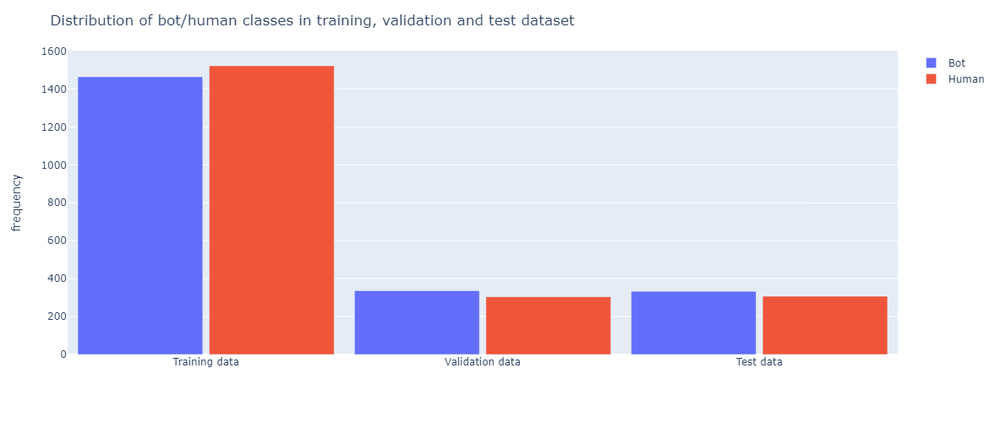

In [44]:
fig = px.bar(sdf, x="Set", y="Freq",
             color="Label", hover_data=['Label'],
             barmode = 'group')
fig.update_layout(
    title_text='Distribution of bot/human classes in training, validation and test dataset',
    xaxis_title_text='', #'subset',
    yaxis_title_text='frequency',
    bargap=0.05,
    bargroupgap=0.05,
    width=700,
    height=500,
    legend={"title":""})
fig.show()

## Distribution of other features in training dataset

### ['verified', 'protected', 'has_location', 'has_profile_image_url', 'has_pinned_tweet', 'has_description']

In [45]:
train_bot_data = train_data.loc[train_data['label']==1]
train_human_data = train_data.loc[train_data['label']==0]

stack_bool_training_feature_data = {'Feature': ['verified', 'protected', 'has_location', 'has_profile_image_url', 'has_pinned_tweet', 'has_description']*4,
    'Label': ['Bot']*12 + ['Human']*12,
    'Value': [True]*6 + [False]*6 + [True]*6 + [False]*6,
    'Freq': [len(train_bot_data.loc[train_bot_data['verified']==1]), 
             len(train_bot_data.loc[train_bot_data['protected']==1]), 
             len(train_bot_data.loc[train_bot_data['has_location']==1]),
             len(train_bot_data.loc[train_bot_data['has_profile_image_url']==1]), 
             len(train_bot_data.loc[train_bot_data['has_pinned_tweet']==1]), 
             len(train_bot_data.loc[train_bot_data['has_description']==1]),
             len(train_bot_data.loc[train_bot_data['verified']==0]), 
             len(train_bot_data.loc[train_bot_data['protected']==0]), 
             len(train_bot_data.loc[train_bot_data['has_location']==0]),
             len(train_bot_data.loc[train_bot_data['has_profile_image_url']==0]), 
             len(train_bot_data.loc[train_bot_data['has_pinned_tweet']==0]), 
             len(train_bot_data.loc[train_bot_data['has_description']==0]),
             len(train_human_data.loc[train_human_data['verified']==1]), 
             len(train_human_data.loc[train_human_data['protected']==1]), 
             len(train_human_data.loc[train_human_data['has_location']==1]),
             len(train_human_data.loc[train_human_data['has_profile_image_url']==1]), 
             len(train_human_data.loc[train_human_data['has_pinned_tweet']==1]), 
             len(train_human_data.loc[train_human_data['has_description']==1]),
             len(train_human_data.loc[train_human_data['verified']==0]), 
             len(train_human_data.loc[train_human_data['protected']==0]), 
             len(train_human_data.loc[train_human_data['has_location']==0]),
             len(train_human_data.loc[train_human_data['has_profile_image_url']==0]), 
             len(train_human_data.loc[train_human_data['has_pinned_tweet']==0]), 
             len(train_human_data.loc[train_human_data['has_description']==0])]}

stack_training_bool_feature_df = pd.DataFrame(stack_bool_training_feature_data)

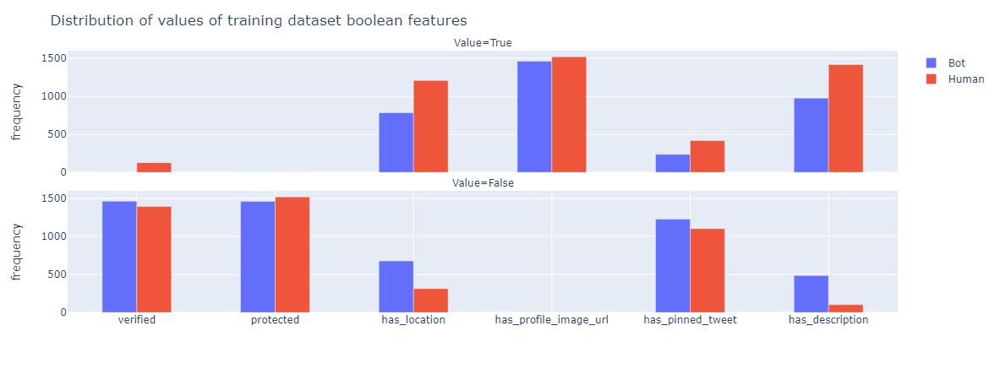

In [46]:
fig = px.bar(stack_training_bool_feature_df, 
               x="Feature", 
               y="Freq",
               facet_col="Value",
               facet_col_wrap = 1,
               color="Label", hover_data=['Label'],
               barmode = 'group')
fig.update_layout(
    title_text='Distribution of values of training dataset boolean features',
    xaxis_title_text='', #'feature',
    yaxis_title_text='frequency',
    bargap=0.5,
    bargroupgap=None, #0.8,
    width=1100,
    height=450,
    legend={"title":""},
    xaxis=dict(showgrid=True),
    yaxis=dict(showgrid=True))

fig.update_yaxes(row=2, col=1, title='frequency')
fig.show()

### followers_count

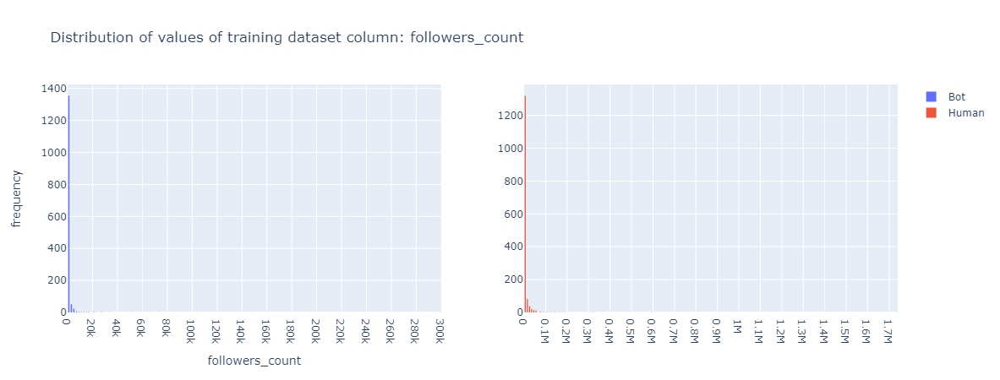

In [47]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==1,'followers_count'],
    # histnorm='density',
    nbinsx=200,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==0,'followers_count'],
    # histnorm='density',
    nbinsx=200,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: followers_count',
    xaxis_title_text='followers_count', #'feature',
    yaxis_title_text='frequency',
    bargap=0.5,
    bargroupgap=None, #0.8,
    width=1100,
    height=450,
    legend={"title":""},
    xaxis=dict(showgrid=True,title='followers_count', dtick=20000),
    xaxis2=dict(showgrid=True, dtick=100000),
    yaxis=dict(showgrid=True))

fig.show()

#### followers_count - outliers

##### K-means (mnonot useful)

Number of outliers:  238


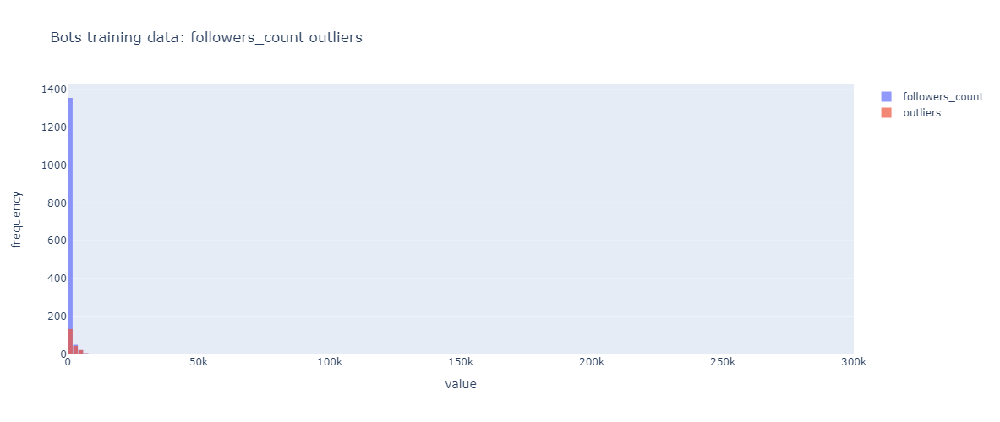

<Figure size 1500x700 with 0 Axes>

In [48]:
followers_count_bots_outliers_indexes = outliers_KNN(train_data.loc[train_data['label']==1], 'followers_count', title = "Bots training data: followers_count outliers", n_neighbors=2, radius=1, nbins=200)

Number of outliers:  623


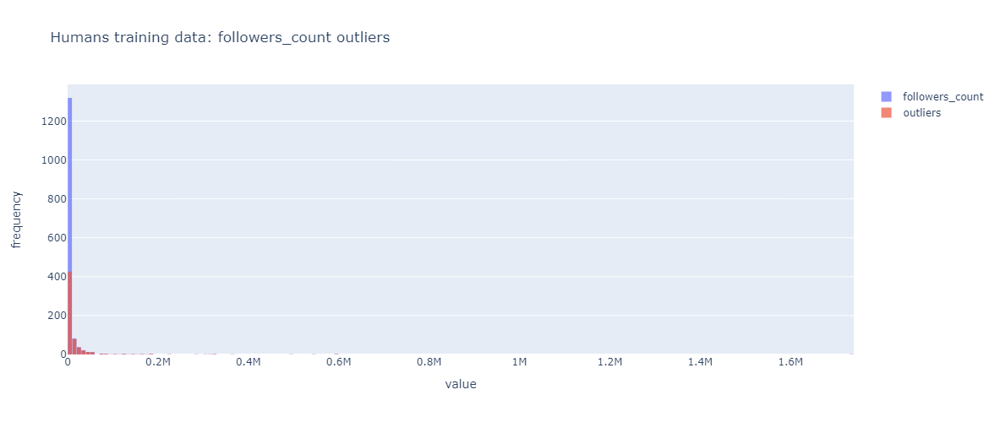

<Figure size 1500x700 with 0 Axes>

In [49]:
followers_count_humans_outliers_indexes = outliers_KNN(train_data.loc[train_data['label']==0], 'followers_count', title = "Humans training data: followers_count outliers", n_neighbors=2, radius=1, nbins=200)

In [50]:
# q_hi_bots = train_data.loc[train_data['label']==1]['followers_count'].quantile(0.99, interpolation='nearest')
# q_hi_humans = train_data.loc[train_data['label']==0]['followers_count'].quantile(0.99, interpolation='nearest')

# df_filtered_bots = train_data.loc[train_data['label']==1][(train_data.loc[train_data['label']==1]['followers_count'] < q_hi_bots)]
# df_filtered_humans = train_data.loc[train_data['label']==0][(train_data.loc[train_data['label']==0]['followers_count'] < q_hi_humans)]

In [51]:
len(train_data[(train_data['label']==1)])

1464

In [52]:
len(train_data[(train_data['label']==0)])

1522

In [53]:
from scipy.stats import expon

# Fit an exponential distribution to data
loc_b, scale_b = expon.fit(train_data.loc[train_data['label']==1]['followers_count'])
loc_h, scale_h = expon.fit(train_data.loc[train_data['label']==0]['followers_count'])

# Calculate the 99th percentile using the percent-point function (inverse CDF)
percentile_99_bots = expon.ppf(0.99, loc=loc_b, scale=scale_b)
percentile_99_humans = expon.ppf(0.99, loc=loc_h, scale=scale_h)
df_reduced_outliers_followers_count = train_data[((train_data['label']==1) & (train_data['followers_count'] < percentile_99_bots)) | ((train_data['label']==0) & (train_data['followers_count'] < percentile_99_humans))]
df_filtered_bots = train_data[(train_data['label']==1) & (train_data['followers_count'] < percentile_99_bots)]
df_filtered_humans = train_data[(train_data['label']==0) & (train_data['followers_count'] < percentile_99_humans)]

In [54]:
def df_99_percentile(df, column_name):
    # Fit an exponential distribution to data
    loc_b, scale_b = expon.fit(df.loc[df['label']==1][column_name])
    loc_h, scale_h = expon.fit(df.loc[df['label']==0][column_name])

    # Calculate the 99th percentile using the percent-point function (inverse CDF)
    percentile_99_bots = expon.ppf(0.99, loc=loc_b, scale=scale_b)
    percentile_99_humans = expon.ppf(0.99, loc=loc_h, scale=scale_h)
    return df[((df['label']==1) & (df[column_name] < percentile_99_bots)) | ((df['label']==0) & (df[column_name] < percentile_99_humans))]

In [55]:
len(df_filtered_bots)

1429

In [56]:
len(df_filtered_humans)

1469

In [57]:
len(df_reduced_outliers_followers_count) 

2898

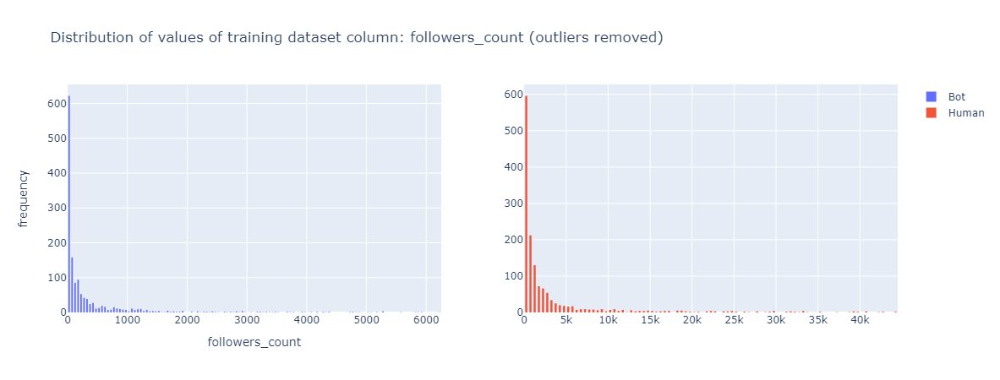

In [58]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=df_reduced_outliers_followers_count.loc[df_reduced_outliers_followers_count['label']==1,'followers_count'],
    # histnorm='density',
    nbinsx=200,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=df_reduced_outliers_followers_count.loc[df_reduced_outliers_followers_count['label']==0,'followers_count'],
    # histnorm='density',
    nbinsx=200,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: followers_count (outliers removed)',
    xaxis_title_text='followers_count', #'feature',
    yaxis_title_text='frequency',
    bargap=0.5,
    bargroupgap=None, #0.8,
    width=1100,
    height=450,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=1000),
    xaxis2=dict(showgrid=True, dtick=5000),
    yaxis=dict(showgrid=True))

fig.show()

#### following_count

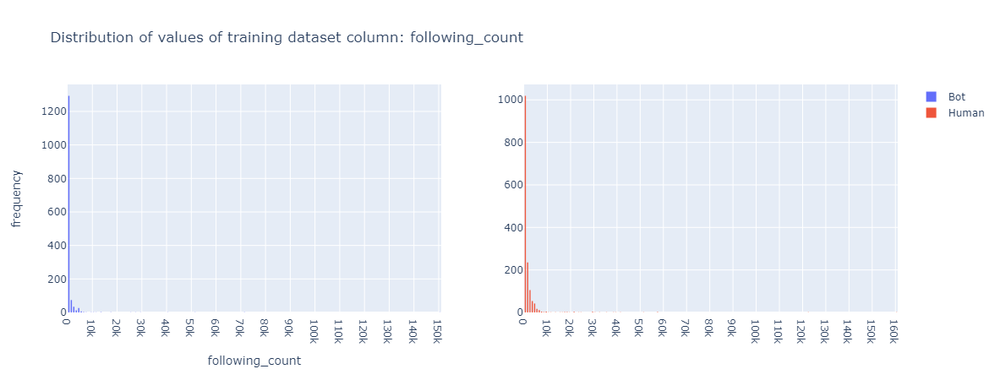

In [59]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==1,'following_count'],
    # histnorm='density',
    nbinsx=200,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==0,'following_count'],
    # histnorm='density',
    nbinsx=200,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: following_count',
    xaxis_title_text='following_count', #'feature',
    yaxis_title_text='frequency',
    bargap=0.5,
    bargroupgap=None, #0.8,
    width=1100,
    height=450,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=10000),
    xaxis2=dict(showgrid=True, dtick=10000),
    yaxis=dict(showgrid=True))

fig.show()

#### following_count - outliers

In [60]:
df_reduced_outliers_following_count = df_99_percentile(df=train_data, column_name='following_count')

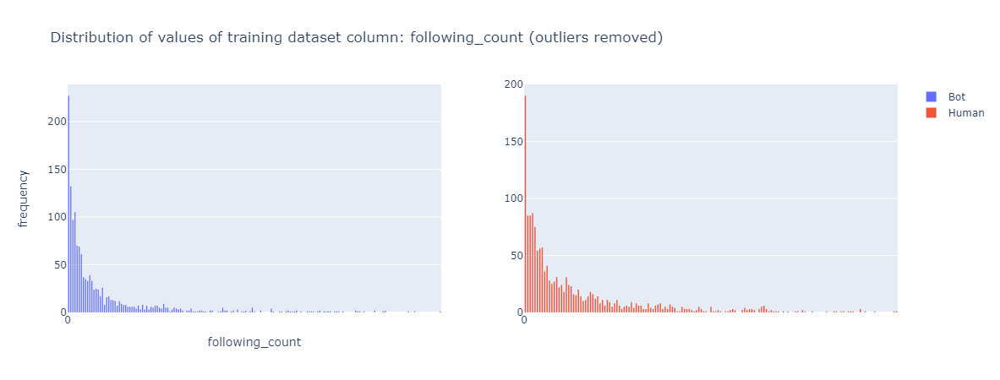

In [61]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=df_reduced_outliers_following_count.loc[df_reduced_outliers_following_count['label']==1,'following_count'],
    # histnorm='density',
    nbinsx=200,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=df_reduced_outliers_following_count.loc[df_reduced_outliers_following_count['label']==0,'following_count'],
    # histnorm='density',
    nbinsx=200,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: following_count (outliers removed)',
    xaxis_title_text='following_count', #'feature',
    yaxis_title_text='frequency',
    bargap=0.5,
    bargroupgap=None, #0.8,
    width=1100,
    height=450,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=10000),
    xaxis2=dict(showgrid=True, dtick=10000),
    yaxis=dict(showgrid=True))

fig.show()

#### tweet_count

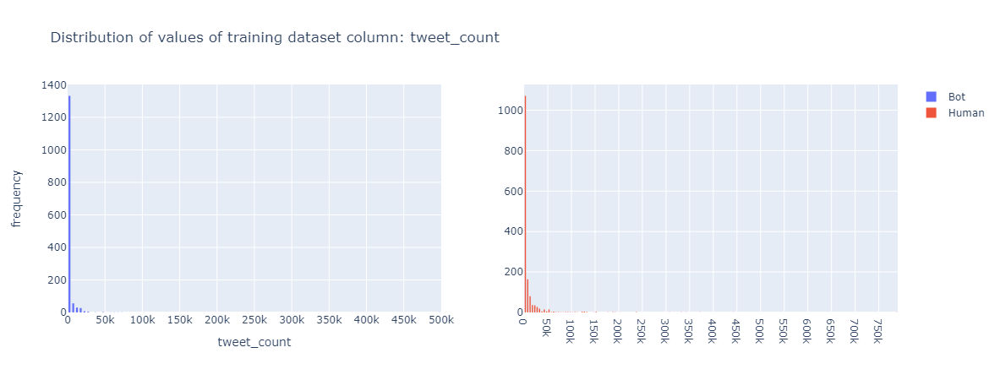

In [62]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==1,'tweet_count'],
    # histnorm='density',
    nbinsx=200,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==0,'tweet_count'],
    # histnorm='density',
    nbinsx=200,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: tweet_count',
    xaxis_title_text='tweet_count', #'feature',
    yaxis_title_text='frequency',
    bargap=0.5,
    bargroupgap=None, #0.8,
    width=1100,
    height=450,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=50000),
    xaxis2=dict(showgrid=True, dtick=50000),
    yaxis=dict(showgrid=True))

fig.show()

#### tweet_count - outliers

In [63]:
df_reduced_outliers_tweet_count = df_99_percentile(df=train_data, column_name='tweet_count')

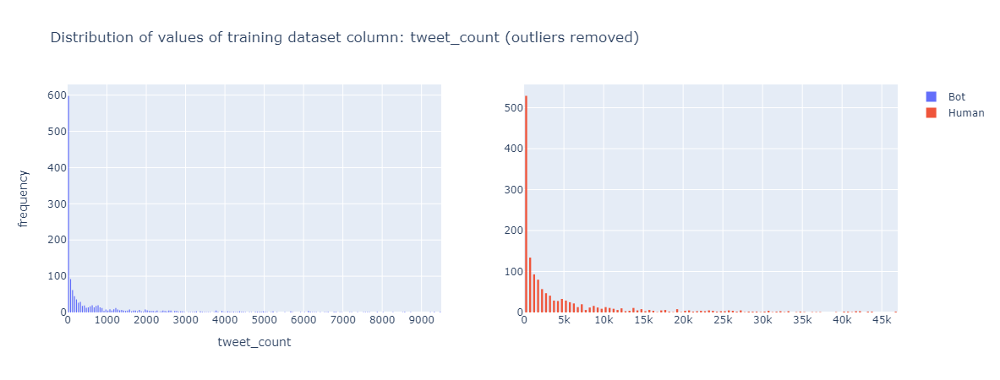

In [64]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=df_reduced_outliers_tweet_count.loc[df_reduced_outliers_tweet_count['label']==1,'tweet_count'],
    # histnorm='density',
    nbinsx=200,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=df_reduced_outliers_tweet_count.loc[df_reduced_outliers_tweet_count['label']==0,'tweet_count'],
    # histnorm='density',
    nbinsx=200,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: tweet_count (outliers removed)',
    xaxis_title_text='tweet_count', #'feature',
    yaxis_title_text='frequency',
    bargap=0.5,
    bargroupgap=None, #0.8,
    width=1100,
    height=450,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=1000),
    xaxis2=dict(showgrid=True, dtick=5000),
    yaxis=dict(showgrid=True))

fig.show()

### listed_count

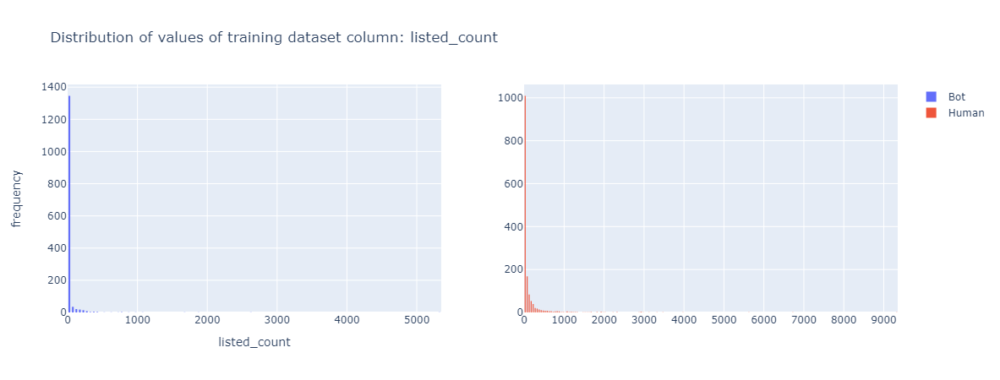

In [65]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==1,'listed_count'],
    # histnorm='density',
    nbinsx=200,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==0,'listed_count'],
    # histnorm='density',
    nbinsx=200,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: listed_count',
    xaxis_title_text='listed_count', #'feature',
    yaxis_title_text='frequency',
    bargap=0.5,
    bargroupgap=None, #0.8,
    width=1100,
    height=450,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=1000),
    xaxis2=dict(showgrid=True, dtick=1000),
    yaxis=dict(showgrid=True))

fig.show()

#### listed_count - outliers

In [66]:
df_reduced_outliers_listed_count = df_99_percentile(df=train_data, column_name='listed_count')

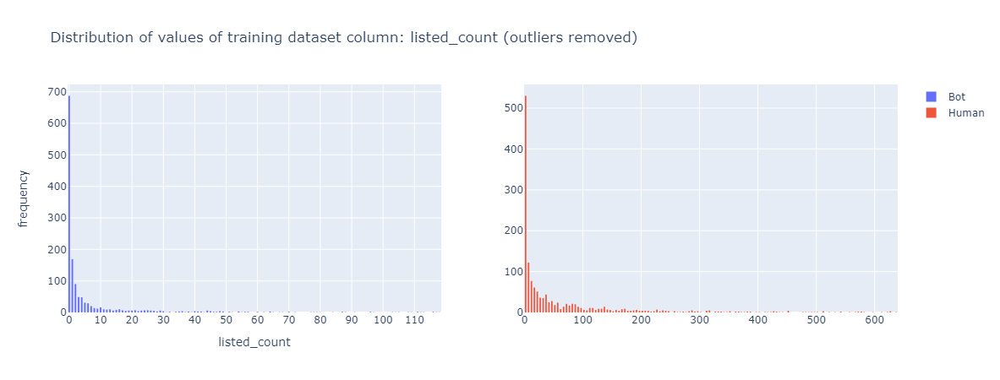

In [67]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=df_reduced_outliers_listed_count.loc[df_reduced_outliers_listed_count['label']==1,'listed_count'],
    # histnorm='density',
    nbinsx=200,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=df_reduced_outliers_listed_count.loc[df_reduced_outliers_listed_count['label']==0,'listed_count'],
    # histnorm='density',
    nbinsx=200,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: listed_count (outliers removed)',
    xaxis_title_text='listed_count', #'feature',
    yaxis_title_text='frequency',
    bargap=0.5,
    bargroupgap=None, #0.8,
    width=1100,
    height=450,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=10),
    xaxis2=dict(showgrid=True, dtick=100),
    yaxis=dict(showgrid=True))

fig.show()

### ['descr_no_hashtags', 'descr_no_cashtags', 'descr_no_mentions', 'descr_no_urls', 'descr_len', 'url_no_urls']

### descr_no_hashtags

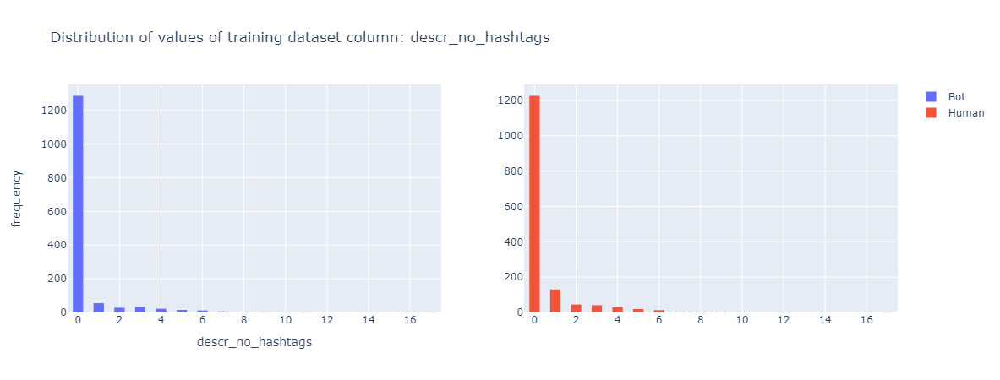

In [68]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==1,'descr_no_hashtags'],
    # histnorm='density',
    nbinsx=30,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==0,'descr_no_hashtags'],
    # histnorm='density',
    nbinsx=30,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: descr_no_hashtags',
    xaxis_title_text='descr_no_hashtags', #'feature',
    yaxis_title_text='frequency',
    bargap=0.5,
    bargroupgap=None, #0.8,
    width=1100,
    height=450,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=2),
    xaxis2=dict(showgrid=True, dtick=2),
    yaxis=dict(showgrid=True))

fig.show()

#### descr_no_hashtags - outliers

In [69]:
df_reduced_outliers_descr_no_hashtags = df_99_percentile(df=train_data, column_name='descr_no_hashtags')

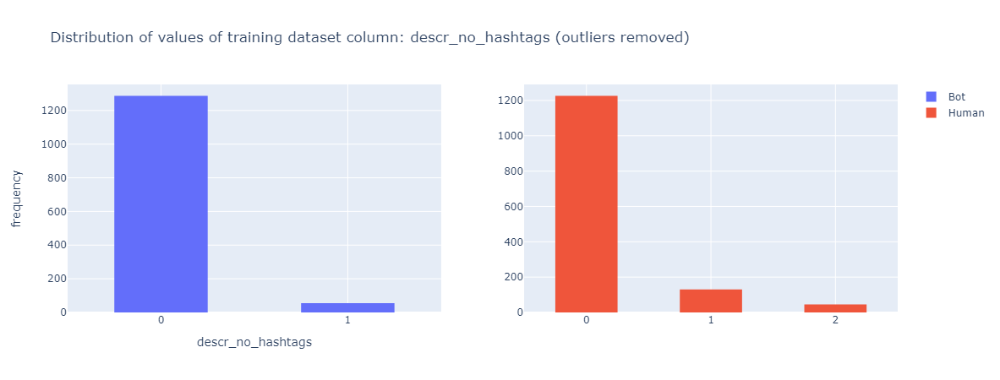

In [70]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=df_reduced_outliers_descr_no_hashtags.loc[df_reduced_outliers_descr_no_hashtags['label']==1,'descr_no_hashtags'],
    # histnorm='density',
    # nbinsx=200,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=df_reduced_outliers_descr_no_hashtags.loc[df_reduced_outliers_descr_no_hashtags['label']==0,'descr_no_hashtags'],
    # histnorm='density',
    # nbinsx=200,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: descr_no_hashtags (outliers removed)',
    xaxis_title_text='descr_no_hashtags', #'feature',
    yaxis_title_text='frequency',
    bargap=0.5,
    bargroupgap=None, #0.8,
    width=1100,
    height=450,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=1),
    xaxis2=dict(showgrid=True, dtick=1),
    yaxis=dict(showgrid=True))

fig.show()

### descr_no_cashtags


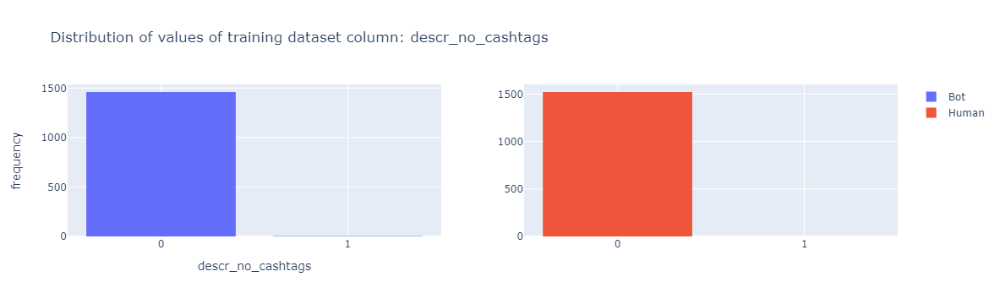

In [71]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==1,'descr_no_cashtags'],
    # histnorm='density',
    # nbinsx=30,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==0,'descr_no_cashtags'],
    # histnorm='density',
    # nbinsx=30,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: descr_no_cashtags',
    xaxis_title_text='descr_no_cashtags', #'feature',
    yaxis_title_text='frequency',
    bargap=0.2,
    bargroupgap=None, #0.8,
    width=1100,
    height=350,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=1),
    xaxis2=dict(showgrid=True, dtick=1),
    yaxis=dict(showgrid=True))

fig.show()

#### descr_no_cashtags - outliers

In [72]:
df_reduced_outliers_descr_no_cashtags = df_99_percentile(df=train_data, column_name='descr_no_cashtags')

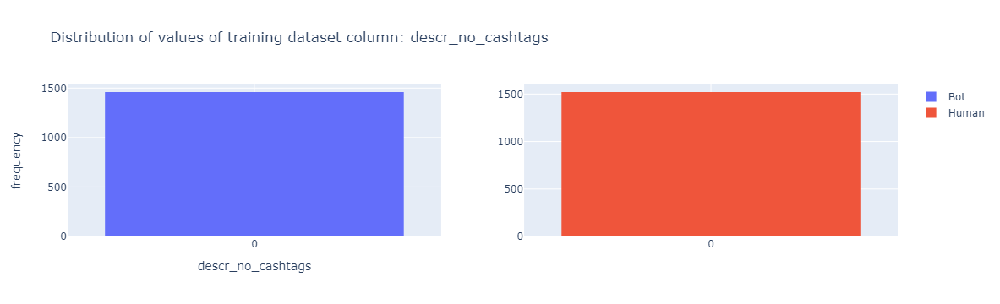

In [73]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=df_reduced_outliers_descr_no_cashtags.loc[df_reduced_outliers_descr_no_cashtags['label']==1,'descr_no_cashtags'],
    # histnorm='density',
    # nbinsx=30,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=df_reduced_outliers_descr_no_cashtags.loc[df_reduced_outliers_descr_no_cashtags['label']==0,'descr_no_cashtags'],
    # histnorm='density',
    # nbinsx=30,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: descr_no_cashtags',
    xaxis_title_text='descr_no_cashtags', #'feature',
    yaxis_title_text='frequency',
    bargap=0.2,
    bargroupgap=None, #0.8,
    width=1100,
    height=350,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=1),
    xaxis2=dict(showgrid=True, dtick=1),
    yaxis=dict(showgrid=True))

fig.show()

Better to drop this column (DONE, droped later)

### descr_no_mentions

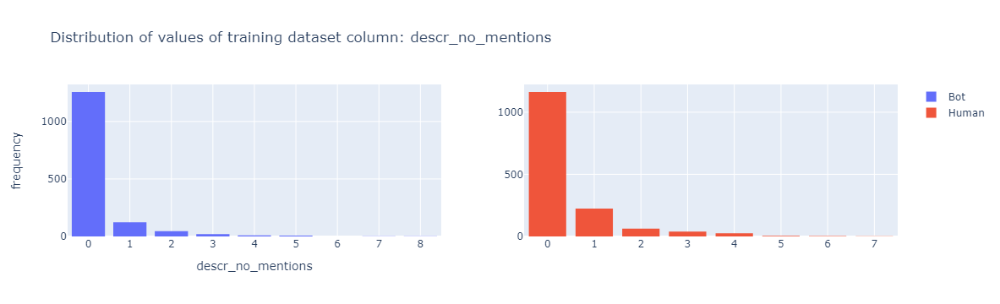

In [74]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==1,'descr_no_mentions'],
    # histnorm='density',
    # nbinsx=30,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==0,'descr_no_mentions'],
    # histnorm='density',
    # nbinsx=30,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: descr_no_mentions',
    xaxis_title_text='descr_no_mentions', #'feature',
    yaxis_title_text='frequency',
    bargap=0.2,
    bargroupgap=None, #0.8,
    width=1100,
    height=350,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=1),
    xaxis2=dict(showgrid=True, dtick=1),
    yaxis=dict(showgrid=True))

fig.show()

#### descr_no_mentions - outliers

In [75]:
df_reduced_outliers_descr_no_mentions = df_99_percentile(df=train_data, column_name='descr_no_mentions')

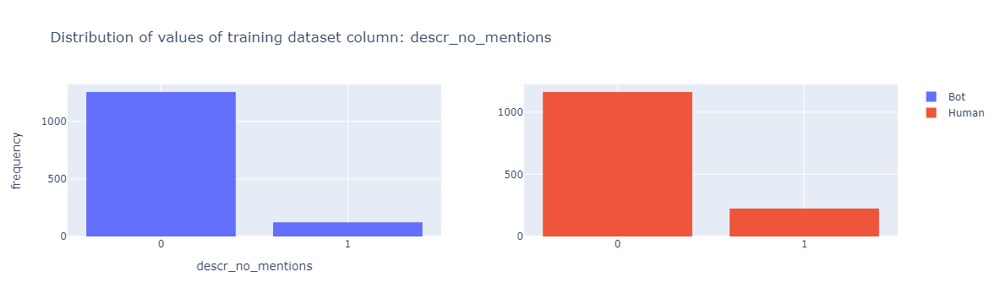

In [76]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=df_reduced_outliers_descr_no_mentions.loc[df_reduced_outliers_descr_no_mentions['label']==1,'descr_no_mentions'],
    # histnorm='density',
    # nbinsx=30,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=df_reduced_outliers_descr_no_mentions.loc[df_reduced_outliers_descr_no_mentions['label']==0,'descr_no_mentions'],
    # histnorm='density',
    # nbinsx=30,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: descr_no_mentions',
    xaxis_title_text='descr_no_mentions', #'feature',
    yaxis_title_text='frequency',
    bargap=0.2,
    bargroupgap=None, #0.8,
    width=1100,
    height=350,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=1),
    xaxis2=dict(showgrid=True, dtick=1),
    yaxis=dict(showgrid=True))

fig.show()

### descr_no_urls

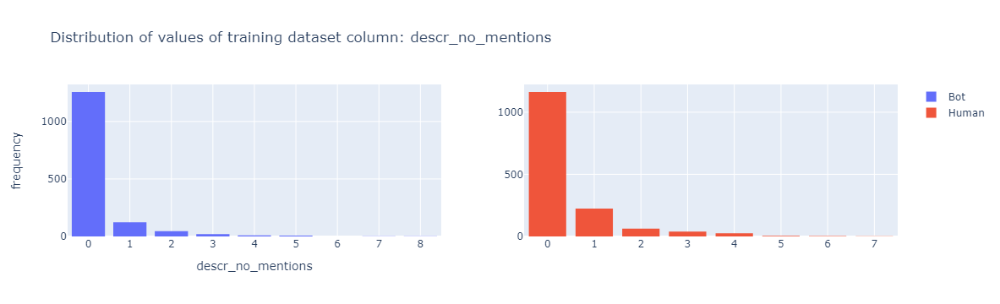

In [77]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==1,'descr_no_mentions'],
    # histnorm='density',
    # nbinsx=30,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==0,'descr_no_mentions'],
    # histnorm='density',
    # nbinsx=30,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: descr_no_mentions',
    xaxis_title_text='descr_no_mentions', #'feature',
    yaxis_title_text='frequency',
    bargap=0.2,
    bargroupgap=None, #0.8,
    width=1100,
    height=350,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=1),
    xaxis2=dict(showgrid=True, dtick=1),
    yaxis=dict(showgrid=True))

fig.show()

#### descr_no_urls - outliers

In [78]:
df_reduced_outliers_descr_no_urls = df_99_percentile(df=train_data, column_name='descr_no_urls')

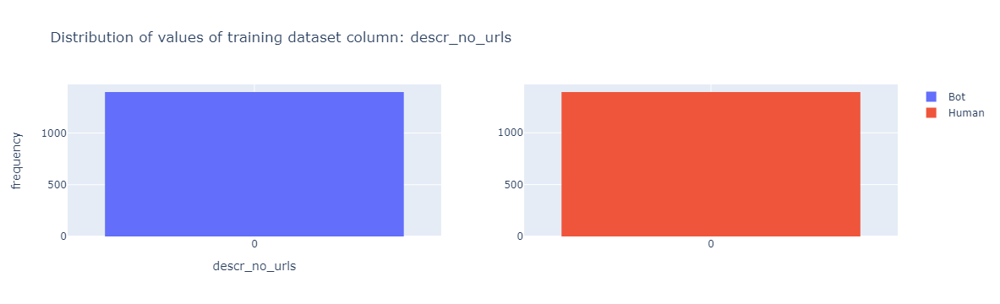

In [79]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=df_reduced_outliers_descr_no_urls.loc[df_reduced_outliers_descr_no_urls['label']==1,'descr_no_urls'],
    # histnorm='density',
    # nbinsx=30,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=df_reduced_outliers_descr_no_urls.loc[df_reduced_outliers_descr_no_urls['label']==0,'descr_no_urls'],
    # histnorm='density',
    # nbinsx=30,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: descr_no_urls',
    xaxis_title_text='descr_no_urls', #'feature',
    yaxis_title_text='frequency',
    bargap=0.2,
    bargroupgap=None, #0.8,
    width=1100,
    height=350,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=1),
    xaxis2=dict(showgrid=True, dtick=1),
    yaxis=dict(showgrid=True))

fig.show()

Better to drop this column (DONE, droped later)

### url_no_urls

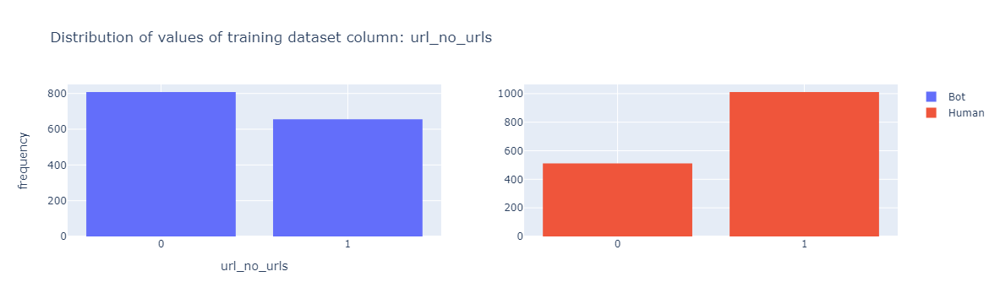

In [80]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==1,'url_no_urls'],
    # histnorm='density',
    # nbinsx=30,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==0,'url_no_urls'],
    # histnorm='density',
    # nbinsx=30,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: url_no_urls',
    xaxis_title_text='url_no_urls', #'feature',
    yaxis_title_text='frequency',
    bargap=0.2,
    bargroupgap=None, #0.8,
    width=1100,
    height=350,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=1),
    xaxis2=dict(showgrid=True, dtick=1),
    yaxis=dict(showgrid=True))

fig.show()

#### url_no_urls - outliers

In [81]:
df_reduced_outliers_url_no_urls = df_99_percentile(df=train_data, column_name='url_no_urls')

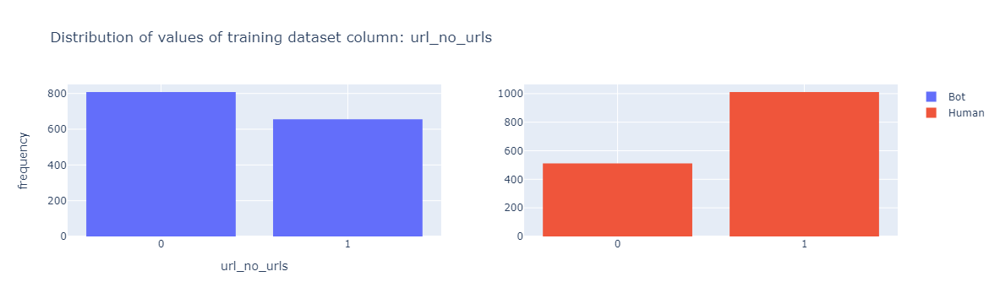

In [82]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=df_reduced_outliers_url_no_urls.loc[df_reduced_outliers_url_no_urls['label']==1,'url_no_urls'],
    # histnorm='density',
    # nbinsx=30,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=df_reduced_outliers_url_no_urls.loc[df_reduced_outliers_url_no_urls['label']==0,'url_no_urls'],
    # histnorm='density',
    # nbinsx=30,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: url_no_urls',
    xaxis_title_text='url_no_urls', #'feature',
    yaxis_title_text='frequency',
    bargap=0.2,
    bargroupgap=None, #0.8,
    width=1100,
    height=350,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=1),
    xaxis2=dict(showgrid=True, dtick=1),
    yaxis=dict(showgrid=True))

fig.show()

### descr_len

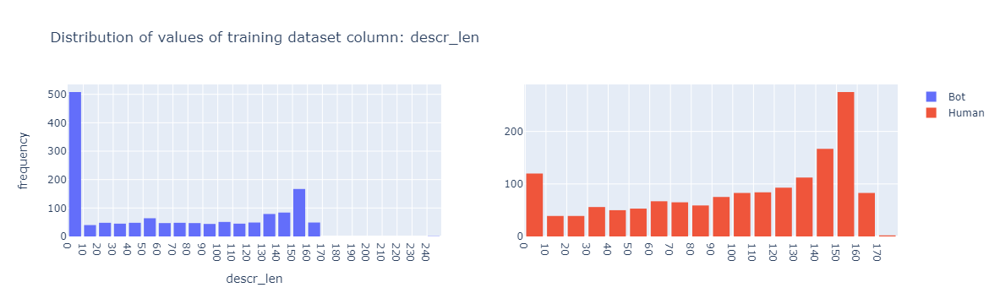

In [83]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==1,'descr_len'],
    # histnorm='density',
    # nbinsx=30,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==0,'descr_len'],
    # histnorm='density',
    # nbinsx=30,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: descr_len',
    xaxis_title_text='descr_len', #'feature',
    yaxis_title_text='frequency',
    bargap=0.2,
    bargroupgap=None, #0.8,
    width=1100,
    height=350,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=10),
    xaxis2=dict(showgrid=True, dtick=10),
    yaxis=dict(showgrid=True))

fig.show()

#### descr_len - outliers

In [84]:
q_hi_bots1 = train_data.loc[train_data['label']==1]['descr_len'].quantile(0.99, interpolation='nearest')
q_hi_humans1 = train_data.loc[train_data['label']==0]['descr_len'].quantile(0.99, interpolation='nearest')

df_reduced_outliers_descr_len =  train_data[((train_data['label']==1) & (train_data['descr_len'] < q_hi_bots1)) | ((train_data['label']==0) & (train_data['descr_len'] < q_hi_humans1))]

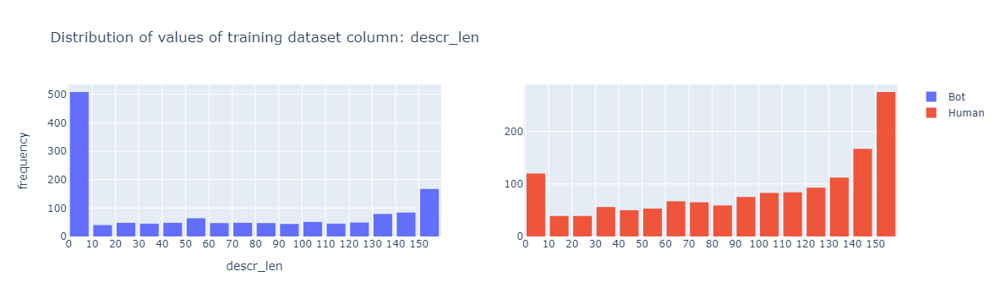

In [85]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=df_reduced_outliers_descr_len.loc[df_reduced_outliers_descr_len['label']==1,'descr_len'],
    # histnorm='density',
    # nbinsx=30,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=df_reduced_outliers_descr_len.loc[df_reduced_outliers_descr_len['label']==0,'descr_len'],
    # histnorm='density',
    # nbinsx=30,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: descr_len',
    xaxis_title_text='descr_len', #'feature',
    yaxis_title_text='frequency',
    bargap=0.2,
    bargroupgap=None, #0.8,
    width=1100,
    height=350,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=10),
    xaxis2=dict(showgrid=True, dtick=10),
    yaxis=dict(showgrid=True))

fig.show()

#### descr_len - outliers (outdated version)

In [86]:
# df_reduced_outliers_descr_len = df_99_percentile(df=train_data, column_name='descr_len')

In [87]:
# fig = go.Figure()
# fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

# fig.add_trace(go.Histogram(
#     x=df_reduced_outliers_descr_len.loc[df_reduced_outliers_descr_len['label']==1,'descr_len'],
#     # histnorm='density',
#     # nbinsx=30,
#     name='Bot'),
# row=1, col=1
# )
# fig.add_trace(go.Histogram(
#     x=df_reduced_outliers_descr_len.loc[df_reduced_outliers_descr_len['label']==0,'descr_len'],
#     # histnorm='density',
#     # nbinsx=30,
#     name='Human'),
# row=1, col=2
# )

# fig.update_layout(
#     title_text='Distribution of values of training dataset column: descr_len',
#     xaxis_title_text='descr_len', #'feature',
#     yaxis_title_text='frequency',
#     bargap=0.2,
#     bargroupgap=None, #0.8,
#     width=1100,
#     height=350,
#     legend={"title":""},
#     xaxis=dict(showgrid=True, dtick=10),
#     xaxis2=dict(showgrid=True, dtick=10),
#     yaxis=dict(showgrid=True))

# fig.show()

### account_age

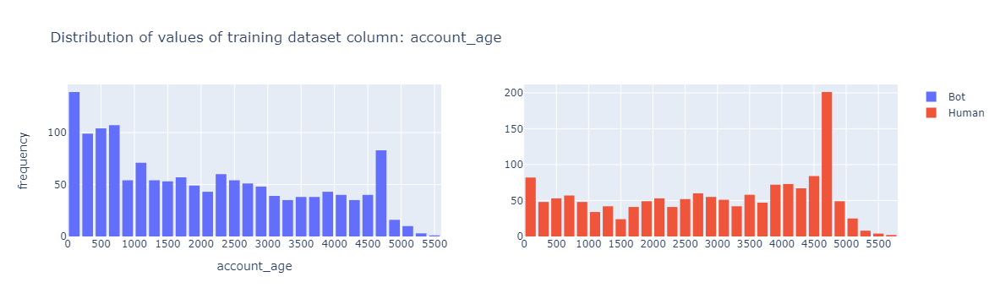

In [88]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'histogram'}, {'type':'histogram'}]])

fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==1,'account_age'],
    # histnorm='density',
    # nbinsx=30,
    name='Bot'),
row=1, col=1
)
fig.add_trace(go.Histogram(
    x=train_data.loc[train_data['label']==0,'account_age'],
    # histnorm='density',
    # nbinsx=30,
    name='Human'),
row=1, col=2
)

fig.update_layout(
    title_text='Distribution of values of training dataset column: account_age',
    xaxis_title_text='account_age', #'feature',
    yaxis_title_text='frequency',
    bargap=0.2,
    bargroupgap=None, #0.8,
    width=1100,
    height=350,
    legend={"title":""},
    xaxis=dict(showgrid=True, dtick=500),
    xaxis2=dict(showgrid=True, dtick=500),
    yaxis=dict(showgrid=True))

fig.show()

#### account_age - outliers

In [89]:
q_hi_bots2 = train_data.loc[train_data['label']==1]['account_age'].quantile(0.99, interpolation='nearest')
q_hi_humans2 = train_data.loc[train_data['label']==0]['account_age'].quantile(0.99, interpolation='nearest')

df_reduced_outliers_account_age =  train_data[((train_data['label']==1) & (train_data['account_age'] < q_hi_bots2)) | ((train_data['label']==0) & (train_data['account_age'] < q_hi_humans2))]

### Create merged dataframe from reduced by columns outliers dataframes

In [90]:
train_data_wo_outliers = df_reduced_outliers_followers_count.merge(df_reduced_outliers_following_count, on ='id', how='inner', suffixes=('', '_DROP')).filter(regex='^(?!.*_DROP)')

rest_of_df = [df_reduced_outliers_tweet_count, 
              df_reduced_outliers_listed_count, 
              df_reduced_outliers_descr_no_hashtags, 
              df_reduced_outliers_descr_no_cashtags,
              df_reduced_outliers_descr_no_mentions,
              df_reduced_outliers_descr_no_urls,
              df_reduced_outliers_url_no_urls,
              df_reduced_outliers_descr_len,
              df_reduced_outliers_account_age]

for df in rest_of_df:
    if (len(df.loc[df['label']==1]) > 0 and len(df.loc[df['label']==0]) > 0):
        train_data_wo_outliers = train_data_wo_outliers.merge(df, on ='id', how='inner', suffixes=('', '_DROP')).filter(regex='^(?!.*_DROP)')

In [91]:
len(train_data)

2986

In [92]:
len(train_data_wo_outliers)

2074

In [93]:
train_data_wo_outliers

,id,label,verified,protected,has_location,has_profile_image_url,has_pinned_tweet,followers_count,following_count,tweet_count,listed_count,has_description,descr_no_hashtags,descr_no_cashtags,descr_no_mentions,descr_no_urls,url_no_urls,descr_len,account_age
0,1.241400e+18,1.0,0.0,0.0,0.0,1.0,0.0,31.0,6.0,64.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,149.0,725.0
1,6.342788e+07,0.0,0.0,0.0,1.0,1.0,0.0,183.0,247.0,703.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0,93.0,4605.0
2,3.852371e+07,0.0,0.0,0.0,1.0,1.0,0.0,2513.0,3603.0,12.0,113.0,1.0,0.0,0.0,0.0,0.0,1.0,113.0,4696.0
3,1.059518e+18,1.0,0.0,0.0,0.0,1.0,0.0,0.0,63.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1227.0
4,7.680963e+17,0.0,0.0,0.0,1.0,1.0,0.0,163.0,308.0,127.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,143.0,2031.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2069,1.425869e+18,0.0,0.0,0.0,0.0,1.0,1.0,673.0,21.0,125.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,94.0,216.0
2070,1.664355e+07,0.0,0.0,0.0,1.0,1.0,0.0,1317.0,981.0,62.0,83.0,1.0,0.0,0.0,1.0,0.0,1.0,37.0,4907.0
2071,2.165297e+09,1.0,0.0,0.0,1.0,1.0,0.0,178.0,0.0,1.0,4.0,1.0,0.0,0.0,1.0,0.0,1.0,63.0,3059.0
2072,3.520399e+09,0.0,0.0,0.0,1.0,1.0,0.0,302.0,231.0,215.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,50.0,2379.0


#### Drop 'id' column

In [94]:
train_data = train_data.drop(['id'], axis=1)
val_data = val_data.drop(['id'], axis=1)
test_data = test_data.drop(['id'], axis=1)

train_data_wo_outliers = train_data_wo_outliers.drop(['id'], axis=1)
val_data_wo_outliers = val_data_wo_outliers.drop(['id'], axis=1)
test_data_wo_outliers = test_data_wo_outliers.drop(['id'], axis=1)

### Filter to have the same number of records for each class - part II

In [95]:
train_data = filter_df_for_balanced_classes(train_data, bot_label_value=1, human_label_value=0)
val_data = filter_df_for_balanced_classes(val_data, bot_label_value=1, human_label_value=0)
test_data = filter_df_for_balanced_classes(test_data, bot_label_value=1, human_label_value=0)

Number of bots:  1464
Number of human users:  1464
Number of bots:  304
Number of human users:  304
Number of bots:  307
Number of human users:  307


In [96]:
train_data_wo_outliers = filter_df_for_balanced_classes(train_data_wo_outliers, bot_label_value=1, human_label_value=0)
val_data_wo_outliers = filter_df_for_balanced_classes(val_data_wo_outliers, bot_label_value=1, human_label_value=0)
test_data_wo_outliers = filter_df_for_balanced_classes(test_data_wo_outliers, bot_label_value=1, human_label_value=0)

Number of bots:  1000
Number of human users:  1000
Number of bots:  304
Number of human users:  304
Number of bots:  307
Number of human users:  307


### Normalize data by column range of training set

In [97]:
# train_dataframe = pd.DataFrame(train_data).copy()
# val_dataframe = pd.DataFrame(val_data).copy()
# test_dataframe = pd.DataFrame(test_data).copy()

# train_dataframe_wo_outliers = pd.DataFrame(train_data_wo_outliers).copy()
# val_dataframe_wo_outliers = pd.DataFrame(val_data_wo_outliers).copy()
# test_dataframe_wo_outliers = pd.DataFrame(test_data_wo_outliers).copy()

In [98]:
columns_to_normalize = ['followers_count', 'following_count', 'tweet_count', 'listed_count', 'descr_len', 'account_age']

In [99]:
min_max_scaler = MinMaxScaler()
min_max_scaler.fit(train_data[columns_to_normalize])

train_data[columns_to_normalize] = min_max_scaler.transform(train_data[columns_to_normalize])
val_data[columns_to_normalize]   = min_max_scaler.transform(val_data[columns_to_normalize])
test_data[columns_to_normalize]  = min_max_scaler.transform(test_data[columns_to_normalize])

In [100]:
min_max_scaler_outliers = MinMaxScaler()
min_max_scaler_outliers.fit(train_data_wo_outliers[columns_to_normalize])

train_data_wo_outliers[columns_to_normalize] = min_max_scaler_outliers.transform(train_data_wo_outliers[columns_to_normalize])
val_data_wo_outliers[columns_to_normalize]   = min_max_scaler_outliers.transform(val_data_wo_outliers[columns_to_normalize])
test_data_wo_outliers[columns_to_normalize]  = min_max_scaler_outliers.transform(test_data_wo_outliers[columns_to_normalize])

## Correlation

In [101]:
sns.set(font_scale=2)

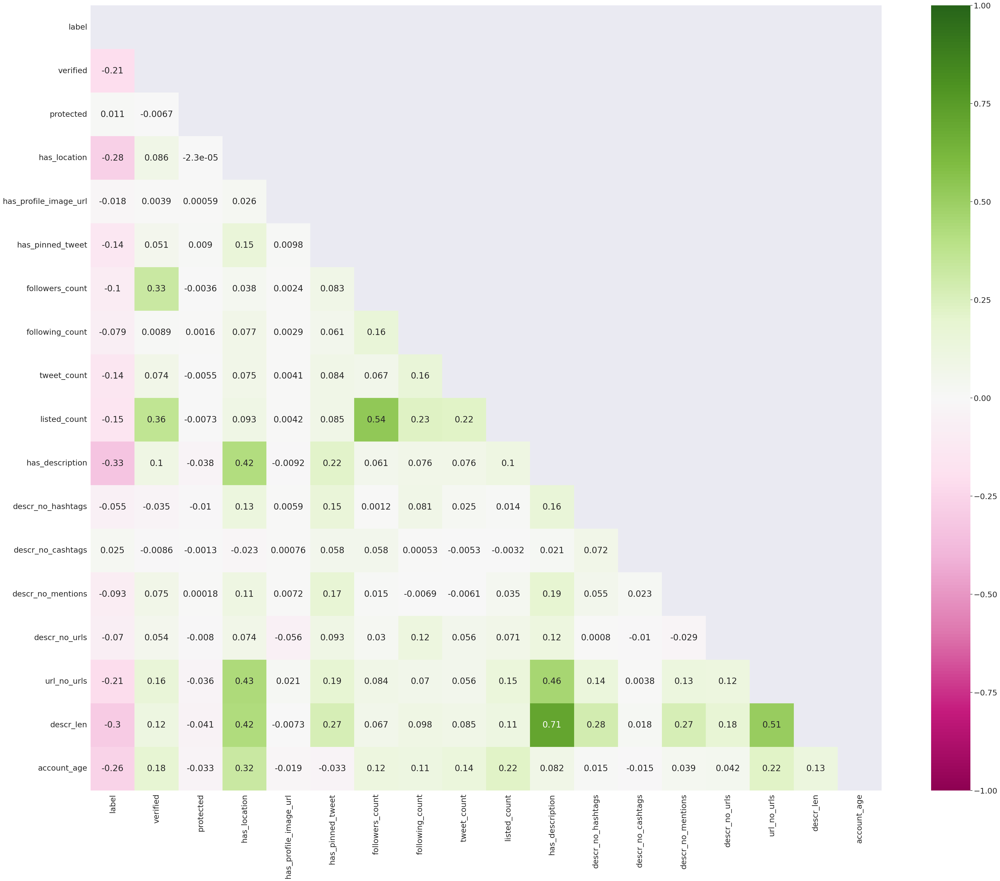

In [102]:
corr_threshold = 0.52
corr = train_data.corr()
lower_tri = corr.where(np.tril(np.ones(corr.shape),k=-1).astype(bool)) #creating lower triangular correlation matrix
f = plt.figure(figsize=(50, 40))
sns.heatmap(lower_tri, cmap="PiYG", annot=True, vmin=-1, vmax=1, ax=plt.gca()) #, annot_kws={"fontsize": 16})
high_corr = []
for column in train_data:
   for col in train_data:
     if abs(lower_tri[column][col]) > corr_threshold:
         high_corr.append((column, col, lower_tri[column][col]))
high_corr = sorted(high_corr, key=lambda x: x[2], reverse=True)

In [103]:
sns.set(font_scale=1)

In [104]:
print("Number of columns containing high correlation:", len(set([x[0] for x in high_corr])))
high_corr

Number of columns containing high correlation: 2


[('has_description', 'descr_len', 0.7061789213967409),
 ('followers_count', 'listed_count', 0.5379858069082158)]

In [106]:
train_data = train_data.drop(['listed_count'], axis=1)
val_data = val_data.drop(['listed_count'], axis=1)
test_data = test_data.drop(['listed_count'], axis=1)

train_data = train_data.drop(['has_description'], axis=1)
val_data = val_data.drop(['has_description'], axis=1)
test_data = test_data.drop(['has_description'], axis=1)

### Correlation of data reduced by outliers

#### First drop columns in filter (without outliers) dataframe where now have same value in whole column

In [107]:
same_data_columns = list(train_data_wo_outliers.columns[train_data_wo_outliers.apply(lambda x: x.nunique()) == 1])
same_data_columns

['has_profile_image_url', 'descr_no_cashtags', 'descr_no_urls']

In [108]:
train_data_wo_outliers = train_data_wo_outliers.drop(same_data_columns, axis=1)

val_data_wo_outliers = val_data_wo_outliers.drop(same_data_columns, axis=1)
test_data_wo_outliers = test_data_wo_outliers.drop(same_data_columns, axis=1)

#### Correlation

In [109]:
sns.set(font_scale=2)

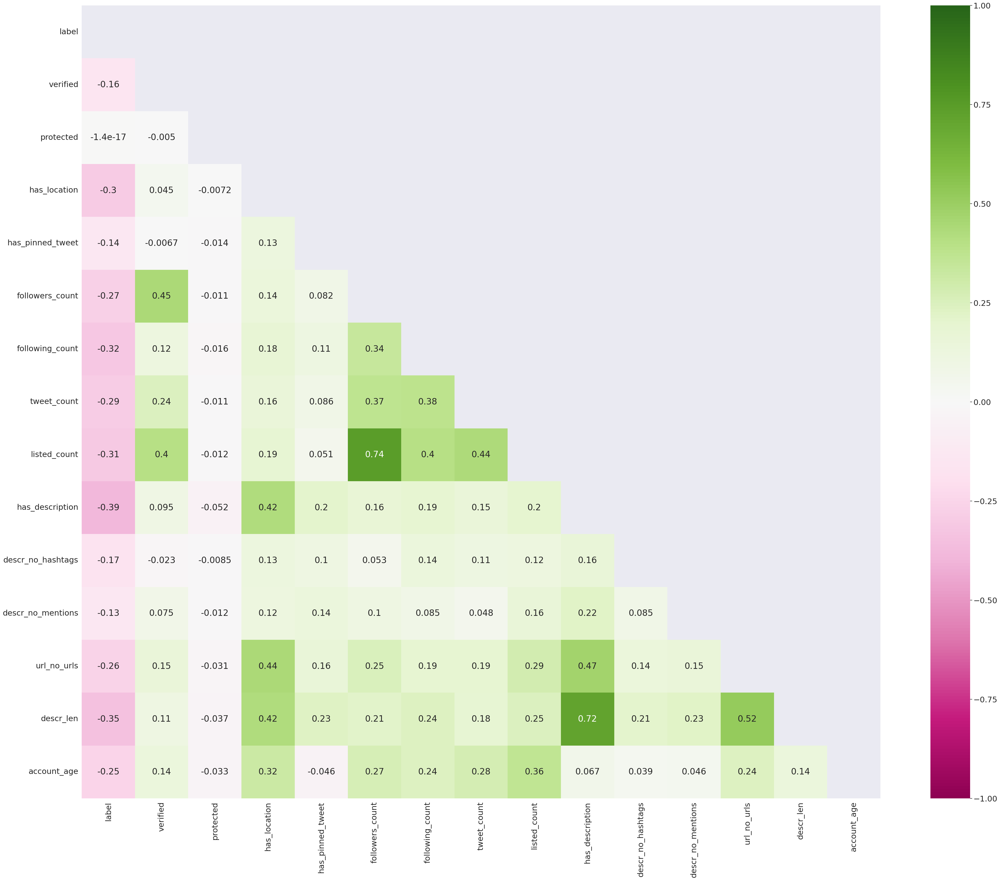

In [110]:
corr_threshold2 = 0.52
corr2 = train_data_wo_outliers.corr()
lower_tri2 = corr2.where(np.tril(np.ones(corr2.shape),k=-1).astype(bool)) #creating lower triangular correlation matrix
f = plt.figure(figsize=(50, 40))
sns.heatmap(lower_tri2, cmap="PiYG", annot=True, vmin=-1, vmax=1, ax=plt.gca()) #, annot_kws={"fontsize": 16})
high_corr2 = []
for column in train_data_wo_outliers:
   for col in train_data_wo_outliers:
     if abs(lower_tri2[column][col]) > corr_threshold2:
         high_corr2.append((column, col, lower_tri2[column][col]))
high_corr2 = sorted(high_corr2, key=lambda x: x[2], reverse=True)

In [111]:
f = plt.figure(figsize=(50, 40))
sns.set(font_scale=1)

<Figure size 5000x4000 with 0 Axes>

#### Drop column with higher correlation

In [112]:
high_corr2

[('followers_count', 'listed_count', 0.7439187863704093),
 ('has_description', 'descr_len', 0.7170368734557353),
 ('url_no_urls', 'descr_len', 0.5214407041020078)]

In [113]:
train_data_wo_outliers = train_data_wo_outliers.drop(['listed_count', 'has_description', 'url_no_urls'], axis=1)
val_data_wo_outliers = val_data_wo_outliers.drop(['listed_count', 'has_description', 'url_no_urls'], axis=1)
test_data_wo_outliers = test_data_wo_outliers.drop(['listed_count', 'has_description', 'url_no_urls'], axis=1)

#### Split data for input and output

In [114]:
train_X = train_data.drop(['label'], axis=1)
train_Y = pd.concat([train_data['label']], axis=1)
val_X = val_data.drop(['label'], axis=1)
val_Y = pd.concat([val_data['label']], axis=1)
test_X = test_data.drop(['label'], axis=1)
test_Y = pd.concat([test_data['label']], axis=1)


train_data_wo_outliers_X = train_data_wo_outliers.drop(['label'], axis=1)
train_data_wo_outliers_Y = pd.concat([train_data_wo_outliers['label']], axis=1)
val_data_wo_outliers_X = val_data_wo_outliers.drop(['label'], axis=1)
val_data_wo_outliers_Y = pd.concat([val_data_wo_outliers['label']], axis=1)
test_data_wo_outliers_X = test_data_wo_outliers.drop(['label'], axis=1)
test_data_wo_outliers_Y = pd.concat([test_data_wo_outliers['label']], axis=1)

# DNN models

#### Function to load a saved neural network model

In [115]:
from keras.models import load_model

def load_model_from_file(filepath):
  model = load_model(filepath)
  return model

#### Summary of metrics based on real and predicted data by the network

In [116]:
def get_model_metrics(test_Y, out_Y):
  accuracy = accuracy_score(test_Y, out_Y)
  print('Accuracy: {}'.format(accuracy))
  # precision tp / (tp + fp)
  precision = precision_score(test_Y, out_Y, average=None)
  print('Precision: {}'.format(precision))
  # recall: tp / (tp + fn)
  recall = recall_score(test_Y, out_Y)
  print('Recall: {}'.format(recall))
  # f1: 2 tp / (2 tp + fp + fn)
  f1 = f1_score(test_Y, out_Y)
  print('F1 score: %f' % f1)
  # ROC AUC
  auc = roc_auc_score(test_Y, out_Y)
  print('ROC AUC: %f' % auc)
  return (accuracy, precision, recall, f1, auc)

#### Creating a confusion matrix

In [117]:
def create_confusion_matrix(test_Y, out_Y):
    cm = sklearn.metrics.confusion_matrix(test_Y, out_Y)

    group_counts = ["{0:0.0f}".format(value) for value in cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in cm.flatten()/np.sum(cm)]
    labels = [f"{v1}\n\n{v2}" for v1, v2 in zip(group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)

    plt.figure()
    fig = plt.figure(figsize=(4,4))
    ax = fig.add_subplot(111)

    sns.heatmap(
        cm,
        annot=labels,
        annot_kws={"size": 12},
        fmt='',
        cmap=plt.cm.Blues,
        cbar=False
    )
    ax.set_title("Confusion matrix", fontsize=14)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=12)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)
    ax.set_ylabel('True', fontsize=12)
    ax.set_xlabel('Predicted', fontsize=12)
    
    fig.show()

## Neural network models 

In [118]:
# EarlyStopping
def early_stop(metric='val_accuracy', mode = 'max', patience=50):
    return EarlyStopping(monitor='val_accuracy',
                           patience=patience,
                           restore_best_weights=True,
                           mode=mode)
# PlotLosses
def plot_losses():
    return PlotLossesCallback()

# ModelCheckpoint
def checkpoint_callback(model_name):
    return ModelCheckpoint(filepath = models_path + '/' + model_name + '.hdf5',
                            monitor = "val_accuracy",
                            save_best_only = True,
                            # save_weights_only = True,
                            verbose=1)

In [119]:
def train_model(model, model_name, train_X, train_Y, val_X, val_Y, batch_size, epochs):
    model.fit(train_X, train_Y, batch_size=batch_size, epochs=epochs,
                validation_data=(val_X, val_Y),
                callbacks=[plot_losses(),
                           early_stop(),
                           checkpoint_callback(model_name)])
    return model

## Model 1.

#### Create model

In [120]:
def create_model_1(shape, optimizer=tf.keras.optimizers.Adam(learning_rate=0.001)):
  model = Sequential()
  model.add(Input(shape=shape)),
  model.add(Dense(32, activation='sigmoid'))
  model.add(Dense(32, activation='relu'))
  model.add(Dropout(0.2))
  model.add(Dense(64, activation='relu'))
  model.add(Dense(64, activation='sigmoid'))
  model.add(Dropout(0.3))
  model.add(Dense(1, activation='sigmoid'))
  model.compile(optimizer=optimizer, loss=keras.losses.BinaryCrossentropy(), metrics=['accuracy'])
  return model

2023-08-21 21:22:29.329933: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:22:29.329995: W tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:265] failed call to cuInit: UNKNOWN ERROR (303)
2023-08-21 21:22:29.330040: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (b1d5549eec03): /proc/driver/nvidia/version does not exist
2023-08-21 21:22:29.331747: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical o

### batch_size=10, epochs=200

#### Create and train model

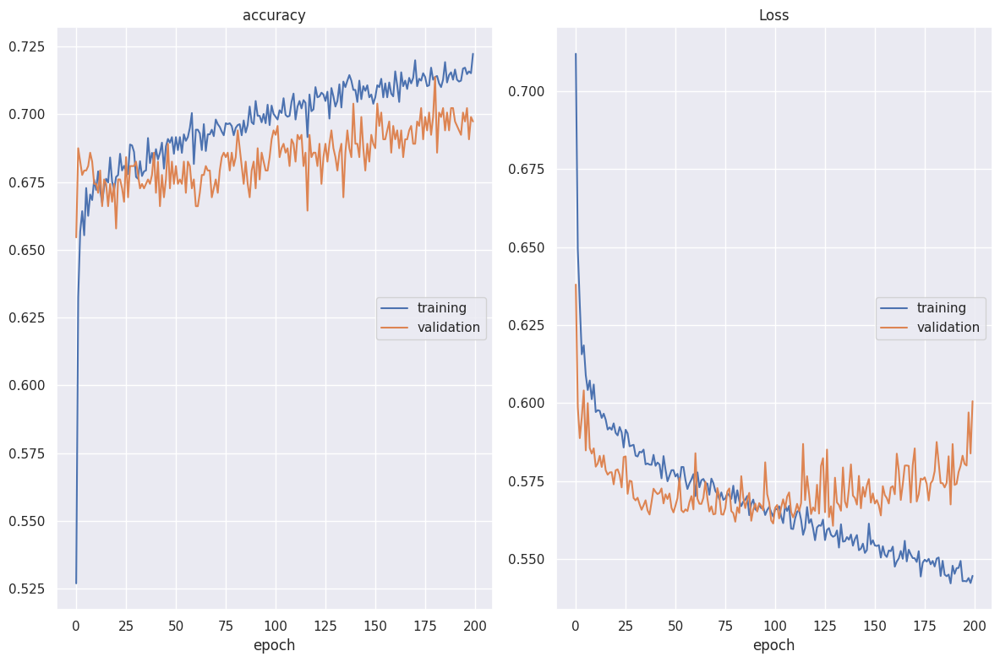

accuracy
	training         	 (min:    0.527, max:    0.722, cur:    0.722)
	validation       	 (min:    0.655, max:    0.714, cur:    0.697)
Loss
	training         	 (min:    0.542, max:    0.712, cur:    0.545)
	validation       	 (min:    0.561, max:    0.638, cur:    0.601)

Epoch 200: val_accuracy did not improve from 0.71382
293/293 [==============================] - 1s 5ms/step - loss: 0.5446 - accuracy: 0.7223 - val_loss: 0.6006 - val_accuracy: 0.6974


In [135]:
model_name = 'model_users_only_10000_1_v1_batch_size_10_epochs_200_norm'
shape = (train_X.shape[1],)
model1_v1 = create_model_1(shape=shape, optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
model1_v1 = train_model(model1_v1, model_name, train_X, train_Y, val_X, val_Y, batch_size=10, epochs=200)

#### Prediction and results

Accuracy: 0.7214983713355049
Precision: [0.73287671 0.71118012]
Recall: 0.745928338762215
F1 score: 0.728140
ROC AUC: 0.721498


(0.7214983713355049,
 array([0.73287671, 0.71118012]),
 0.745928338762215,
 0.7281399046104928,
 0.7214983713355048)

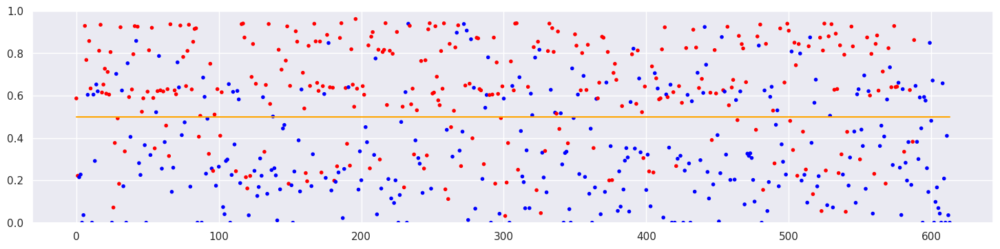

<Figure size 640x480 with 0 Axes>

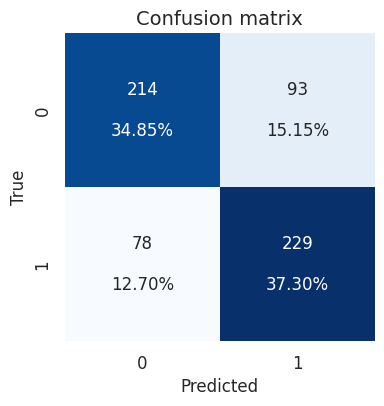

In [136]:
out_Y_org = model1_v1.predict(test_X, verbose=0)
out_Y = [0 if x < 0.5 else 1 for x in out_Y_org]

x = range(0, len(test_Y))
fig = plt.figure(figsize=(18, 4))
colors = ['blue' if val == 0. else 'red' for val in np.asarray(test_Y)]
plt.scatter(x, out_Y_org, marker='.', label ='predicted', c=colors)
# plt.plot(x, test_Y, '.', label ='real')
plt.plot(x, [0.5] * len(test_Y), c='orange')
plt.ylim((0,1))

create_confusion_matrix(test_Y, out_Y)
get_model_metrics(test_Y, out_Y)

### batch_size=50, epochs=200

In [121]:
shape = (train_X.shape[1],)
model1_v1 = create_model_1(shape=shape, optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
print(model1_v1.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                512       
                                                                 
 dense_1 (Dense)             (None, 32)                1056      
                                                                 
 dropout (Dropout)           (None, 32)                0         
                                                                 
 dense_2 (Dense)             (None, 64)                2112      
                                                                 
 dense_3 (Dense)             (None, 64)                4160      
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense_4 (Dense)             (None, 1)                 6

### Train model

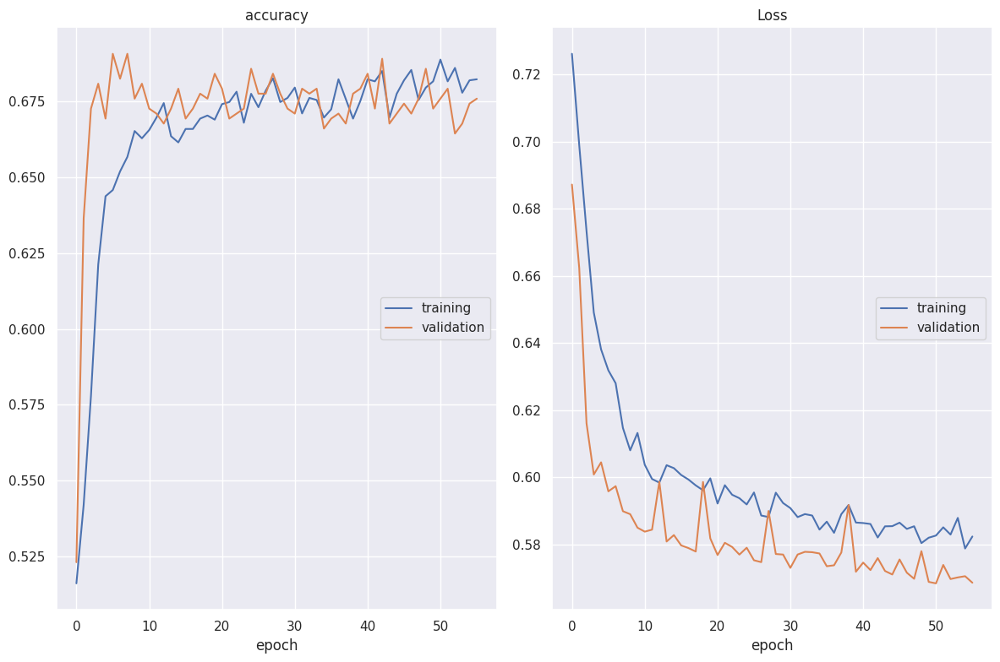

accuracy
	training         	 (min:    0.516, max:    0.689, cur:    0.682)
	validation       	 (min:    0.523, max:    0.691, cur:    0.676)
Loss
	training         	 (min:    0.579, max:    0.726, cur:    0.582)
	validation       	 (min:    0.568, max:    0.687, cur:    0.569)

Epoch 56: val_accuracy did not improve from 0.69079
59/59 [==============================] - 1s 13ms/step - loss: 0.5823 - accuracy: 0.6824 - val_loss: 0.5686 - val_accuracy: 0.6760


In [122]:
model_name = 'model_users_only_10000_1_v1_batch_size_50_epochs_200_norm'
model1_v1 = train_model(model1_v1, model_name, train_X, train_Y, val_X, val_Y, batch_size=50, epochs=200)

In [123]:
# Load model
# model = load_model_from_file(models_path + '/model_name.hdf5')

#### Prediction

In [124]:
out_Y_org = model1_v1.predict(test_X, verbose=0)
out_Y = [0 if x < 0.5 else 1 for x in out_Y_org]

#### Results

(0.0, 1.0)

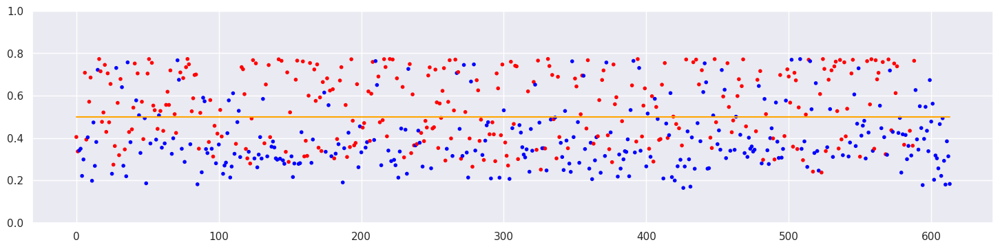

In [125]:
x = range(0, len(test_Y))
fig = plt.figure(figsize=(18, 4))
colors = ['blue' if val == 0. else 'red' for val in np.asarray(test_Y)]
plt.scatter(x, out_Y_org, marker='.', label ='predicted', c=colors)
# plt.plot(x, test_Y, '.', label ='real')
plt.plot(x, [0.5] * len(test_Y), c='orange')
plt.ylim((0,1))

#### Confusion matrix

Accuracy: 0.6872964169381107
Precision: [0.65333333 0.74058577]
Recall: 0.5765472312703583
F1 score: 0.648352
ROC AUC: 0.687296


(0.6872964169381107,
 array([0.65333333, 0.74058577]),
 0.5765472312703583,
 0.6483516483516484,
 0.6872964169381108)

<Figure size 640x480 with 0 Axes>

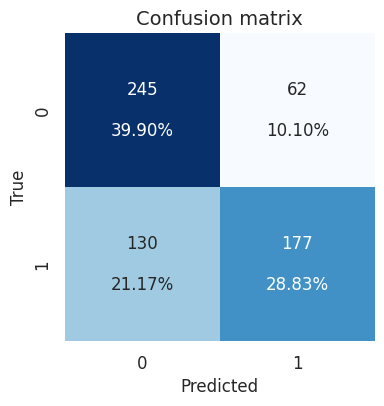

In [126]:
create_confusion_matrix(test_Y, out_Y)
get_model_metrics(test_Y, out_Y)

### batch_size=100, epochs=200

#### Create and train model

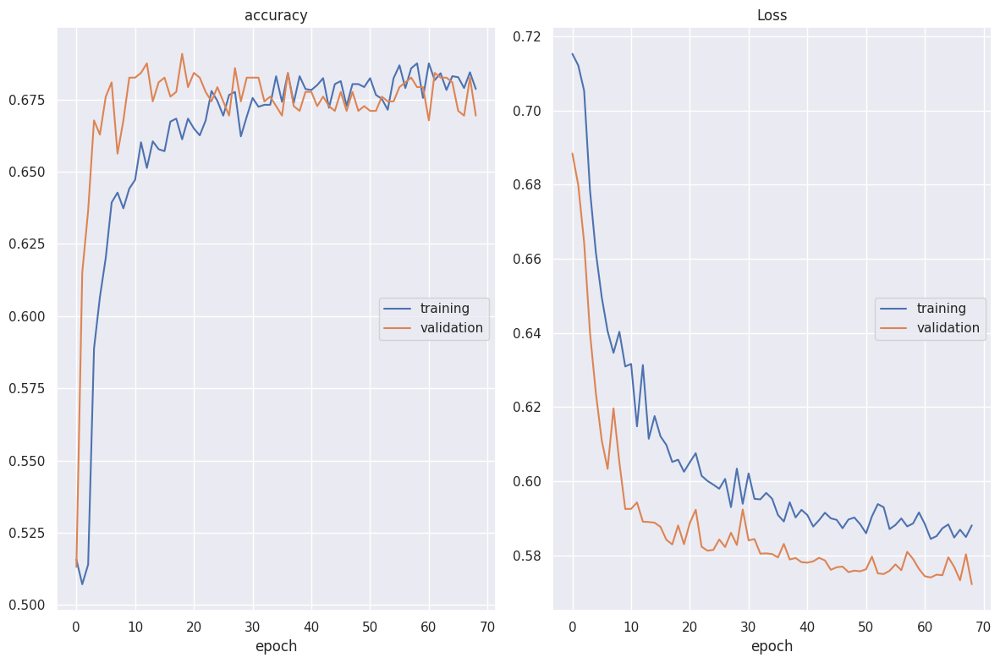

accuracy
	training         	 (min:    0.507, max:    0.688, cur:    0.679)
	validation       	 (min:    0.513, max:    0.691, cur:    0.669)
Loss
	training         	 (min:    0.584, max:    0.715, cur:    0.588)
	validation       	 (min:    0.572, max:    0.688, cur:    0.572)

Epoch 69: val_accuracy did not improve from 0.69079
30/30 [==============================] - 1s 25ms/step - loss: 0.5881 - accuracy: 0.6786 - val_loss: 0.5722 - val_accuracy: 0.6694


In [127]:
model_name = 'model_users_only_10000_1_v1_batch_size_100_epochs_200_norm'
shape = (train_X.shape[1],)
model1_v1 = create_model_1(shape=shape, optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
model1_v1 = train_model(model1_v1, model_name, train_X, train_Y, val_X, val_Y, batch_size=100, epochs=200)

#### Prediction and results

Accuracy: 0.6889250814332247
Precision: [0.65846995 0.73387097]
Recall: 0.5928338762214984
F1 score: 0.655856
ROC AUC: 0.688925


(0.6889250814332247,
 array([0.65846995, 0.73387097]),
 0.5928338762214984,
 0.6558558558558559,
 0.6889250814332247)

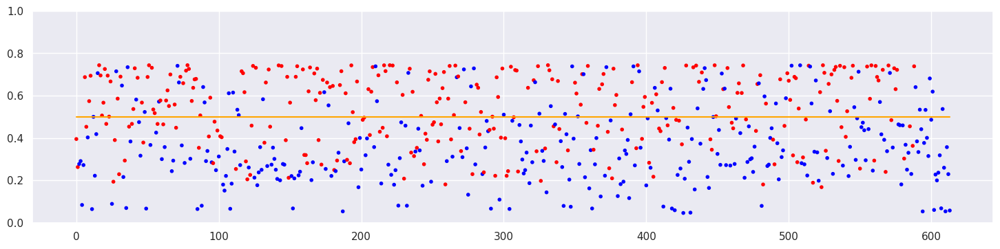

<Figure size 640x480 with 0 Axes>

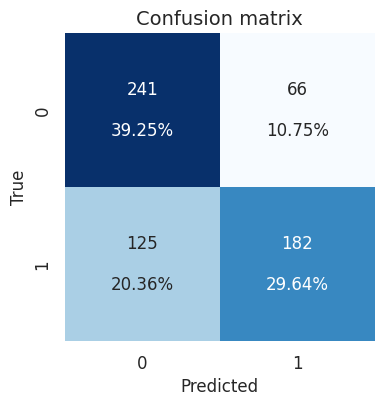

In [128]:
out_Y_org = model1_v1.predict(test_X, verbose=0)
out_Y = [0 if x < 0.5 else 1 for x in out_Y_org]

x = range(0, len(test_Y))
fig = plt.figure(figsize=(18, 4))
colors = ['blue' if val == 0. else 'red' for val in np.asarray(test_Y)]
plt.scatter(x, out_Y_org, marker='.', label ='predicted', c=colors)
# plt.plot(x, test_Y, '.', label ='real')
plt.plot(x, [0.5] * len(test_Y), c='orange')
plt.ylim((0,1))

create_confusion_matrix(test_Y, out_Y)
get_model_metrics(test_Y, out_Y)

### batch_size=150, epochs=200

#### Create and train model

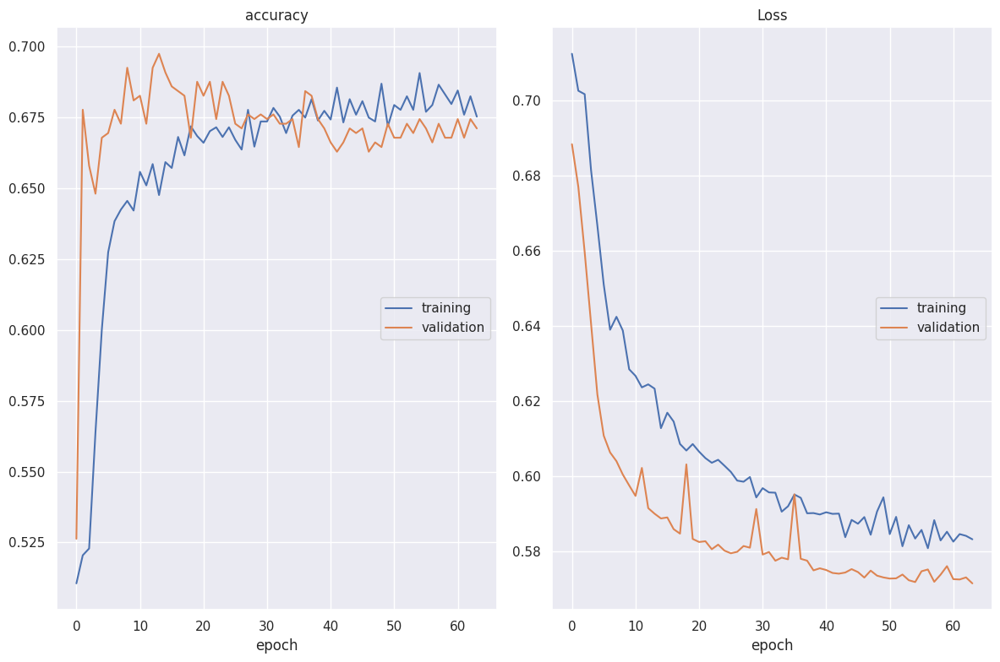

accuracy
	training         	 (min:    0.511, max:    0.691, cur:    0.675)
	validation       	 (min:    0.526, max:    0.697, cur:    0.671)
Loss
	training         	 (min:    0.581, max:    0.712, cur:    0.583)
	validation       	 (min:    0.572, max:    0.688, cur:    0.572)

Epoch 64: val_accuracy did not improve from 0.69737
20/20 [==============================] - 1s 35ms/step - loss: 0.5833 - accuracy: 0.6752 - val_loss: 0.5715 - val_accuracy: 0.6711


In [129]:
model_name = 'model_users_only_10000_1_v1_batch_size_150_epochs_200_norm'
shape = (train_X.shape[1],)
model1_v1 = create_model_1(shape=shape, optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
model1_v1 = train_model(model1_v1, model_name, train_X, train_Y, val_X, val_Y, batch_size=150, epochs=200)

#### Prediction and results

Accuracy: 0.6938110749185668
Precision: [0.67655786 0.71480144]
Recall: 0.6449511400651465
F1 score: 0.678082
ROC AUC: 0.693811


(0.6938110749185668,
 array([0.67655786, 0.71480144]),
 0.6449511400651465,
 0.678082191780822,
 0.6938110749185666)

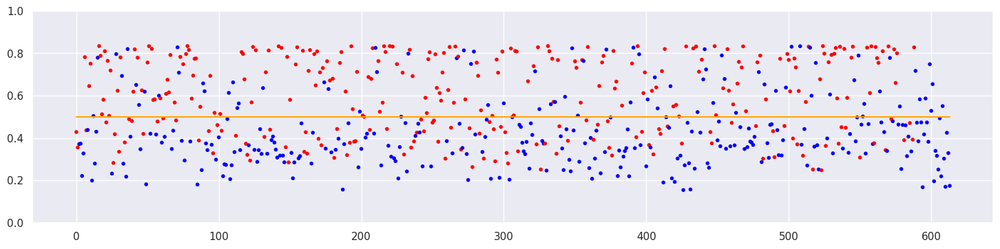

<Figure size 640x480 with 0 Axes>

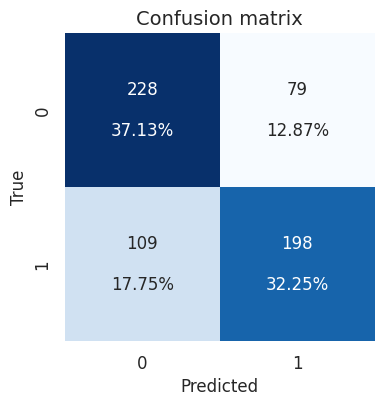

In [130]:
out_Y_org = model1_v1.predict(test_X, verbose=0)
out_Y = [0 if x < 0.5 else 1 for x in out_Y_org]

x = range(0, len(test_Y))
fig = plt.figure(figsize=(18, 4))
colors = ['blue' if val == 0. else 'red' for val in np.asarray(test_Y)]
plt.scatter(x, out_Y_org, marker='.', label ='predicted', c=colors)
# plt.plot(x, test_Y, '.', label ='real')
plt.plot(x, [0.5] * len(test_Y), c='orange')
plt.ylim((0,1))

create_confusion_matrix(test_Y, out_Y)
get_model_metrics(test_Y, out_Y)

### batch_size=200, epochs=200

#### Create and train model

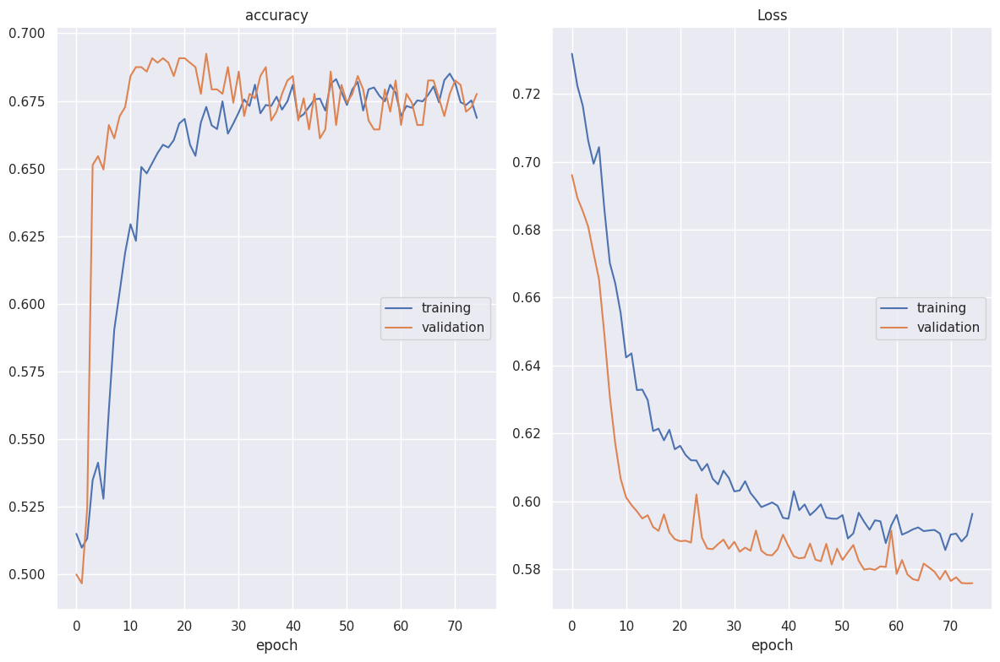

accuracy
	training         	 (min:    0.510, max:    0.685, cur:    0.669)
	validation       	 (min:    0.497, max:    0.692, cur:    0.678)
Loss
	training         	 (min:    0.586, max:    0.732, cur:    0.596)
	validation       	 (min:    0.576, max:    0.696, cur:    0.576)

Epoch 75: val_accuracy did not improve from 0.69243
15/15 [==============================] - 1s 48ms/step - loss: 0.5964 - accuracy: 0.6687 - val_loss: 0.5759 - val_accuracy: 0.6776


In [131]:
model_name = 'model_users_only_10000_1_v1_batch_size_200_epochs_200_norm'
shape = (train_X.shape[1],)
model1_v1 = create_model_1(shape=shape, optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
model1_v1 = train_model(model1_v1, model_name, train_X, train_Y, val_X, val_Y, batch_size=200, epochs=200)

#### Prediction and results

Accuracy: 0.6938110749185668
Precision: [0.66951567 0.72623574]
Recall: 0.6221498371335505
F1 score: 0.670175
ROC AUC: 0.693811


(0.6938110749185668,
 array([0.66951567, 0.72623574]),
 0.6221498371335505,
 0.6701754385964912,
 0.6938110749185669)

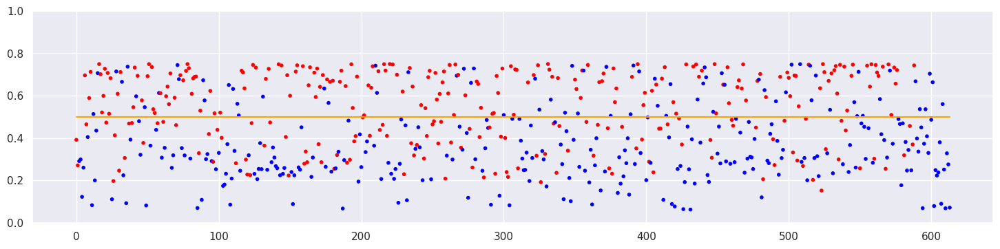

<Figure size 640x480 with 0 Axes>

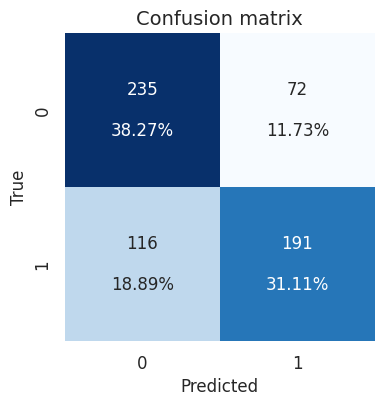

In [132]:
out_Y_org = model1_v1.predict(test_X, verbose=0)
out_Y = [0 if x < 0.5 else 1 for x in out_Y_org]

x = range(0, len(test_Y))
fig = plt.figure(figsize=(18, 4))
colors = ['blue' if val == 0. else 'red' for val in np.asarray(test_Y)]
plt.scatter(x, out_Y_org, marker='.', label ='predicted', c=colors)
# plt.plot(x, test_Y, '.', label ='real')
plt.plot(x, [0.5] * len(test_Y), c='orange')
plt.ylim((0,1))

create_confusion_matrix(test_Y, out_Y)
get_model_metrics(test_Y, out_Y)

### batch_size=250, epochs=200

#### Create and train model

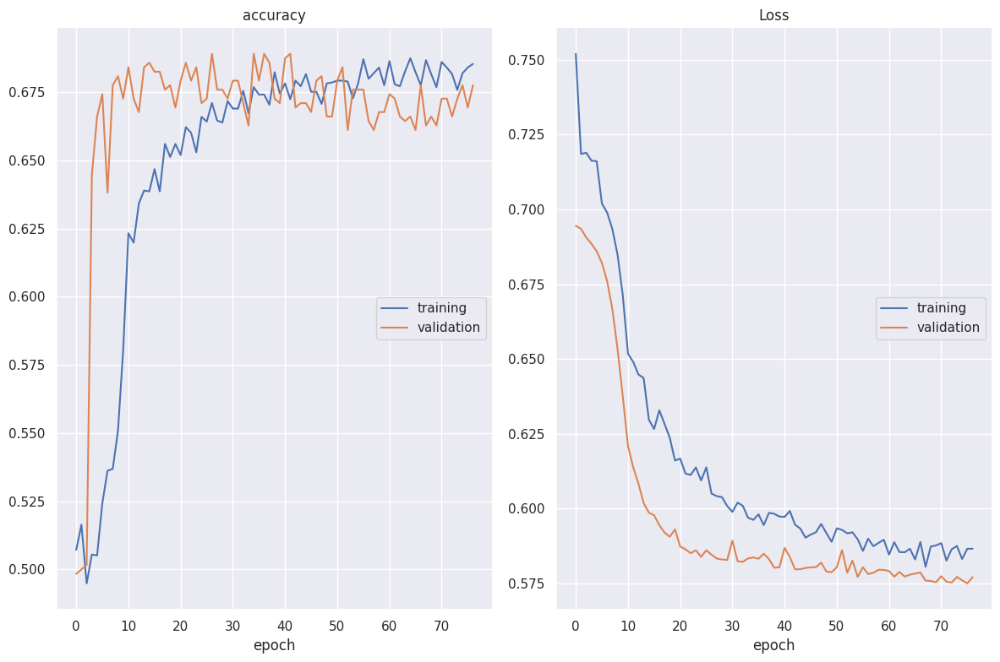

accuracy
	training         	 (min:    0.495, max:    0.688, cur:    0.685)
	validation       	 (min:    0.498, max:    0.689, cur:    0.678)
Loss
	training         	 (min:    0.581, max:    0.752, cur:    0.587)
	validation       	 (min:    0.575, max:    0.694, cur:    0.577)

Epoch 77: val_accuracy did not improve from 0.68914
12/12 [==============================] - 1s 61ms/step - loss: 0.5866 - accuracy: 0.6855 - val_loss: 0.5771 - val_accuracy: 0.6776


In [133]:
model_name = 'model_users_only_10000_1_v1_batch_size_250_epochs_200_norm'
shape = (train_X.shape[1],)
model1_v1 = create_model_1(shape=shape, optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
model1_v1 = train_model(model1_v1, model_name, train_X, train_Y, val_X, val_Y, batch_size=250, epochs=200)

#### Prediction and results

Accuracy: 0.6921824104234527
Precision: [0.6809816  0.70486111]
Recall: 0.6612377850162866
F1 score: 0.682353
ROC AUC: 0.692182


(0.6921824104234527,
 array([0.6809816 , 0.70486111]),
 0.6612377850162866,
 0.6823529411764706,
 0.6921824104234526)

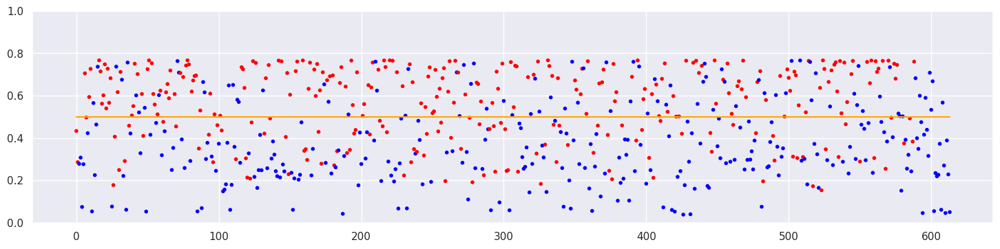

<Figure size 640x480 with 0 Axes>

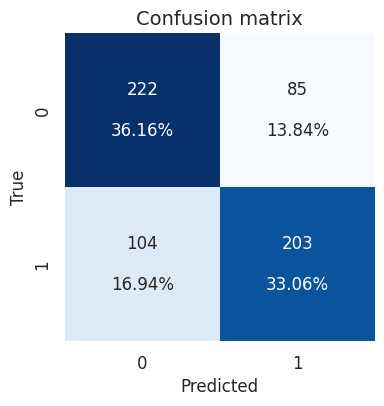

In [134]:
out_Y_org = model1_v1.predict(test_X, verbose=0)
out_Y = [0 if x < 0.5 else 1 for x in out_Y_org]

x = range(0, len(test_Y))
fig = plt.figure(figsize=(18, 4))
colors = ['blue' if val == 0. else 'red' for val in np.asarray(test_Y)]
plt.scatter(x, out_Y_org, marker='.', label ='predicted', c=colors)
# plt.plot(x, test_Y, '.', label ='real')
plt.plot(x, [0.5] * len(test_Y), c='orange')
plt.ylim((0,1))

create_confusion_matrix(test_Y, out_Y)
get_model_metrics(test_Y, out_Y)

### Model 1. - version for data reduced by outliers

### batch_size=10, epochs=200

#### Create and train model

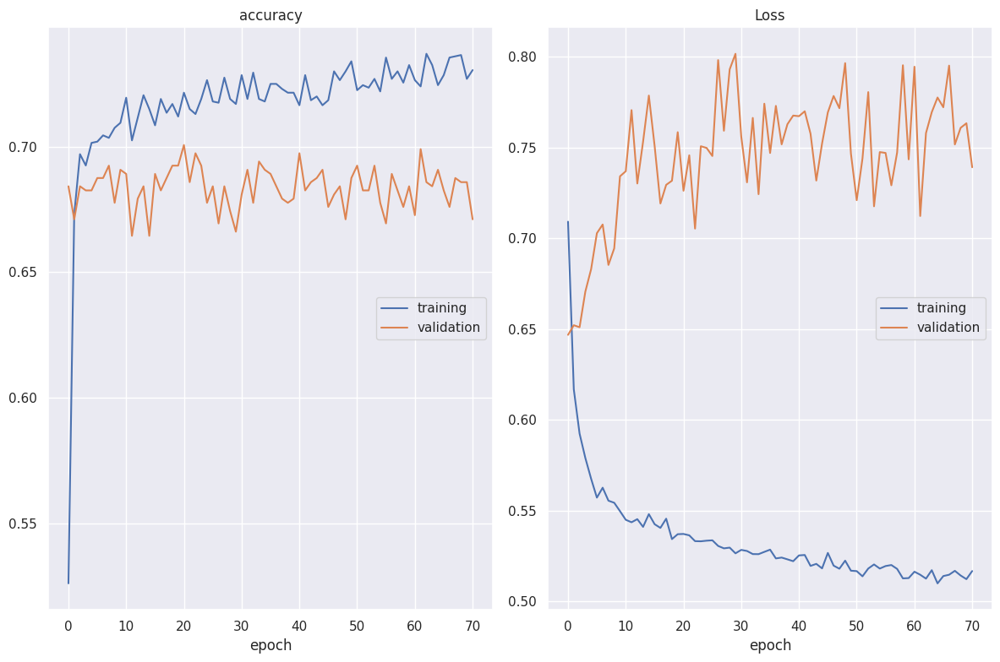

accuracy
	training         	 (min:    0.526, max:    0.737, cur:    0.730)
	validation       	 (min:    0.664, max:    0.701, cur:    0.671)
Loss
	training         	 (min:    0.510, max:    0.709, cur:    0.517)
	validation       	 (min:    0.647, max:    0.802, cur:    0.739)

Epoch 71: val_accuracy did not improve from 0.70066
200/200 [==============================] - 1s 5ms/step - loss: 0.5167 - accuracy: 0.7305 - val_loss: 0.7391 - val_accuracy: 0.6711


In [163]:
model_name = 'model_users_only_10000_1_v2_wo_outliers_batch_size_10_epochs_200_norm'
shape = (train_data_wo_outliers_X.shape[1],)
model1_v2 = create_model_1(shape=shape, optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
# print(model.summary())
model1_v2 = train_model(model1_v2, model_name, train_data_wo_outliers_X, train_data_wo_outliers_Y, val_data_wo_outliers_X, val_data_wo_outliers_Y, batch_size=10, epochs=200)

#### Prediction and results

Accuracy: 0.7182410423452769
Precision: [0.709375   0.72789116]
Recall: 0.6970684039087948
F1 score: 0.712146
ROC AUC: 0.718241


(0.7182410423452769,
 array([0.709375  , 0.72789116]),
 0.6970684039087948,
 0.7121464226289517,
 0.7182410423452769)

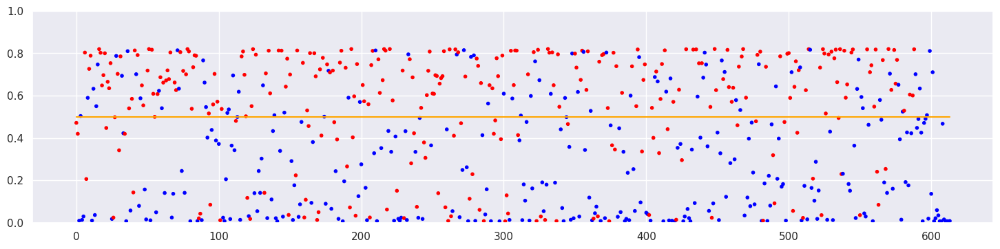

<Figure size 640x480 with 0 Axes>

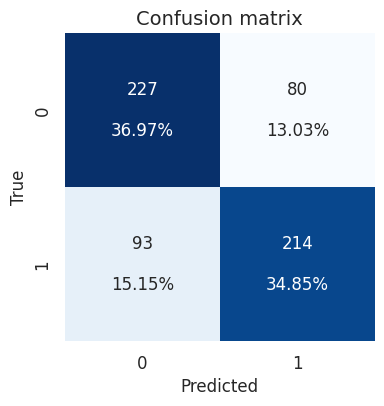

In [164]:
out_Y_org_wo_outliers = model1_v2.predict(test_data_wo_outliers_X, verbose=0)
out_Y_wo_outliers = [0 if x < 0.5 else 1 for x in out_Y_org_wo_outliers]

x = range(0, len(test_data_wo_outliers_Y))
fig = plt.figure(figsize=(18, 4))
colors = ['blue' if val == 0. else 'red' for val in np.asarray(test_data_wo_outliers_Y)]
plt.scatter(x, out_Y_org_wo_outliers, marker='.', label ='predicted', c=colors)
# plt.plot(x, test_Y, '.', label ='real')
plt.plot(x, [0.5] * len(test_Y), c='orange')
plt.ylim((0,1))

create_confusion_matrix(test_data_wo_outliers_Y, out_Y_wo_outliers)
get_model_metrics(test_data_wo_outliers_Y, out_Y_wo_outliers)

### batch_size=50, epochs=200

#### Create and train model

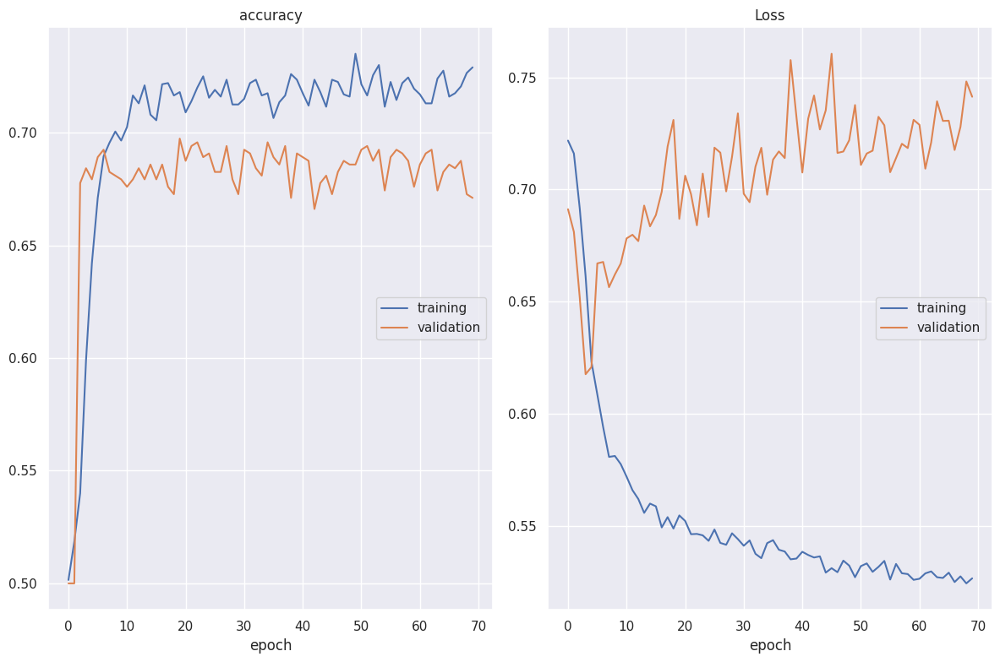

accuracy
	training         	 (min:    0.502, max:    0.735, cur:    0.729)
	validation       	 (min:    0.500, max:    0.697, cur:    0.671)
Loss
	training         	 (min:    0.524, max:    0.722, cur:    0.527)
	validation       	 (min:    0.618, max:    0.761, cur:    0.741)

Epoch 70: val_accuracy did not improve from 0.69737
40/40 [==============================] - 1s 18ms/step - loss: 0.5266 - accuracy: 0.7290 - val_loss: 0.7414 - val_accuracy: 0.6711


In [139]:
model_name = 'model_users_only_10000_1_v2_wo_outliers_batch_size_50_epochs_200_norm'
shape = (train_data_wo_outliers_X.shape[1],)
model1_v2 = create_model_1(shape=shape, optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
# print(model.summary())
model1_v2 = train_model(model1_v2, model_name, train_data_wo_outliers_X, train_data_wo_outliers_Y, val_data_wo_outliers_X, val_data_wo_outliers_Y, batch_size=50, epochs=200)

#### Prediction and results

Accuracy: 0.7231270358306189
Precision: [0.71339564 0.7337884 ]
Recall: 0.7003257328990228
F1 score: 0.716667
ROC AUC: 0.723127


(0.7231270358306189,
 array([0.71339564, 0.7337884 ]),
 0.7003257328990228,
 0.7166666666666668,
 0.7231270358306188)

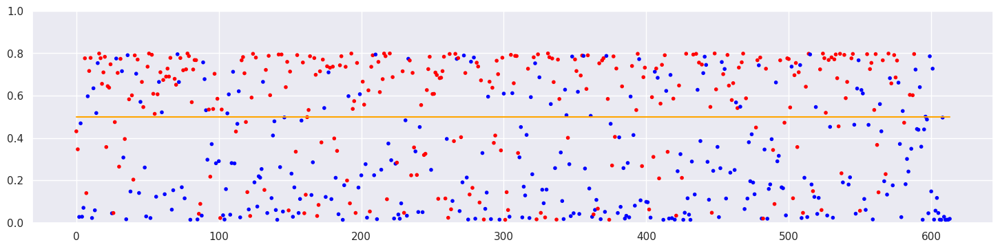

<Figure size 640x480 with 0 Axes>

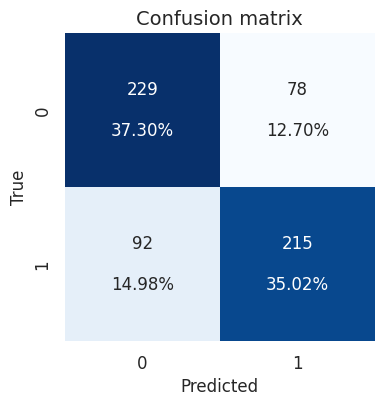

In [140]:
out_Y_org_wo_outliers = model1_v2.predict(test_data_wo_outliers_X, verbose=0)
out_Y_wo_outliers = [0 if x < 0.5 else 1 for x in out_Y_org_wo_outliers]

x = range(0, len(test_data_wo_outliers_Y))
fig = plt.figure(figsize=(18, 4))
colors = ['blue' if val == 0. else 'red' for val in np.asarray(test_data_wo_outliers_Y)]
plt.scatter(x, out_Y_org_wo_outliers, marker='.', label ='predicted', c=colors)
# plt.plot(x, test_Y, '.', label ='real')
plt.plot(x, [0.5] * len(test_Y), c='orange')
plt.ylim((0,1))

create_confusion_matrix(test_data_wo_outliers_Y, out_Y_wo_outliers)
get_model_metrics(test_data_wo_outliers_Y, out_Y_wo_outliers)

### batch_size=100, epochs=200

#### Create and train model

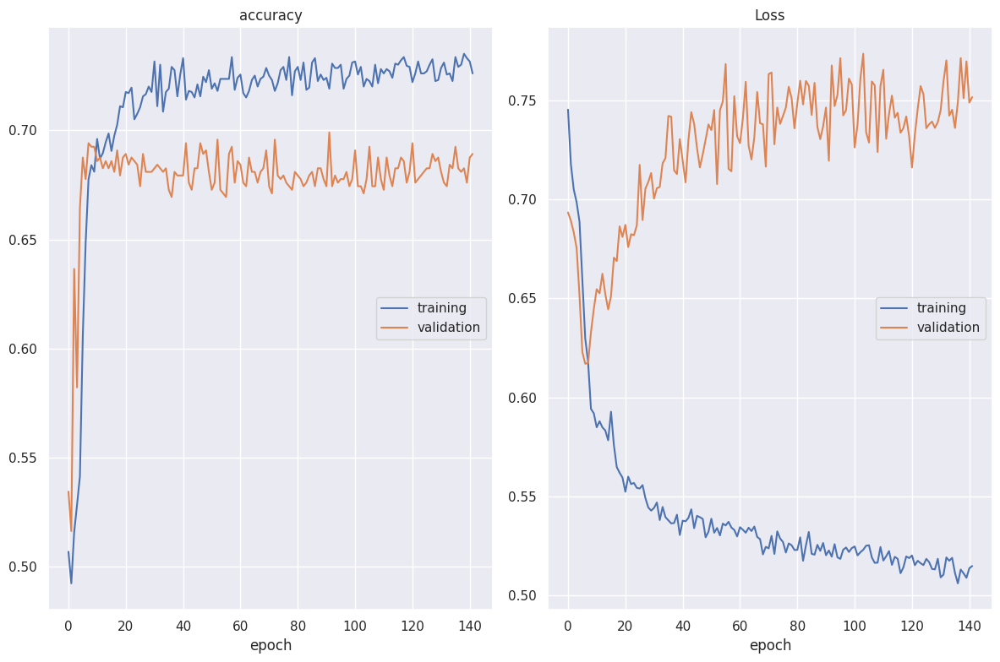

accuracy
	training         	 (min:    0.493, max:    0.735, cur:    0.726)
	validation       	 (min:    0.516, max:    0.699, cur:    0.689)
Loss
	training         	 (min:    0.506, max:    0.745, cur:    0.515)
	validation       	 (min:    0.617, max:    0.773, cur:    0.752)

Epoch 142: val_accuracy did not improve from 0.69901
20/20 [==============================] - 1s 53ms/step - loss: 0.5150 - accuracy: 0.7260 - val_loss: 0.7515 - val_accuracy: 0.6891


In [141]:
model_name = 'model_users_only_10000_1_v2_wo_outliers_batch_size_100_epochs_200_norm'
shape = (train_data_wo_outliers_X.shape[1],)
model1_v2 = create_model_1(shape=shape, optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
# print(model.summary())
model1_v2 = train_model(model1_v2, model_name, train_data_wo_outliers_X, train_data_wo_outliers_Y, val_data_wo_outliers_X, val_data_wo_outliers_Y, batch_size=100, epochs=200)

#### Prediction and results

Accuracy: 0.7231270358306189
Precision: [0.70570571 0.74377224]
Recall: 0.6807817589576547
F1 score: 0.710884
ROC AUC: 0.723127


(0.7231270358306189,
 array([0.70570571, 0.74377224]),
 0.6807817589576547,
 0.7108843537414966,
 0.7231270358306189)

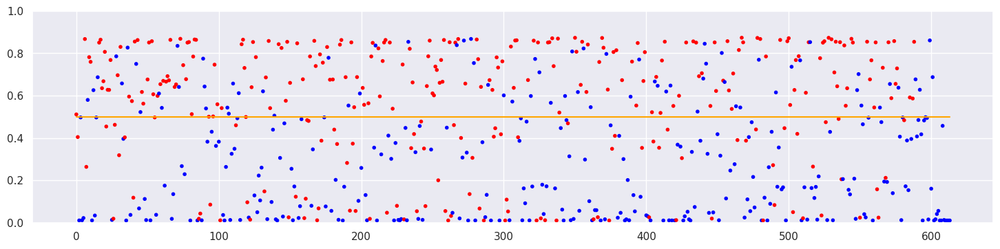

<Figure size 640x480 with 0 Axes>

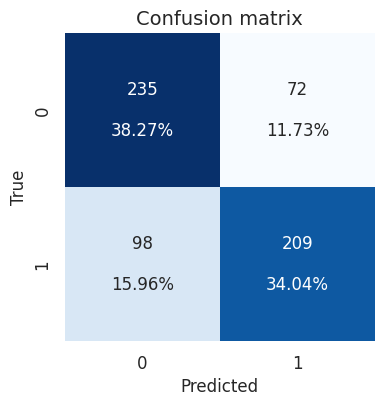

In [142]:
out_Y_org_wo_outliers = model1_v2.predict(test_data_wo_outliers_X, verbose=0)
out_Y_wo_outliers = [0 if x < 0.5 else 1 for x in out_Y_org_wo_outliers]

x = range(0, len(test_data_wo_outliers_Y))
fig = plt.figure(figsize=(18, 4))
colors = ['blue' if val == 0. else 'red' for val in np.asarray(test_data_wo_outliers_Y)]
plt.scatter(x, out_Y_org_wo_outliers, marker='.', label ='predicted', c=colors)
# plt.plot(x, test_Y, '.', label ='real')
plt.plot(x, [0.5] * len(test_Y), c='orange')
plt.ylim((0,1))

create_confusion_matrix(test_data_wo_outliers_Y, out_Y_wo_outliers)
get_model_metrics(test_data_wo_outliers_Y, out_Y_wo_outliers)

### batch_size=150, epochs=200

#### Create and train model

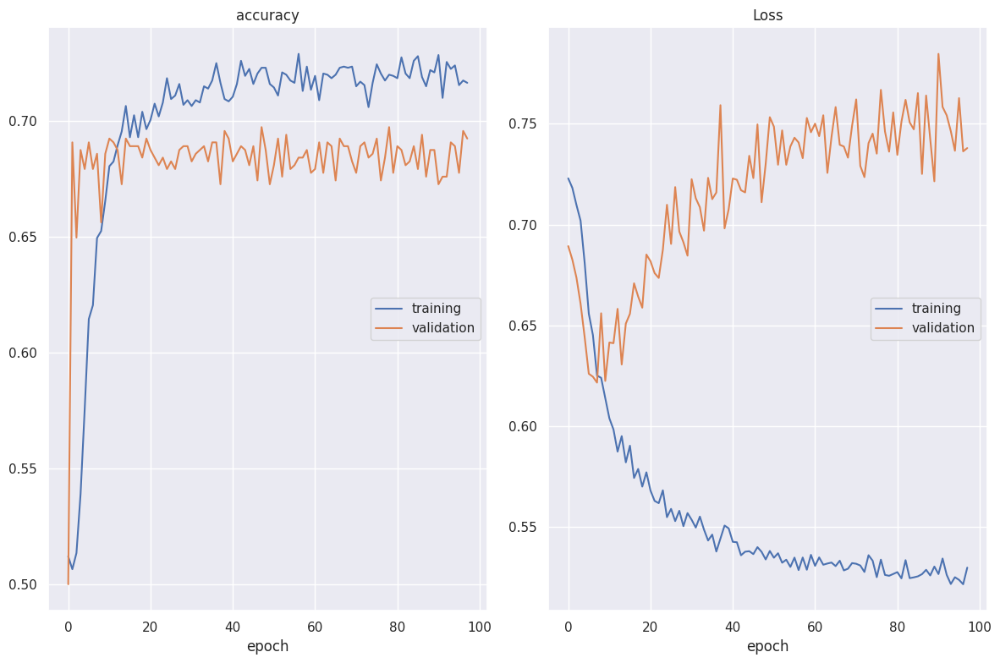

accuracy
	training         	 (min:    0.507, max:    0.729, cur:    0.716)
	validation       	 (min:    0.500, max:    0.697, cur:    0.692)
Loss
	training         	 (min:    0.521, max:    0.723, cur:    0.530)
	validation       	 (min:    0.622, max:    0.785, cur:    0.738)

Epoch 98: val_accuracy did not improve from 0.69737
14/14 [==============================] - 1s 47ms/step - loss: 0.5297 - accuracy: 0.7165 - val_loss: 0.7380 - val_accuracy: 0.6924


In [143]:
model_name = 'model_users_only_10000_1_v2_wo_outliers_batch_size_150_epochs_200_norm'
shape = (train_data_wo_outliers_X.shape[1],)
model1_v2 = create_model_1(shape=shape, optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
# print(model.summary())
model1_v2 = train_model(model1_v2, model_name, train_data_wo_outliers_X, train_data_wo_outliers_Y, val_data_wo_outliers_X, val_data_wo_outliers_Y, batch_size=150, epochs=200)

#### Prediction and results

Accuracy: 0.7231270358306189
Precision: [0.7120743  0.73539519]
Recall: 0.6970684039087948
F1 score: 0.715719
ROC AUC: 0.723127


(0.7231270358306189,
 array([0.7120743 , 0.73539519]),
 0.6970684039087948,
 0.7157190635451506,
 0.7231270358306188)

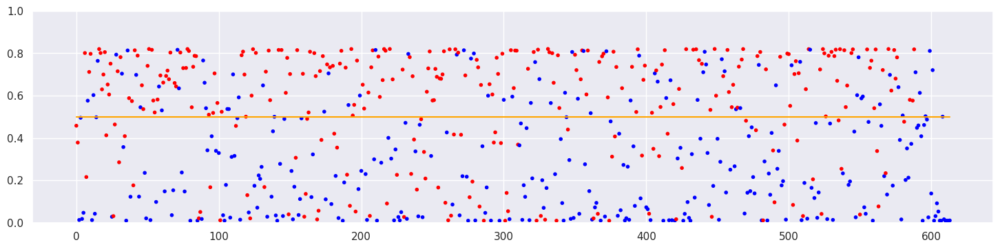

<Figure size 640x480 with 0 Axes>

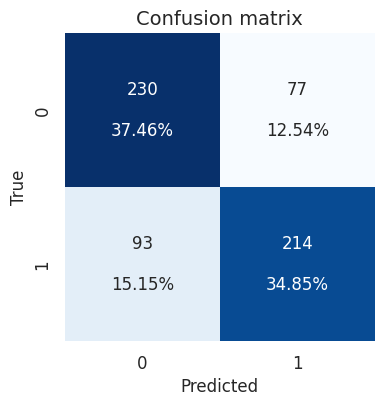

In [144]:
out_Y_org_wo_outliers = model1_v2.predict(test_data_wo_outliers_X, verbose=0)
out_Y_wo_outliers = [0 if x < 0.5 else 1 for x in out_Y_org_wo_outliers]

x = range(0, len(test_data_wo_outliers_Y))
fig = plt.figure(figsize=(18, 4))
colors = ['blue' if val == 0. else 'red' for val in np.asarray(test_data_wo_outliers_Y)]
plt.scatter(x, out_Y_org_wo_outliers, marker='.', label ='predicted', c=colors)
# plt.plot(x, test_Y, '.', label ='real')
plt.plot(x, [0.5] * len(test_Y), c='orange')
plt.ylim((0,1))

create_confusion_matrix(test_data_wo_outliers_Y, out_Y_wo_outliers)
get_model_metrics(test_data_wo_outliers_Y, out_Y_wo_outliers)

### batch_size=200, epochs=200

#### Create and train model

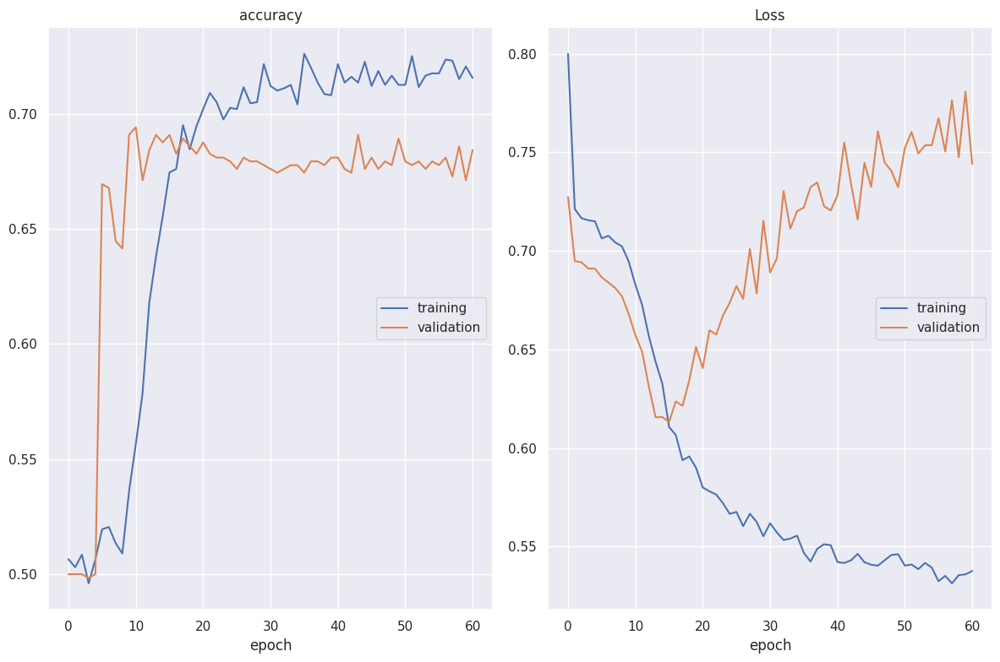

accuracy
	training         	 (min:    0.496, max:    0.726, cur:    0.715)
	validation       	 (min:    0.498, max:    0.694, cur:    0.684)
Loss
	training         	 (min:    0.531, max:    0.800, cur:    0.538)
	validation       	 (min:    0.613, max:    0.781, cur:    0.744)

Epoch 61: val_accuracy did not improve from 0.69408
10/10 [==============================] - 1s 68ms/step - loss: 0.5377 - accuracy: 0.7155 - val_loss: 0.7441 - val_accuracy: 0.6842


In [145]:
model_name = 'model_users_only_10000_1_v2_wo_outliers_batch_size_200_epochs_200_norm'
shape = (train_data_wo_outliers_X.shape[1],)
model1_v2 = create_model_1(shape=shape, optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
# print(model.summary())
model1_v2 = train_model(model1_v2, model_name, train_data_wo_outliers_X, train_data_wo_outliers_Y, val_data_wo_outliers_X, val_data_wo_outliers_Y, batch_size=200, epochs=200)

#### Prediction and results

Accuracy: 0.7003257328990228
Precision: [0.66757493 0.74898785]
Recall: 0.6026058631921825
F1 score: 0.667870
ROC AUC: 0.700326


(0.7003257328990228,
 array([0.66757493, 0.74898785]),
 0.6026058631921825,
 0.6678700361010831,
 0.7003257328990228)

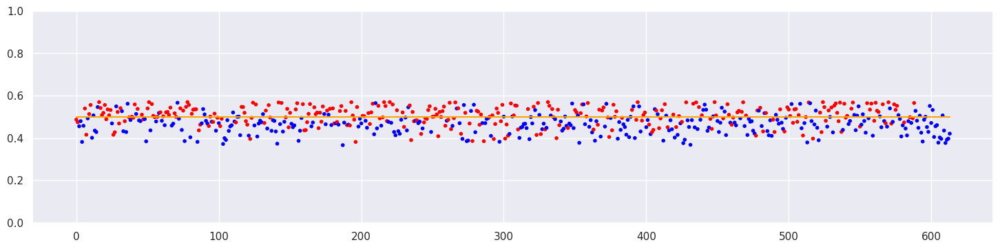

<Figure size 640x480 with 0 Axes>

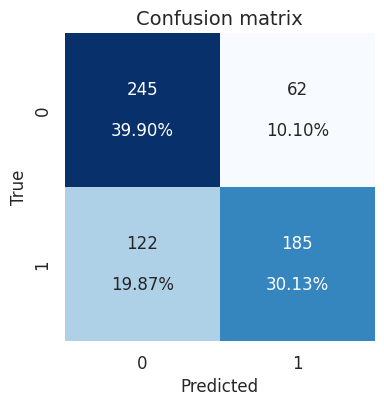

In [146]:
out_Y_org_wo_outliers = model1_v2.predict(test_data_wo_outliers_X, verbose=0)
out_Y_wo_outliers = [0 if x < 0.5 else 1 for x in out_Y_org_wo_outliers]

x = range(0, len(test_data_wo_outliers_Y))
fig = plt.figure(figsize=(18, 4))
colors = ['blue' if val == 0. else 'red' for val in np.asarray(test_data_wo_outliers_Y)]
plt.scatter(x, out_Y_org_wo_outliers, marker='.', label ='predicted', c=colors)
# plt.plot(x, test_Y, '.', label ='real')
plt.plot(x, [0.5] * len(test_Y), c='orange')
plt.ylim((0,1))

create_confusion_matrix(test_data_wo_outliers_Y, out_Y_wo_outliers)
get_model_metrics(test_data_wo_outliers_Y, out_Y_wo_outliers)

### batch_size=250, epochs=200

#### Create and train model

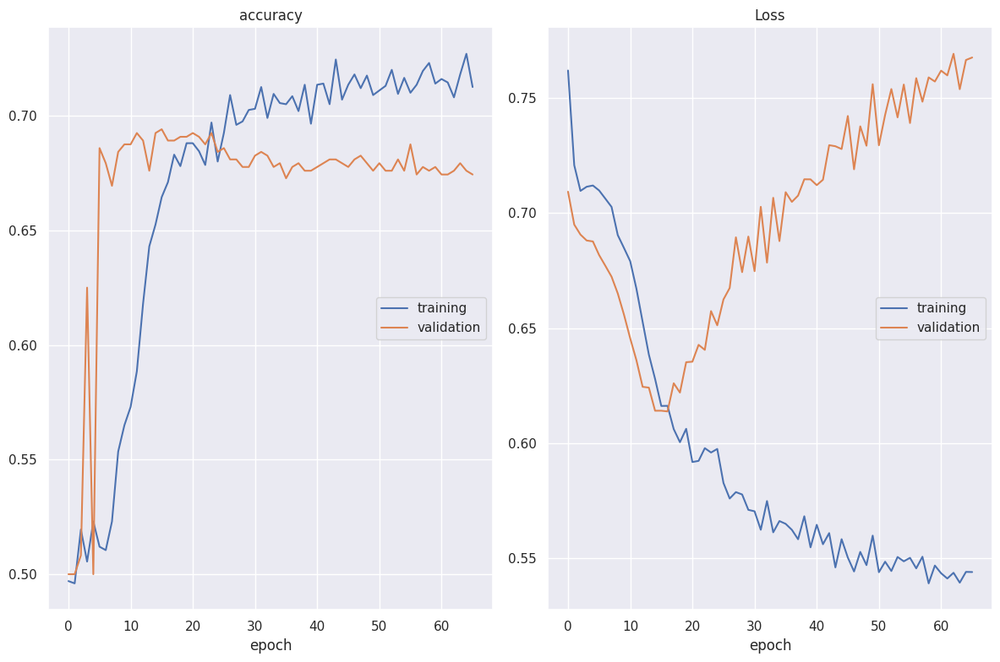

accuracy
	training         	 (min:    0.496, max:    0.727, cur:    0.712)
	validation       	 (min:    0.500, max:    0.694, cur:    0.674)
Loss
	training         	 (min:    0.539, max:    0.762, cur:    0.544)
	validation       	 (min:    0.614, max:    0.769, cur:    0.768)

Epoch 66: val_accuracy did not improve from 0.69408
8/8 [==============================] - 1s 85ms/step - loss: 0.5440 - accuracy: 0.7125 - val_loss: 0.7676 - val_accuracy: 0.6743


In [147]:
model_name = 'model_users_only_10000_1_v2_wo_outliers_batch_size_250_epochs_200_norm'
shape = (train_data_wo_outliers_X.shape[1],)
model1_v2 = create_model_1(shape=shape, optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
# print(model.summary())
model1_v2 = train_model(model1_v2, model_name, train_data_wo_outliers_X, train_data_wo_outliers_Y, val_data_wo_outliers_X, val_data_wo_outliers_Y, batch_size=250, epochs=200)

#### Prediction and results

Accuracy: 0.6938110749185668
Precision: [0.64619165 0.78743961]
Recall: 0.5309446254071661
F1 score: 0.634241
ROC AUC: 0.693811


(0.6938110749185668,
 array([0.64619165, 0.78743961]),
 0.5309446254071661,
 0.6342412451361867,
 0.6938110749185666)

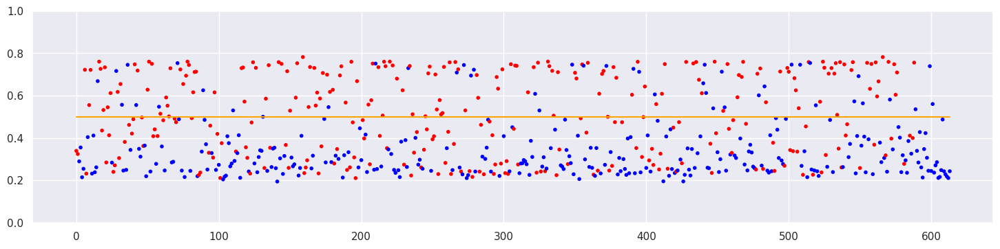

<Figure size 640x480 with 0 Axes>

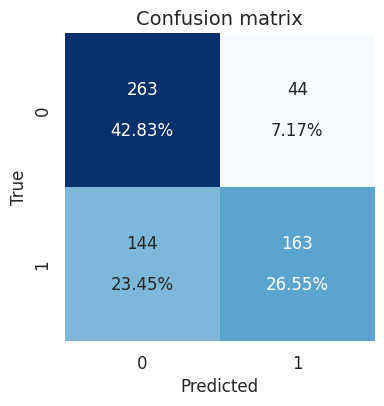

In [148]:
out_Y_org_wo_outliers = model1_v2.predict(test_data_wo_outliers_X, verbose=0)
out_Y_wo_outliers = [0 if x < 0.5 else 1 for x in out_Y_org_wo_outliers]

x = range(0, len(test_data_wo_outliers_Y))
fig = plt.figure(figsize=(18, 4))
colors = ['blue' if val == 0. else 'red' for val in np.asarray(test_data_wo_outliers_Y)]
plt.scatter(x, out_Y_org_wo_outliers, marker='.', label ='predicted', c=colors)
# plt.plot(x, test_Y, '.', label ='real')
plt.plot(x, [0.5] * len(test_Y), c='orange')
plt.ylim((0,1))

create_confusion_matrix(test_data_wo_outliers_Y, out_Y_wo_outliers)
get_model_metrics(test_data_wo_outliers_Y, out_Y_wo_outliers)

## SHAP (SHapley Additive exPlanations) - done for model 1 v1

In [255]:
# shape = (train_X.shape[1],)
# model = create_model_1(shape=shape, optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
# # print(model.summary())

In [256]:
# explainer = shap.DeepExplainer(model, np.asarray(train_X))
# shap_values = explainer.shap_values(np.asarray(train_X))

/opt/conda/lib/python3.7/site-packages/shap/explainers/_deep/deep_tf.py:102: UserWarning:

keras is no longer supported, please use tf.keras instead.

/opt/conda/lib/python3.7/site-packages/shap/explainers/_deep/deep_tf.py:107: UserWarning:

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.

/home/jupyter/.local/lib/python3.7/site-packages/keras/backend.py:452: UserWarning:

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.



Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


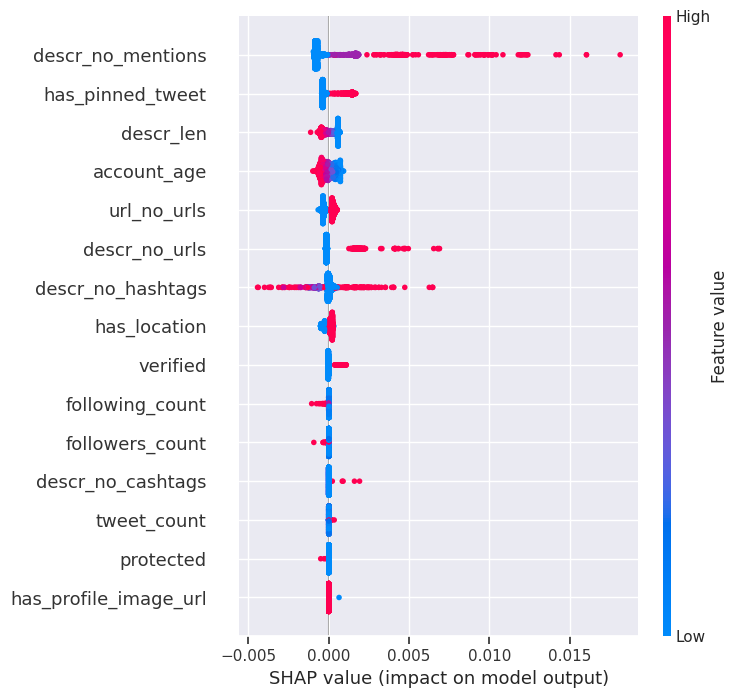

In [257]:
# shap.summary_plot(shap_values[0], train_X, plot_type='dot')

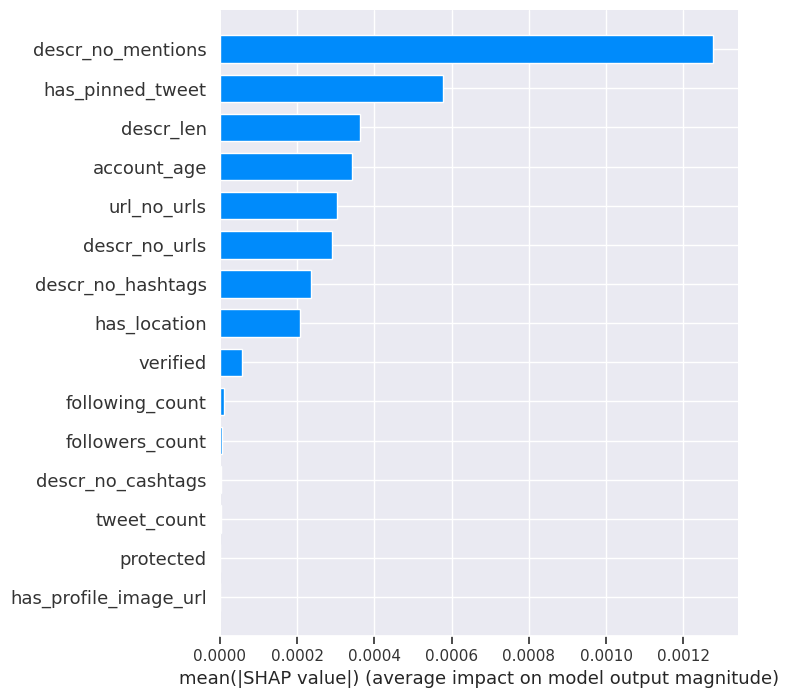

In [258]:
# shap.summary_plot(shap_values[0], train_X, plot_type='bar')

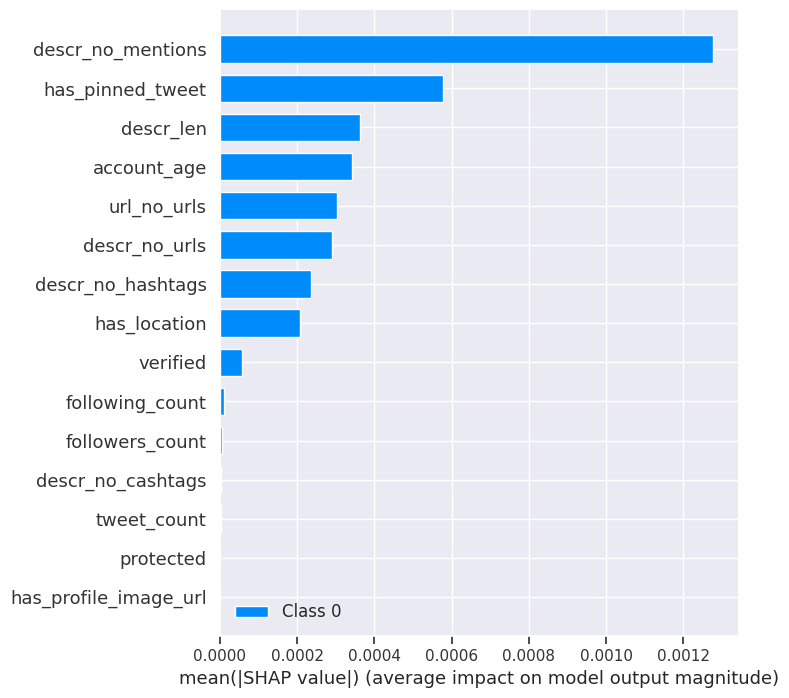

In [259]:
# shap.summary_plot(shap_values, train_X, plot_type='bar')

In [260]:
# # shap.dependence_plot("followers_count", shap_values[0],  train_X)

### Grid search for finding the most optimal set of parameters

In [261]:
# from sklearn.model_selection import GridSearchCV
# from scikeras.wrappers import KerasClassifier

In [ ]:
# model_wrapper = KerasClassifier(model=create_model_1(shape=(train_X.shape[1],)))
# # model_wrapper.get_params().keys()

# early_stop_sg = EarlyStopping(monitor='accuracy',
#                            patience=50,
#                            restore_best_weights=True,
#                            mode='max')

# parameters = {
#     'optimizer' : [tf.keras.optimizers.Adam(learning_rate=0.0001), tf.keras.optimizers.Adam(learning_rate=0.001), tf.keras.optimizers.Adam(learning_rate=0.01)],
#     'batch_size' : [10, 20, 40, 60, 80, 100, 150, 200, 250],
#     'epochs' : [10, 50, 100],
#     'callbacks' : [early_stop_sg]}


# dnn_model_grid = GridSearchCV(estimator=model_wrapper,
#                         param_grid=parameters,
#                         scoring='accuracy',
#                         cv=5,
#                         n_jobs=10,
#                         verbose=0)


# dnn_model_grid.fit(train_X, train_Y)

INFO:tensorflow:Assets written to: ram://d1a6fd5689004358a6cc37e2eb8eabdd/assets


INFO:tensorflow:Assets written to: ram://d1a6fd5689004358a6cc37e2eb8eabdd/assets
2023-08-21 21:11:02.094384: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://e6f938a5b07e47bb9fdf6571602cdd9c: INVALID_ARGUMENT: ram://e6f938a5b07e47bb9fdf6571602cdd9c is a directory.


INFO:tensorflow:Assets written to: ram://71130ed8fb7a4b03abc221da1138bff2/assets


INFO:tensorflow:Assets written to: ram://71130ed8fb7a4b03abc221da1138bff2/assets
2023-08-21 21:11:04.502259: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://b1bed745899c4f9f951ba3696ec06365: INVALID_ARGUMENT: ram://b1bed745899c4f9f951ba3696ec06365 is a directory.


INFO:tensorflow:Assets written to: ram://bcbd57c6b11449758246eebba5be4f8f/assets


INFO:tensorflow:Assets written to: ram://bcbd57c6b11449758246eebba5be4f8f/assets
2023-08-21 21:11:06.266321: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://00e21149dba347e29973c0385c0c5572: INVALID_ARGUMENT: ram://00e21149dba347e29973c0385c0c5572 is a directory.


INFO:tensorflow:Assets written to: ram://3f64c6e962ee4cf8b04d7fece4bb0a89/assets


INFO:tensorflow:Assets written to: ram://3f64c6e962ee4cf8b04d7fece4bb0a89/assets
2023-08-21 21:11:08.003150: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://8518db385fc54ce18b01805f38b40ba0: INVALID_ARGUMENT: ram://8518db385fc54ce18b01805f38b40ba0 is a directory.


INFO:tensorflow:Assets written to: ram://f108ac320dd7453197f5014ea0b04e1c/assets


INFO:tensorflow:Assets written to: ram://f108ac320dd7453197f5014ea0b04e1c/assets
2023-08-21 21:11:09.797607: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://ed5fd6c0c0d04f0581741798a399040f: INVALID_ARGUMENT: ram://ed5fd6c0c0d04f0581741798a399040f is a directory.


INFO:tensorflow:Assets written to: ram://6ff33605d72c43d68bdd02f13781e70f/assets


INFO:tensorflow:Assets written to: ram://6ff33605d72c43d68bdd02f13781e70f/assets
2023-08-21 21:11:11.539028: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://c2c7330aad2a4f7eb6982eae2a977532: INVALID_ARGUMENT: ram://c2c7330aad2a4f7eb6982eae2a977532 is a directory.


INFO:tensorflow:Assets written to: ram://645237ef3bc9473785b56e6e6862fea4/assets


INFO:tensorflow:Assets written to: ram://645237ef3bc9473785b56e6e6862fea4/assets
2023-08-21 21:11:13.631415: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://0f2385747f4f40f0b8610d0e76bd9ccb: INVALID_ARGUMENT: ram://0f2385747f4f40f0b8610d0e76bd9ccb is a directory.


INFO:tensorflow:Assets written to: ram://9b749e0ee9c3443c9e9876a0ae1337b6/assets


INFO:tensorflow:Assets written to: ram://9b749e0ee9c3443c9e9876a0ae1337b6/assets
2023-08-21 21:11:15.369462: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://b30361b68416457dbe7c60ecc6b929cf: INVALID_ARGUMENT: ram://b30361b68416457dbe7c60ecc6b929cf is a directory.


INFO:tensorflow:Assets written to: ram://90368f5e0f584aa1b4bfe8b82232932f/assets


INFO:tensorflow:Assets written to: ram://90368f5e0f584aa1b4bfe8b82232932f/assets
2023-08-21 21:11:17.139495: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://42c835000eb44cdab9e39871c9de1c5f: INVALID_ARGUMENT: ram://42c835000eb44cdab9e39871c9de1c5f is a directory.


INFO:tensorflow:Assets written to: ram://439fcb5a9cde40a9b1ecb6e5b34bc471/assets


INFO:tensorflow:Assets written to: ram://439fcb5a9cde40a9b1ecb6e5b34bc471/assets
2023-08-21 21:11:18.941133: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://b504a687029b428794976ff8cca46914: INVALID_ARGUMENT: ram://b504a687029b428794976ff8cca46914 is a directory.


INFO:tensorflow:Assets written to: ram://d3b8cc6a179e4bf7a4dbb14747c1a17a/assets


INFO:tensorflow:Assets written to: ram://d3b8cc6a179e4bf7a4dbb14747c1a17a/assets
2023-08-21 21:11:20.735239: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://c4a09310385b4e03a9e76e7ebf9036a9: INVALID_ARGUMENT: ram://c4a09310385b4e03a9e76e7ebf9036a9 is a directory.


INFO:tensorflow:Assets written to: ram://8538b71f19a044c4a679ba5eb735fb48/assets


INFO:tensorflow:Assets written to: ram://8538b71f19a044c4a679ba5eb735fb48/assets


INFO:tensorflow:Assets written to: ram://178d0519c6b743699faa1bfa2e4effe1/assets


INFO:tensorflow:Assets written to: ram://178d0519c6b743699faa1bfa2e4effe1/assets
2023-08-21 21:11:26.261303: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-21 21:11:26.575693: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://36bad09fcf4243e19205c0003ca22a84: INVALID_ARGUMENT: ram://36bad09fcf4243e19205c0003ca22a84 is a directory.


INFO:tensorflow:Assets written to: ram://b42d29f64cf849f4b4040b1b9f99590a/assets


2023-08-21 21:11:27.773444: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:11:27.773645: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:11:27.773672: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. I

INFO:tensorflow:Assets written to: ram://8f276e739ebd4d578c5fb85da11304bd/assets


INFO:tensorflow:Assets written to: ram://8f276e739ebd4d578c5fb85da11304bd/assets
2023-08-21 21:11:29.948223: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://6b984240b8ab4eef9aec36126b640322: INVALID_ARGUMENT: ram://6b984240b8ab4eef9aec36126b640322 is a directory.


Epoch 1/10
INFO:tensorflow:Assets written to: ram://de8e7cb41c3b4f09971ed12b181f5a01/assets


2023-08-21 21:11:30.747461: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:11:30.747610: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:11:30.747624: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. I

156/235 [==================>...........] - ETA: 0s - loss: 0.7248 - accuracy: 0.4891

2023-08-21 21:11:31.326006: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://16ddab88e38c465faffa1335e63046d9: INVALID_ARGUMENT: ram://16ddab88e38c465faffa1335e63046d9 is a directory.


235/235 [==============================] - 2s 3ms/step - loss: 0.7179 - accuracy: 0.5038
Epoch 2/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6862 - accuracy: 0.5606
Epoch 3/10
 75/235 [========>.....................] - ETA: 0s - loss: 0.6493 - accuracy: 0.6227

2023-08-21 21:11:32.468699: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-21 21:11:32.481495: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:11:32.481541: W tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:265] failed call to cuInit: UNKNOWN ERROR (303)
2023-08-21 21:11:32.481580: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:156] ker

235/235 [==============================] - 1s 3ms/step - loss: 0.6488 - accuracy: 0.6251
Epoch 4/10
 18/235 [=>............................] - ETA: 0s - loss: 0.6136 - accuracy: 0.6611

2023-08-21 21:11:33.394599: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://8ea1d3fc45af49ddb2bd71d94742871c: INVALID_ARGUMENT: ram://8ea1d3fc45af49ddb2bd71d94742871c is a directory.


235/235 [==============================] - 1s 3ms/step - loss: 0.6377 - accuracy: 0.6315
Epoch 5/10
 79/235 [=========>....................] - ETA: 0s - loss: 0.6462 - accuracy: 0.6329

235/235 [==============================] - 1s 3ms/step - loss: 0.6375 - accuracy: 0.6413
Epoch 6/10
 93/235 [==========>...................] - ETA: 0s - loss: 0.6133 - accuracy: 0.6624

2023-08-21 21:11:34.532697: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:11:34.532930: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:11:34.532953: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. I

235/235 [==============================] - 1s 3ms/step - loss: 0.6219 - accuracy: 0.6482
Epoch 7/10
 92/235 [==========>...................] - ETA: 0s - loss: 0.6288 - accuracy: 0.6402INFO:tensorflow:Assets written to: ram://3c593e049dbb47a9b57a6d2ac3271261/assets


INFO:tensorflow:Assets written to: ram://3c593e049dbb47a9b57a6d2ac3271261/assets


235/235 [==============================] - 2s 3ms/step - loss: 0.7155 - accuracy: 0.5111
Epoch 2/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6178 - accuracy: 0.6550
Epoch 8/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6782 - accuracy: 0.5760
Epoch 3/10
165/235 [====================>.........] - ETA: 0s - loss: 0.6033 - accuracy: 0.6648INFO:tensorflow:Assets written to: ram://b0c6bc0b05c645168585254c74ce95a6/assets


INFO:tensorflow:Assets written to: ram://b0c6bc0b05c645168585254c74ce95a6/assets


235/235 [==============================] - 1s 3ms/step - loss: 0.6096 - accuracy: 0.6601
Epoch 9/10
 87/235 [==========>...................] - ETA: 0s - loss: 0.5910 - accuracy: 0.6862

2023-08-21 21:11:36.495103: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:11:36.495172: W tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:265] failed call to cuInit: UNKNOWN ERROR (303)
2023-08-21 21:11:36.495211: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (379397e95ba7): /proc/driver/nvidia/version does not exist
2023-08-21 21:11:36.495568: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical o

235/235 [==============================] - 1s 3ms/step - loss: 0.6542 - accuracy: 0.6213
Epoch 4/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6062 - accuracy: 0.6652
Epoch 10/10
 91/235 [==========>...................] - ETA: 0s - loss: 0.6142 - accuracy: 0.6538

2023-08-21 21:11:37.327908: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://72a5c6f3b3ec4c10b5ac52a8f746962d: INVALID_ARGUMENT: ram://72a5c6f3b3ec4c10b5ac52a8f746962d is a directory.
2023-08-21 21:11:37.486242: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://c2655cf80fd34954a27ec23a02fdedd7: INVALID_ARGUMENT: ram://c2655cf80fd34954a27ec23a02fdedd7 is a directory.


235/235 [==============================] - 1s 3ms/step - loss: 0.6362 - accuracy: 0.6289
Epoch 5/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6330 - accuracy: 0.6443
Epoch 6/10
  1/235 [..............................] - ETA: 0s - loss: 0.5164 - accuracy: 0.7000

2023-08-21 21:11:38.022913: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


235/235 [==============================] - 1s 3ms/step - loss: 0.6242 - accuracy: 0.6550
Epoch 7/10
 17/235 [=>............................] - ETA: 0s - loss: 0.6684 - accuracy: 0.6235

235/235 [==============================] - 1s 3ms/step - loss: 0.6166 - accuracy: 0.6597
Epoch 8/10
235/235 [==============================] - 2s 3ms/step - loss: 0.7111 - accuracy: 0.5158
Epoch 2/10
219/235 [==========================>...] - ETA: 0s - loss: 0.6823 - accuracy: 0.5699INFO:tensorflow:Assets written to: ram://fcef2d78afb645628c4872556a30db30/assets


2023-08-21 21:11:40.147289: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:11:40.147553: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:11:40.147580: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. I

235/235 [==============================] - 1s 3ms/step - loss: 0.6818 - accuracy: 0.5722
Epoch 3/10
Epoch 9/10
 75/235 [========>.....................] - ETA: 0s - loss: 0.6194 - accuracy: 0.6467

235/235 [==============================] - 1s 3ms/step - loss: 0.6079 - accuracy: 0.6657
Epoch 10/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6478 - accuracy: 0.6375
Epoch 4/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6317 - accuracy: 0.6473
Epoch 5/10
 20/235 [=>............................] - ETA: 0s - loss: 0.6529 - accuracy: 0.6150INFO:tensorflow:Assets written to: ram://91f1f25d76b7448abc20df3db2b00b1a/assets


INFO:tensorflow:Assets written to: ram://91f1f25d76b7448abc20df3db2b00b1a/assets


 39/235 [===>..........................] - ETA: 0s - loss: 0.6387 - accuracy: 0.6564

140/235 [================>.............] - ETA: 0s - loss: 0.6203 - accuracy: 0.6629

2023-08-21 21:11:41.967810: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-21 21:11:42.050862: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:11:42.050910: W tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:265] failed call to cuInit: UNKNOWN ERROR (303)
2023-08-21 21:11:42.050938: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:156] ker

235/235 [==============================] - 1s 3ms/step - loss: 0.6229 - accuracy: 0.6588
Epoch 6/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6119 - accuracy: 0.6734
Epoch 7/10
 41/235 [====>.........................] - ETA: 0s - loss: 0.5828 - accuracy: 0.6878

2023-08-21 21:11:42.933038: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://555b15488971496db2d1fcea4dea908d: INVALID_ARGUMENT: ram://555b15488971496db2d1fcea4dea908d is a directory.


235/235 [==============================] - 1s 3ms/step - loss: 0.6062 - accuracy: 0.6678
Epoch 8/10
 84/235 [=========>....................] - ETA: 0s - loss: 0.6110 - accuracy: 0.6714

2023-08-21 21:11:43.558871: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://6ebc80c94f6f43df96994e7c145197dc: INVALID_ARGUMENT: ram://6ebc80c94f6f43df96994e7c145197dc is a directory.


235/235 [==============================] - 1s 3ms/step - loss: 0.6104 - accuracy: 0.6661
Epoch 9/10
  1/235 [..............................] - ETA: 3:54 - loss: 0.7294 - accuracy: 0.7000INFO:tensorflow:Assets written to: ram://2710b08964834a8e88e6b9dc0ef0d194/assets


2023-08-21 21:11:43.965411: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:11:43.965595: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:11:43.965620: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. I

235/235 [==============================] - 1s 3ms/step - loss: 0.5991 - accuracy: 0.6678
Epoch 10/10
235/235 [==============================] - 2s 3ms/step - loss: 0.7137 - accuracy: 0.5075
Epoch 2/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6720 - accuracy: 0.5873
Epoch 3/10
27/59 [============>.................] - ETA: 0s0s - loss: 0.6189 - accuracy: 0.68

194/235 [=======================>......] - ETA: 0s - loss: 0.6388 - accuracy: 0.6356

2023-08-21 21:11:45.913554: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:11:45.913604: W tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:265] failed call to cuInit: UNKNOWN ERROR (303)
2023-08-21 21:11:45.913639: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (379397e95ba7): /proc/driver/nvidia/version does not exist
2023-08-21 21:11:45.913966: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical o

235/235 [==============================] - 1s 3ms/step - loss: 0.6452 - accuracy: 0.6253
Epoch 4/10
 83/235 [=========>....................] - ETA: 0s - loss: 0.6318 - accuracy: 0.6410

235/235 [==============================] - 1s 3ms/step - loss: 0.6294 - accuracy: 0.6449
Epoch 5/10
 83/235 [=========>....................] - ETA: 0s - loss: 0.6263 - accuracy: 0.6458

2023-08-21 21:11:46.786563: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://90a3b53bc8c04b43bfd5715c4e9bc16b: INVALID_ARGUMENT: ram://90a3b53bc8c04b43bfd5715c4e9bc16b is a directory.


Epoch 1/10
124/235 [==============>...............] - ETA: 0s - loss: 0.6287 - accuracy: 0.6492

235/235 [==============================] - 1s 3ms/step - loss: 0.6283 - accuracy: 0.6453
Epoch 6/10
166/235 [====================>.........] - ETA: 0s - loss: 0.6092 - accuracy: 0.6572INFO:tensorflow:Assets written to: ram://834c7396f1414e2fb25243dcd1f16d34/assets


INFO:tensorflow:Assets written to: ram://834c7396f1414e2fb25243dcd1f16d34/assets


235/235 [==============================] - 1s 2ms/step - loss: 0.6151 - accuracy: 0.6500
Epoch 7/10
  1/235 [..............................] - ETA: 0s - loss: 0.5107 - accuracy: 0.8000

2023-08-21 21:11:47.900806: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:11:47.900963: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:11:47.900978: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. I

131/235 [===============>..............] - ETA: 0s - loss: 0.6140 - accuracy: 0.6412INFO:tensorflow:Assets written to: ram://c752d065fa5a4bfbb501c8afa2047dd1/assets


INFO:tensorflow:Assets written to: ram://c752d065fa5a4bfbb501c8afa2047dd1/assets


235/235 [==============================] - 1s 3ms/step - loss: 0.6092 - accuracy: 0.6517
Epoch 8/10
235/235 [==============================] - 2s 3ms/step - loss: 0.7090 - accuracy: 0.5139
Epoch 2/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6059 - accuracy: 0.6790
Epoch 9/10
235/235 [==============================] - ETA: 0s - loss: 0.6742 - accuracy: 0.5856

2023-08-21 21:11:49.831298: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:11:49.831352: W tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:265] failed call to cuInit: UNKNOWN ERROR (303)
2023-08-21 21:11:49.831380: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (379397e95ba7): /proc/driver/nvidia/version does not exist
2023-08-21 21:11:49.831689: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical o

235/235 [==============================] - 1s 3ms/step - loss: 0.6742 - accuracy: 0.5856
Epoch 3/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6046 - accuracy: 0.6684
Epoch 10/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6460 - accuracy: 0.6381
Epoch 4/10
 72/235 [========>.....................] - ETA: 0s - loss: 0.6519 - accuracy: 0.6208

2023-08-21 21:11:50.198075: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


235/235 [==============================] - 1s 3ms/step - loss: 0.6432 - accuracy: 0.6321
Epoch 5/10
 57/235 [======>.......................] - ETA: 0s - loss: 0.6468 - accuracy: 0.6175

2023-08-21 21:11:50.844259: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://fe47de6e81ef4659be09ff8b57201b53: INVALID_ARGUMENT: ram://fe47de6e81ef4659be09ff8b57201b53 is a directory.
2023-08-21 21:11:50.991650: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://fdcd907a3fbf499faae1e9f6d1c5385d: INVALID_ARGUMENT: ram://fdcd907a3fbf499faae1e9f6d1c5385d is a directory.


132/235 [===============>..............] - ETA: 0s - loss: 0.6362 - accuracy: 0.6333

235/235 [==============================] - 1s 3ms/step - loss: 0.6355 - accuracy: 0.6364
Epoch 6/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6289 - accuracy: 0.6509
Epoch 7/10
 94/235 [===========>..................] - ETA: 0s - loss: 0.7200 - accuracy: 0.4979INFO:tensorflow:Assets written to: ram://862ab8aee45344f0be372c24434a9f0a/assets


2023-08-21 21:11:52.438281: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:11:52.438536: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:11:52.438573: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. I

235/235 [==============================] - 1s 3ms/step - loss: 0.6261 - accuracy: 0.6411
Epoch 8/10
235/235 [==============================] - 2s 3ms/step - loss: 0.7110 - accuracy: 0.5094
Epoch 2/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6214 - accuracy: 0.6530
Epoch 9/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6817 - accuracy: 0.5606
Epoch 3/10
175/235 [=====================>........] - ETA: 0s - loss: 0.6154 - accuracy: 0.6531

235/235 [==============================] - 1s 3ms/step - loss: 0.6156 - accuracy: 0.6526
Epoch 10/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6450 - accuracy: 0.6315
Epoch 4/10
100/235 [===========>..................] - ETA: 0s - loss: 0.6179 - accuracy: 0.6610

2023-08-21 21:11:54.415016: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:11:54.415092: W tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:265] failed call to cuInit: UNKNOWN ERROR (303)
2023-08-21 21:11:54.415131: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (379397e95ba7): /proc/driver/nvidia/version does not exist
2023-08-21 21:11:54.415466: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical o

172/235 [====================>.........] - ETA: 0s - loss: 0.6445 - accuracy: 0.6331

235/235 [==============================] - 1s 3ms/step - loss: 0.6360 - accuracy: 0.6371
Epoch 5/10
 96/235 [===========>..................] - ETA: 0s - loss: 0.6464 - accuracy: 0.6250INFO:tensorflow:Assets written to: ram://393438330bca412285bb46c46093ec0e/assets


2023-08-21 21:11:55.398759: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://c8e85517954143d7bd68ce9b2c6d05e7: INVALID_ARGUMENT: ram://c8e85517954143d7bd68ce9b2c6d05e7 is a directory.
INFO:tensorflow:Assets written to: ram://393438330bca412285bb46c46093ec0e/assets


155/235 [==================>...........] - ETA: 0s - loss: 0.6422 - accuracy: 0.6316

Epoch 1/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6319 - accuracy: 0.6456
Epoch 6/10
235/235 [==============================] - 1s 2ms/step - loss: 0.6186 - accuracy: 0.6465
Epoch 7/10
125/235 [==============>...............] - ETA: 0s - loss: 0.6244 - accuracy: 0.6560INFO:tensorflow:Assets written to: ram://95eac0643104436283ba932ccfb0673d/assets


2023-08-21 21:11:56.598026: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:11:56.598263: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:11:56.598289: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. I

235/235 [==============================] - 1s 3ms/step - loss: 0.6120 - accuracy: 0.6652
Epoch 8/10
235/235 [==============================] - 2s 3ms/step - loss: 0.7132 - accuracy: 0.5158
Epoch 2/10
 39/235 [===>..........................] - ETA: 0s - loss: 0.6941 - accuracy: 0.5487

2023-08-21 21:11:57.495173: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://2adf2994a2354d35914f055c43eecfe4: INVALID_ARGUMENT: ram://2adf2994a2354d35914f055c43eecfe4 is a directory.


235/235 [==============================] - 1s 3ms/step - loss: 0.6177 - accuracy: 0.6631
Epoch 9/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6794 - accuracy: 0.5880
Epoch 3/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6080 - accuracy: 0.6682
Epoch 10/10
181/235 [======================>.......] - ETA: 0s - loss: 0.6469 - accuracy: 0.6309

2023-08-21 21:11:58.529919: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:11:58.529968: W tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:265] failed call to cuInit: UNKNOWN ERROR (303)
2023-08-21 21:11:58.529996: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (379397e95ba7): /proc/driver/nvidia/version does not exist
2023-08-21 21:11:58.530306: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical o

235/235 [==============================] - 1s 3ms/step - loss: 0.6480 - accuracy: 0.6272
Epoch 4/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6362 - accuracy: 0.6456
Epoch 5/10
 20/235 [=>............................] - ETA: 0s - loss: 0.6649 - accuracy: 0.5900

2023-08-21 21:11:59.517353: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://490f4828df7446b7bcb171e8717132d0: INVALID_ARGUMENT: ram://490f4828df7446b7bcb171e8717132d0 is a directory.


235/235 [==============================] - 1s 2ms/step - loss: 0.6294 - accuracy: 0.6439
Epoch 6/10
229/235 [============================>.] - ETA: 0s - loss: 0.6195 - accuracy: 0.6581INFO:tensorflow:Assets written to: ram://891ff1ed992d462ea5db0cf540963423/assets


INFO:tensorflow:Assets written to: ram://891ff1ed992d462ea5db0cf540963423/assets


235/235 [==============================] - 1s 3ms/step - loss: 0.6193 - accuracy: 0.6567
Epoch 7/10
  1/235 [..............................] - ETA: 0s - loss: 0.5109 - accuracy: 0.8000

2023-08-21 21:12:00.660527: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:12:00.660738: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:12:00.660760: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. I

209/235 [=========================>....] - ETA: 0s - loss: 0.6180 - accuracy: 0.6555INFO:tensorflow:Assets written to: ram://9f551aae9c944d66b38e0cb6f31c8f8b/assets


INFO:tensorflow:Assets written to: ram://9f551aae9c944d66b38e0cb6f31c8f8b/assets


235/235 [==============================] - 1s 3ms/step - loss: 0.6160 - accuracy: 0.6567
Epoch 8/10
235/235 [==============================] - 2s 3ms/step - loss: 0.7136 - accuracy: 0.5141
Epoch 2/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6141 - accuracy: 0.6580
Epoch 9/10
 36/235 [===>..........................] - ETA: 0s - loss: 0.5768 - accuracy: 0.7111

2023-08-21 21:12:02.130137: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://c43da5bfd19b4428bdfd68bb677393a4: INVALID_ARGUMENT: ram://c43da5bfd19b4428bdfd68bb677393a4 is a directory.


235/235 [==============================] - 1s 3ms/step - loss: 0.6750 - accuracy: 0.5811
Epoch 3/10
156/235 [==================>...........] - ETA: 0s - loss: 0.6071 - accuracy: 0.6718

2023-08-21 21:12:02.532193: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-21 21:12:02.623453: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:12:02.623603: W tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:265] failed call to cuInit: UNKNOWN ERROR (303)
2023-08-21 21:12:02.623695: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:156] ker

235/235 [==============================] - 1s 3ms/step - loss: 0.6070 - accuracy: 0.6712
Epoch 10/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6421 - accuracy: 0.6430
Epoch 4/10
234/235 [============================>.] - ETA: 0s - loss: 0.6308 - accuracy: 0.6534

2023-08-21 21:12:03.744169: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://f6a8b10a24f5420d8b2a2ce928609d7c: INVALID_ARGUMENT: ram://f6a8b10a24f5420d8b2a2ce928609d7c is a directory.


235/235 [==============================] - 1s 3ms/step - loss: 0.6307 - accuracy: 0.6533
Epoch 5/10
 95/235 [===========>..................] - ETA: 0s - loss: 0.6232 - accuracy: 0.6526INFO:tensorflow:Assets written to: ram://ee3c0764c86e47e7a1d380cdaa1eaa5d/assets


INFO:tensorflow:Assets written to: ram://ee3c0764c86e47e7a1d380cdaa1eaa5d/assets


141/235 [=================>............] - ETA: 0s - loss: 0.6246 - accuracy: 0.6539

235/235 [==============================] - 1s 3ms/step - loss: 0.6204 - accuracy: 0.6571
Epoch 6/10
128/235 [===============>..............] - ETA: 0s - loss: 0.6227 - accuracy: 0.6586

2023-08-21 21:12:04.842868: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:12:04.843085: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:12:04.843108: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. I

235/235 [==============================] - 1s 3ms/step - loss: 0.6168 - accuracy: 0.6580
Epoch 7/10
235/235 [==============================] - 2s 3ms/step - loss: 0.7118 - accuracy: 0.5126
Epoch 2/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6105 - accuracy: 0.6704
Epoch 8/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6687 - accuracy: 0.5941
Epoch 3/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6014 - accuracy: 0.6725
Epoch 9/10
 51/235 [=====>........................] - ETA: 0s - loss: 0.6337 - accuracy: 0.6373

2023-08-21 21:12:06.867485: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib:/usr/local/lib/x86_64-linux-gnu:/usr/local/nvidia/lib:/usr/local/nvidia/lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-08-21 21:12:06.867554: W tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:265] failed call to cuInit: UNKNOWN ERROR (303)
2023-08-21 21:12:06.867591: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (379397e95ba7): /proc/driver/nvidia/version does not exist
2023-08-21 21:12:06.867917: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical o

235/235 [==============================] - 1s 3ms/step - loss: 0.6437 - accuracy: 0.6355
Epoch 4/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6052 - accuracy: 0.6627
Epoch 10/10
 70/235 [=======>......................] - ETA: 0s - loss: 0.6265 - accuracy: 0.6471INFO:tensorflow:Assets written to: ram://ec3f9af1cf8c4eaebf1d18ae726579f7/assets


INFO:tensorflow:Assets written to: ram://ec3f9af1cf8c4eaebf1d18ae726579f7/assets


193/235 [=======================>......] - ETA: 0s - loss: 0.6252 - accuracy: 0.6518

2023-08-21 21:12:07.871178: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://b31142379a4147a8adee281a130b40e3: INVALID_ARGUMENT: ram://b31142379a4147a8adee281a130b40e3 is a directory.


235/235 [==============================] - 1s 3ms/step - loss: 0.6259 - accuracy: 0.6479
Epoch 5/10
185/235 [======================>.......] - ETA: 0s - loss: 0.6243 - accuracy: 0.6486

2023-08-21 21:12:08.570488: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://bbf7c19d30464a8e93de6b34171cac05: INVALID_ARGUMENT: ram://bbf7c19d30464a8e93de6b34171cac05 is a directory.


235/235 [==============================] - 1s 3ms/step - loss: 0.6265 - accuracy: 0.6458
Epoch 6/10
 21/235 [=>............................] - ETA: 0s - loss: 0.5858 - accuracy: 0.7143

235/235 [==============================] - 1s 3ms/step - loss: 0.6160 - accuracy: 0.6539
Epoch 7/10
235/235 [==============================] - 2s 3ms/step - loss: 0.7156 - accuracy: 0.5126
Epoch 2/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6103 - accuracy: 0.6628
Epoch 8/10
 80/235 [=========>....................] - ETA: 0s - loss: 0.6056 - accuracy: 0.6675INFO:tensorflow:Assets written to: ram://07e6c0285ca7464a99e0acecb96a830d/assets


INFO:tensorflow:Assets written to: ram://07e6c0285ca7464a99e0acecb96a830d/assets


235/235 [==============================] - 1s 3ms/step - loss: 0.6877 - accuracy: 0.5608
Epoch 3/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6003 - accuracy: 0.6620
Epoch 9/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6440 - accuracy: 0.6342
Epoch 4/10
 21/235 [=>............................] - ETA: 0s - loss: 0.6028 - accuracy: 0.6810

2023-08-21 21:12:11.165159: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://3ae6ac5f2b8a433eb92803e08d1f4e4f: INVALID_ARGUMENT: ram://3ae6ac5f2b8a433eb92803e08d1f4e4f is a directory.


235/235 [==============================] - 1s 3ms/step - loss: 0.6007 - accuracy: 0.6662
Epoch 10/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6446 - accuracy: 0.6219
Epoch 5/10
235/235 [==============================] - 1s 2ms/step - loss: 0.6356 - accuracy: 0.6394
Epoch 6/10
 67/235 [=======>......................] - ETA: 0s - loss: 0.6531 - accuracy: 0.6313

184/235 [======================>.......] - ETA: 0s - loss: 0.6350 - accuracy: 0.6478INFO:tensorflow:Assets written to: ram://421814e186ce48c2853671d47180bc73/assets


INFO:tensorflow:Assets written to: ram://421814e186ce48c2853671d47180bc73/assets


235/235 [==============================] - 1s 2ms/step - loss: 0.6324 - accuracy: 0.6483
Epoch 7/10
235/235 [==============================] - 1s 2ms/step - loss: 0.6207 - accuracy: 0.6466
Epoch 8/10
110/235 [=============>................] - ETA: 0s - loss: 0.6234 - accuracy: 0.6455

2023-08-21 21:12:13.525840: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://5f48d8e61ae746daac8e8962c0163247: INVALID_ARGUMENT: ram://5f48d8e61ae746daac8e8962c0163247 is a directory.


235/235 [==============================] - 1s 2ms/step - loss: 0.6199 - accuracy: 0.6415
Epoch 9/10
235/235 [==============================] - 1s 2ms/step - loss: 0.6137 - accuracy: 0.6543
Epoch 10/10
194/235 [=======================>......] - ETA: 0s - loss: 0.6120 - accuracy: 0.6577INFO:tensorflow:Assets written to: ram://74d503288e984b12bcd899bdb2b8363f/assets


INFO:tensorflow:Assets written to: ram://74d503288e984b12bcd899bdb2b8363f/assets


59/59 [==============================] - 0s 1ms/step


2023-08-21 21:12:15.637304: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://3b603715c19549758bd7d594ca6f3c3c: INVALID_ARGUMENT: ram://3b603715c19549758bd7d594ca6f3c3c is a directory.


INFO:tensorflow:Assets written to: ram://dd60579e77824b0da8ce22d58e0e335a/assets


INFO:tensorflow:Assets written to: ram://dd60579e77824b0da8ce22d58e0e335a/assets
2023-08-21 21:12:17.354280: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://84f246b1398b4f90b6c8e4701ce701b6: INVALID_ARGUMENT: ram://84f246b1398b4f90b6c8e4701ce701b6 is a directory.


INFO:tensorflow:Assets written to: ram://c10be55ca19a4910b1659d23b83cf7ca/assets


INFO:tensorflow:Assets written to: ram://c10be55ca19a4910b1659d23b83cf7ca/assets
2023-08-21 21:12:19.093729: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://48d969d12fd7481fa2282a5c251f9605: INVALID_ARGUMENT: ram://48d969d12fd7481fa2282a5c251f9605 is a directory.


INFO:tensorflow:Assets written to: ram://25cc3d7be4cf440c800d6f4fd1d63b38/assets


INFO:tensorflow:Assets written to: ram://25cc3d7be4cf440c800d6f4fd1d63b38/assets
2023-08-21 21:12:21.442100: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://2e2886f514b74e6894a0267ab5cb927d: INVALID_ARGUMENT: ram://2e2886f514b74e6894a0267ab5cb927d is a directory.


INFO:tensorflow:Assets written to: ram://e438426c982247a6b0cfe874be6f686a/assets


INFO:tensorflow:Assets written to: ram://e438426c982247a6b0cfe874be6f686a/assets
2023-08-21 21:12:23.237193: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://0e990bcba99e4f6e9153bfa00ba4c2b3: INVALID_ARGUMENT: ram://0e990bcba99e4f6e9153bfa00ba4c2b3 is a directory.


INFO:tensorflow:Assets written to: ram://0ab641cf677648f6b2479b347c68e708/assets


INFO:tensorflow:Assets written to: ram://0ab641cf677648f6b2479b347c68e708/assets
2023-08-21 21:12:25.041561: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://81ac8a8300aa46d8be28691496ad67c1: INVALID_ARGUMENT: ram://81ac8a8300aa46d8be28691496ad67c1 is a directory.


INFO:tensorflow:Assets written to: ram://b2fb510e91e141b69f3b033e33420fd5/assets


INFO:tensorflow:Assets written to: ram://b2fb510e91e141b69f3b033e33420fd5/assets
2023-08-21 21:12:26.862644: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://891cabaeff5741e4aed4a3656784b43c: INVALID_ARGUMENT: ram://891cabaeff5741e4aed4a3656784b43c is a directory.


INFO:tensorflow:Assets written to: ram://d49b13484acb4943bc5b5f6947e8279c/assets


INFO:tensorflow:Assets written to: ram://d49b13484acb4943bc5b5f6947e8279c/assets
2023-08-21 21:12:28.651227: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://7500074657384daba1772735df2e05bb: INVALID_ARGUMENT: ram://7500074657384daba1772735df2e05bb is a directory.


INFO:tensorflow:Assets written to: ram://d8683fe1ff0645378a6556c904be3e03/assets


INFO:tensorflow:Assets written to: ram://d8683fe1ff0645378a6556c904be3e03/assets
2023-08-21 21:12:30.396823: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://3f381b5e43524a75ae8f9e702fd66437: INVALID_ARGUMENT: ram://3f381b5e43524a75ae8f9e702fd66437 is a directory.


INFO:tensorflow:Assets written to: ram://2e0a4cea70a34a7ebfa04f6185139970/assets


INFO:tensorflow:Assets written to: ram://2e0a4cea70a34a7ebfa04f6185139970/assets
2023-08-21 21:12:32.153137: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://5c35016a8ef14073a74221fd07552725: INVALID_ARGUMENT: ram://5c35016a8ef14073a74221fd07552725 is a directory.


Epoch 1/10
INFO:tensorflow:Assets written to: ram://d2fe771869e5498fb4ca9dc7486a88e7/assets


INFO:tensorflow:Assets written to: ram://d2fe771869e5498fb4ca9dc7486a88e7/assets
2023-08-21 21:12:33.481886: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://c301a2c1b68445bbae226423c0b85f6f: INVALID_ARGUMENT: ram://c301a2c1b68445bbae226423c0b85f6f is a directory.


235/235 [==============================] - 1s 2ms/step - loss: 0.7107 - accuracy: 0.5222
Epoch 2/10
235/235 [==============================] - 1s 2ms/step - loss: 0.6753 - accuracy: 0.5790
Epoch 3/10
214/235 [==========================>...] - ETA: 0s - loss: 0.7137 - accuracy: 0.5056

INFO:tensorflow:Assets written to: ram://fe7dd5a60f6847178bdd884c63aa3d5d/assets


235/235 [==============================] - 1s 3ms/step - loss: 0.7137 - accuracy: 0.5021
Epoch 2/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6353 - accuracy: 0.6396
Epoch 5/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6832 - accuracy: 0.5649
Epoch 3/10
 36/235 [===>..........................] - ETA: 0s - loss: 0.6810 - accuracy: 0.5528

2023-08-21 21:12:35.880281: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://503a8a264c0c401183ef124499215325: INVALID_ARGUMENT: ram://503a8a264c0c401183ef124499215325 is a directory.


235/235 [==============================] - 1s 3ms/step - loss: 0.6314 - accuracy: 0.6422
Epoch 6/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6543 - accuracy: 0.6123
Epoch 4/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6181 - accuracy: 0.6584
Epoch 7/10
134/235 [================>.............] - ETA: 0s - loss: 0.6337 - accuracy: 0.6433INFO:tensorflow:Assets written to: ram://9d58f2d9abaa45bd89864902ecf458fa/assets


INFO:tensorflow:Assets written to: ram://9d58f2d9abaa45bd89864902ecf458fa/assets


235/235 [==============================] - 1s 3ms/step - loss: 0.6403 - accuracy: 0.6366
Epoch 5/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6115 - accuracy: 0.6661
Epoch 8/10
235/235 [==============================] - 2s 3ms/step - loss: 0.7124 - accuracy: 0.5038
Epoch 2/10
206/235 [=========================>....] - ETA: 0s - loss: 0.6336 - accuracy: 0.6447

2023-08-21 21:12:37.808762: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://4bf7c8c8286e4a989d3b0413fba05579: INVALID_ARGUMENT: ram://4bf7c8c8286e4a989d3b0413fba05579 is a directory.


235/235 [==============================] - 1s 4ms/step - loss: 0.6298 - accuracy: 0.6473
Epoch 6/10
235/235 [==============================] - 1s 4ms/step - loss: 0.6111 - accuracy: 0.6670
Epoch 9/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6736 - accuracy: 0.5722
Epoch 3/10
235/235 [==============================] - 1s 4ms/step - loss: 0.6227 - accuracy: 0.6584
Epoch 7/10
168/235 [====================>.........] - ETA: 0s - loss: 0.5973 - accuracy: 0.6762INFO:tensorflow:Assets written to: ram://bc988a01de0943d3a56426c77d5b8ce7/assets


INFO:tensorflow:Assets written to: ram://bc988a01de0943d3a56426c77d5b8ce7/assets


235/235 [==============================] - 1s 4ms/step - loss: 0.6032 - accuracy: 0.6678
Epoch 10/10
235/235 [==============================] - 1s 4ms/step - loss: 0.6444 - accuracy: 0.6349
Epoch 4/10
235/235 [==============================] - 1s 4ms/step - loss: 0.6191 - accuracy: 0.6473
Epoch 8/10
235/235 [==============================] - 2s 4ms/step - loss: 0.7134 - accuracy: 0.5100
Epoch 2/10
235/235 [==============================] - 1s 4ms/step - loss: 0.6101 - accuracy: 0.6631


2023-08-21 21:12:39.966874: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://84932a54101c42fc9e87be9e4cbc4484: INVALID_ARGUMENT: ram://84932a54101c42fc9e87be9e4cbc4484 is a directory.


235/235 [==============================] - 1s 4ms/step - loss: 0.6310 - accuracy: 0.6430
Epoch 5/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6811 - accuracy: 0.5702
Epoch 3/10
222/235 [===========================>..] - ETA: 0s - loss: 0.6195 - accuracy: 0.6595INFO:tensorflow:Assets written to: ram://331fe89579de4e54a9fd87d3ce840186/assets


INFO:tensorflow:Assets written to: ram://331fe89579de4e54a9fd87d3ce840186/assets


235/235 [==============================] - 1s 3ms/step - loss: 0.6196 - accuracy: 0.6588
Epoch 6/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6059 - accuracy: 0.6674
Epoch 10/10
235/235 [==============================] - 1s 4ms/step - loss: 0.6187 - accuracy: 0.6550
Epoch 7/10
235/235 [==============================] - 2s 4ms/step - loss: 0.7196 - accuracy: 0.5062
Epoch 2/10
  1/235 [..............................] - ETA: 1s - loss: 0.6634 - accuracy: 0.5000

2023-08-21 21:12:42.110563: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://8bfbc21bdf0c4f3eaa642c631fd5d1c9: INVALID_ARGUMENT: ram://8bfbc21bdf0c4f3eaa642c631fd5d1c9 is a directory.


235/235 [==============================] - 1s 4ms/step - loss: 0.6321 - accuracy: 0.6406
Epoch 5/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6794 - accuracy: 0.5758
Epoch 3/10
 96/235 [===========>..................] - ETA: 0s - loss: 0.6102 - accuracy: 0.6844INFO:tensorflow:Assets written to: ram://591840139868446294fa5a82625a4127/assets


INFO:tensorflow:Assets written to: ram://591840139868446294fa5a82625a4127/assets


235/235 [==============================] - 1s 3ms/step - loss: 0.6290 - accuracy: 0.6449
Epoch 6/10
235/235 [==============================] - 1s 4ms/step - loss: 0.6057 - accuracy: 0.6755
Epoch 9/10
235/235 [==============================] - 1s 4ms/step - loss: 0.6543 - accuracy: 0.6227
Epoch 4/10
235/235 [==============================] - 1s 4ms/step - loss: 0.6215 - accuracy: 0.6534
Epoch 7/10
104/235 [============>.................] - ETA: 0s - loss: 0.6413 - accuracy: 0.6279

2023-08-21 21:12:44.180981: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://d8f56cd9c5214aef8d15acfb0095f4d5: INVALID_ARGUMENT: ram://d8f56cd9c5214aef8d15acfb0095f4d5 is a directory.


235/235 [==============================] - 2s 4ms/step - loss: 0.7129 - accuracy: 0.5056
Epoch 2/50
235/235 [==============================] - 1s 4ms/step - loss: 0.6056 - accuracy: 0.6674
Epoch 10/10
235/235 [==============================] - 1s 4ms/step - loss: 0.6389 - accuracy: 0.6347
Epoch 5/10
235/235 [==============================] - 1s 4ms/step - loss: 0.6183 - accuracy: 0.6543
Epoch 8/10
235/235 [==============================] - 1s 4ms/step - loss: 0.6790 - accuracy: 0.5675
Epoch 3/50
235/235 [==============================] - 1s 4ms/step - loss: 0.6136 - accuracy: 0.6556
Epoch 9/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6431 - accuracy: 0.6281
Epoch 4/50
235/235 [==============================] - 1s 3ms/step - loss: 0.6254 - accuracy: 0.6475
Epoch 7/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6064 - accuracy: 0.6761
Epoch 10/10
235/235 [==============================] - 1s 4ms/step - loss: 0.6342 - accuracy: 0.6465
Epoch 5/5

INFO:tensorflow:Assets written to: ram://ddc7a19f053a447982adf1ba6eabea88/assets


235/235 [==============================] - 1s 3ms/step - loss: 0.6142 - accuracy: 0.6534
Epoch 9/10
235/235 [==============================] - 1s 3ms/step - loss: 0.6444 - accuracy: 0.6281
Epoch 4/50
227/235 [===========================>..] - ETA: 0s - loss: 0.6174 - accuracy: 0.6515INFO:tensorflow:Assets written to: ram://2b10b28768ef4b3eabb38625b030629c/assets


2023-08-21 21:12:48.759835: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://3373209a45f242f2b670ab218cbb2cb7: INVALID_ARGUMENT: ram://3373209a45f242f2b670ab218cbb2cb7 is a directory.
INFO:tensorflow:Assets written to: ram://2b10b28768ef4b3eabb38625b030629c/assets


235/235 [==============================] - 1s 4ms/step - loss: 0.6358 - accuracy: 0.6401
Epoch 5/50
235/235 [==============================] - 1s 4ms/step - loss: 0.6141 - accuracy: 0.6687
Epoch 8/50
235/235 [==============================] - 1s 4ms/step - loss: 0.6247 - accuracy: 0.6503
Epoch 6/50
235/235 [==============================] - 1s 3ms/step - loss: 0.6124 - accuracy: 0.6678
Epoch 9/50
235/235 [==============================] - 1s 3ms/step - loss: 0.6303 - accuracy: 0.6597
Epoch 7/50
235/235 [==============================] - 2s 3ms/step - loss: 0.7173 - accuracy: 0.5004
Epoch 2/50
 91/235 [==========>...................] - ETA: 0s - loss: 0.6881 - accuracy: 0.5429

2023-08-21 21:12:50.981327: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://73440b0a679e4d8ab14afe7a07d26f2a: INVALID_ARGUMENT: ram://73440b0a679e4d8ab14afe7a07d26f2a is a directory.


235/235 [==============================] - 1s 3ms/step - loss: 0.6179 - accuracy: 0.6605
Epoch 8/50
235/235 [==============================] - 1s 3ms/step - loss: 0.6670 - accuracy: 0.5956
Epoch 3/50
235/235 [==============================] - 1s 3ms/step - loss: 0.6006 - accuracy: 0.6704
Epoch 11/50
235/235 [==============================] - 1s 3ms/step - loss: 0.6115 - accuracy: 0.6597
Epoch 9/50
235/235 [==============================] - 1s 3ms/step - loss: 0.6395 - accuracy: 0.6443
Epoch 4/50
235/235 [==============================] - 1s 3ms/step - loss: 0.6023 - accuracy: 0.6627
Epoch 12/50
 88/235 [==========>...................] - ETA: 0s - loss: 0.6233 - accuracy: 0.6682INFO:tensorflow:Assets written to: ram://e8df2738a75348dfadfcd5b836f5aa6d/assets


INFO:tensorflow:Assets written to: ram://e8df2738a75348dfadfcd5b836f5aa6d/assets


235/235 [==============================] - 1s 3ms/step - loss: 0.6082 - accuracy: 0.6742
Epoch 10/50
235/235 [==============================] - 1s 3ms/step - loss: 0.6258 - accuracy: 0.6618
Epoch 5/50
235/235 [==============================] - 1s 3ms/step - loss: 0.5998 - accuracy: 0.6772
Epoch 13/50
235/235 [==============================] - 1s 3ms/step - loss: 0.6050 - accuracy: 0.6729
Epoch 11/50
235/235 [==============================] - 1s 3ms/step - loss: 0.6295 - accuracy: 0.6452
Epoch 6/50
  1/235 [..............................] - ETA: 0s - loss: 0.4417 - accuracy: 0.8000

2023-08-21 21:12:53.474429: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://6b46302bcfc04ae5a8c6d5359c7d4c30: INVALID_ARGUMENT: ram://6b46302bcfc04ae5a8c6d5359c7d4c30 is a directory.


235/235 [==============================] - 1s 3ms/step - loss: 0.6046 - accuracy: 0.6691
Epoch 14/50
235/235 [==============================] - 1s 3ms/step - loss: 0.6010 - accuracy: 0.6657
Epoch 12/50
235/235 [==============================] - 1s 3ms/step - loss: 0.6147 - accuracy: 0.6670
Epoch 7/50
235/235 [==============================] - 1s 3ms/step - loss: 0.5970 - accuracy: 0.6746
Epoch 15/50
235/235 [==============================] - 1s 3ms/step - loss: 0.6003 - accuracy: 0.6729
Epoch 13/50
235/235 [==============================] - 1s 3ms/step - loss: 0.6114 - accuracy: 0.6661 ETA: 0s - loss: 0.6108 - accuracy: 0.66
Epoch 8/50
235/235 [==============================] - 1s 3ms/step - loss: 0.6036 - accuracy: 0.6665
Epoch 16/50
235/235 [==============================] - 1s 3ms/step - loss: 0.6027 - accuracy: 0.6644
Epoch 14/50
235/235 [==============================] - 2s 3ms/step - loss: 0.7150 - accuracy: 0.5011
Epoch 2/50
235/235 [==============================] - 1s 3ms/step

INFO:tensorflow:Assets written to: ram://3d33be468d394fb2bad1ada73cc4a86a/assets


235/235 [==============================] - 1s 3ms/step - loss: 0.6413 - accuracy: 0.6368
Epoch 4/50
235/235 [==============================] - 1s 3ms/step - loss: 0.5936 - accuracy: 0.6755
Epoch 16/50
235/235 [==============================] - 1s 3ms/step - loss: 0.6022 - accuracy: 0.6691
Epoch 11/50
235/235 [==============================] - 1s 3ms/step - loss: 0.6325 - accuracy: 0.6440
Epoch 5/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5969 - accuracy: 0.6699
Epoch 17/50
 43/235 [====>.........................] - ETA: 0s - loss: 0.6201 - accuracy: 0.6558INFO:tensorflow:Assets written to: ram://a78b0fd2b04b446e83c2a9fa1a766be4/assets


INFO:tensorflow:Assets written to: ram://a78b0fd2b04b446e83c2a9fa1a766be4/assets


235/235 [==============================] - 1s 3ms/step - loss: 0.6028 - accuracy: 0.6661
Epoch 12/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5972 - accuracy: 0.6682
Epoch 20/50
235/235 [==============================] - 1s 3ms/step - loss: 0.6189 - accuracy: 0.6496
Epoch 6/50
235/235 [==============================] - 1s 3ms/step - loss: 0.5986 - accuracy: 0.6729
Epoch 18/50
235/235 [==============================] - 1s 3ms/step - loss: 0.6053 - accuracy: 0.6640
Epoch 13/50
128/235 [===============>..............] - ETA: 0s - loss: 0.5869 - accuracy: 0.6836

2023-08-21 21:12:59.159350: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://874f133628a44469b49bddd1fa4751d5: INVALID_ARGUMENT: ram://874f133628a44469b49bddd1fa4751d5 is a directory.


235/235 [==============================] - 1s 4ms/step - loss: 0.6147 - accuracy: 0.6551
Epoch 7/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5932 - accuracy: 0.6879
Epoch 19/50
116/235 [=============>................] - ETA: 0s - loss: 0.6059 - accuracy: 0.6759

2023-08-21 21:12:59.501693: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://03ae5595ce8d4434a37d3d0e8f50f099: INVALID_ARGUMENT: ram://03ae5595ce8d4434a37d3d0e8f50f099 is a directory.


235/235 [==============================] - 1s 3ms/step - loss: 0.5953 - accuracy: 0.6798
Epoch 14/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5997 - accuracy: 0.6759
Epoch 22/50
235/235 [==============================] - 1s 4ms/step - loss: 0.6103 - accuracy: 0.6615
Epoch 8/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5960 - accuracy: 0.6768
Epoch 20/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5969 - accuracy: 0.6734
Epoch 15/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5968 - accuracy: 0.6832
Epoch 23/50
235/235 [==============================] - 1s 4ms/step - loss: 0.6076 - accuracy: 0.6573
Epoch 9/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5966 - accuracy: 0.6746
Epoch 21/50
235/235 [==============================] - 2s 4ms/step - loss: 0.7120 - accuracy: 0.4977
Epoch 2/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5978 - accuracy: 0.6759
Epoch

INFO:tensorflow:Assets written to: ram://8a0a1f596d524372935ead7b23abf951/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.5935 - accuracy: 0.6849
Epoch 26/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5928 - accuracy: 0.6701
Epoch 12/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5929 - accuracy: 0.6781
Epoch 24/50
235/235 [==============================] - 1s 4ms/step - loss: 0.6379 - accuracy: 0.6419
Epoch 5/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5972 - accuracy: 0.6810
Epoch 19/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5955 - accuracy: 0.6678
Epoch 27/50
 12/235 [>.............................] - ETA: 1s - loss: 0.6032 - accuracy: 0.6667

2023-08-21 21:13:05.070748: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://97c44d29713c4597a6c6746a4199bd1d: INVALID_ARGUMENT: ram://97c44d29713c4597a6c6746a4199bd1d is a directory.


235/235 [==============================] - 1s 4ms/step - loss: 0.5952 - accuracy: 0.6743
Epoch 13/50
134/235 [================>.............] - ETA: 0s - loss: 0.5914 - accuracy: 0.6769INFO:tensorflow:Assets written to: ram://a47724612743462db1a128679199af10/assets


INFO:tensorflow:Assets written to: ram://a47724612743462db1a128679199af10/assets


235/235 [==============================] - 1s 4ms/step - loss: 0.6301 - accuracy: 0.6372
Epoch 6/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5927 - accuracy: 0.6742
Epoch 20/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5895 - accuracy: 0.6763
Epoch 28/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5985 - accuracy: 0.6667
Epoch 14/50
235/235 [==============================] - 1s 4ms/step - loss: 0.6266 - accuracy: 0.6547
Epoch 7/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5962 - accuracy: 0.6675
Epoch 15/50
235/235 [==============================] - 2s 4ms/step - loss: 0.7131 - accuracy: 0.4991
Epoch 2/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5889 - accuracy: 0.6832
Epoch 22/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6165 - accuracy: 0.6547
Epoch 8/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5891 - accuracy: 0.6836
Epoch 

2023-08-21 21:13:08.056400: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://c9d397e5990c442dbb20fca9ee5b7a3b: INVALID_ARGUMENT: ram://c9d397e5990c442dbb20fca9ee5b7a3b is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.5955 - accuracy: 0.6645
Epoch 16/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5921 - accuracy: 0.6763
Epoch 23/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6177 - accuracy: 0.6543
Epoch 9/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5881 - accuracy: 0.6832
Epoch 28/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5932 - accuracy: 0.6695
Epoch 31/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5987 - accuracy: 0.6705
Epoch 17/50
204/235 [=========================>....] - ETA: 0s - loss: 0.5815 - accuracy: 0.6877INFO:tensorflow:Assets written to: ram://982a2de6aa9b413a869b700dabc292c7/assets


INFO:tensorflow:Assets written to: ram://982a2de6aa9b413a869b700dabc292c7/assets


235/235 [==============================] - 1s 4ms/step - loss: 0.5860 - accuracy: 0.6819
Epoch 24/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6507 - accuracy: 0.6132
Epoch 4/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6144 - accuracy: 0.6483
Epoch 10/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5862 - accuracy: 0.6802
Epoch 29/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5907 - accuracy: 0.6748
Epoch 18/50
235/235 [==============================] - 1s 4ms/step - loss: 0.6341 - accuracy: 0.6401
Epoch 5/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5870 - accuracy: 0.6896
Epoch 25/50
 55/235 [======>.......................] - ETA: 0s - loss: 0.5477 - accuracy: 0.7073

2023-08-21 21:13:10.969712: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://2aebe393e9fb4b1ba59cb8d4ad6db14b: INVALID_ARGUMENT: ram://2aebe393e9fb4b1ba59cb8d4ad6db14b is a directory.


235/235 [==============================] - 1s 4ms/step - loss: 0.6085 - accuracy: 0.6611
Epoch 11/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5929 - accuracy: 0.6759
Epoch 30/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5893 - accuracy: 0.6789
Epoch 33/50
235/235 [==============================] - 1s 4ms/step - loss: 0.6302 - accuracy: 0.6443
Epoch 6/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5818 - accuracy: 0.6943
Epoch 26/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5877 - accuracy: 0.6772
Epoch 31/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5917 - accuracy: 0.6819
Epoch 34/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5903 - accuracy: 0.6802
Epoch 27/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5875 - accuracy: 0.6806
Epoch 32/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5830 - accuracy: 0.6815
Epo

INFO:tensorflow:Assets written to: ram://1887add3f7004e7bba84b6ed48359318/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.5867 - accuracy: 0.6786
Epoch 21/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5882 - accuracy: 0.6819
Epoch 36/50
235/235 [==============================] - 3s 5ms/step - loss: 0.7055 - accuracy: 0.5184
Epoch 2/50
235/235 [==============================] - 1s 4ms/step - loss: 0.6002 - accuracy: 0.6624
Epoch 14/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5840 - accuracy: 0.6827
Epoch 33/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5788 - accuracy: 0.6819
Epoch 29/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5860 - accuracy: 0.6836
Epoch 37/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5924 - accuracy: 0.6722
Epoch 22/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6770 - accuracy: 0.5700
Epoch 3/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6066 - accuracy: 0.6624
Epoc

INFO:tensorflow:Assets written to: ram://6a0452013df4452995a7663f1c7d6c54/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.5775 - accuracy: 0.6836
Epoch 30/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5864 - accuracy: 0.6790
Epoch 23/50
Epoch 38/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6167 - accuracy: 0.6584
Epoch 10/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5904 - accuracy: 0.6823
Epoch 35/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6517 - accuracy: 0.6298
Epoch 4/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6054 - accuracy: 0.6662
Epoch 16/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5836 - accuracy: 0.6836
Epoch 31/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6039 - accuracy: 0.6682
Epoch 11/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5874 - accuracy: 0.6734
Epoch 39/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5894 - accuracy

2023-08-21 21:13:17.627273: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://5ac528acaf6d4418b040477cea34feb8: INVALID_ARGUMENT: ram://5ac528acaf6d4418b040477cea34feb8 is a directory.
2023-08-21 21:13:17.751754: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://a75296fe325a48b298c9d5a290cbd7b2: INVALID_ARGUMENT: ram://a75296fe325a48b298c9d5a290cbd7b2 is a directory.


 63/235 [=======>......................] - ETA: 0s - loss: 0.6113 - accuracy: 0.6556Epoch 5/50
Epoch 1/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6073 - accuracy: 0.6560
Epoch 17/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6027 - accuracy: 0.6610
Epoch 12/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5906 - accuracy: 0.6665
Epoch 40/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5895 - accuracy: 0.6735
Epoch 25/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6024 - accuracy: 0.6637
Epoch 18/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5904 - accuracy: 0.6806
Epoch 37/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5861 - accuracy: 0.6867
Epoch 26/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6026 - accuracy: 0.6684
Epoch 19/50
235/235 [==============================] - 1s 4ms/step - loss: 0.6134 - accuracy: 0.66

INFO:tensorflow:Assets written to: ram://e3ac156b50394cd18d0139a57b7789d5/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.6055 - accuracy: 0.6648
Epoch 10/50
235/235 [==============================] - 1s 6ms/step - loss: 0.6477 - accuracy: 0.6324
Epoch 4/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5857 - accuracy: 0.6806
Epoch 44/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5900 - accuracy: 0.6684
Epoch 29/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5992 - accuracy: 0.6684
Epoch 22/50
201/235 [========================>.....] - ETA: 0s - loss: 0.6067 - accuracy: 0.6687

INFO:tensorflow:Assets written to: ram://c6164925654f4db1904c4eafaf11df3a/assets


235/235 [==============================] - 1s 6ms/step - loss: 0.6367 - accuracy: 0.6388
Epoch 5/50
235/235 [==============================] - 1s 6ms/step - loss: 0.6069 - accuracy: 0.6665
Epoch 11/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5866 - accuracy: 0.6849
Epoch 42/50
235/235 [==============================] - 2s 7ms/step - loss: 0.5975 - accuracy: 0.6725
Epoch 17/50
217/235 [==========================>...] - ETA: 0s - loss: 0.5984 - accuracy: 0.6751

2023-08-21 21:13:25.438449: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://6331fb8f4adc42258935db04c0bb575c: INVALID_ARGUMENT: ram://6331fb8f4adc42258935db04c0bb575c is a directory.


235/235 [==============================] - 1s 6ms/step - loss: 0.5761 - accuracy: 0.6879
Epoch 38/50
235/235 [==============================] - 1s 4ms/step - loss: 0.6025 - accuracy: 0.6759
Epoch 12/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5827 - accuracy: 0.6755
Epoch 46/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5835 - accuracy: 0.6904
Epoch 43/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5990 - accuracy: 0.6721
Epoch 18/50
169/235 [====================>.........] - ETA: 0s - loss: 0.5752 - accuracy: 0.6858Epoch 13/50
Epoch 24/50
235/235 [==============================] - 2s 6ms/step - loss: 0.5772 - accuracy: 0.6853
Epoch 39/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6204 - accuracy: 0.6580
Epoch 7/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5864 - accuracy: 0.6840
Epoch 47/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5951 - accuracy: 0.6

2023-08-21 21:13:29.846678: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://5c44572e54f9476aa23cee0221ff4a04: INVALID_ARGUMENT: ram://5c44572e54f9476aa23cee0221ff4a04 is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.6071 - accuracy: 0.6674
Epoch 9/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5845 - accuracy: 0.6892
Epoch 46/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5925 - accuracy: 0.6900
Epoch 21/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5950 - accuracy: 0.6662
Epoch 27/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5805 - accuracy: 0.6842
Epoch 34/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5986 - accuracy: 0.6670
Epoch 16/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5829 - accuracy: 0.6845
Epoch 47/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5823 - accuracy: 0.6837
Epoch 35/50
235/235 [==============================] - 1s 6ms/step - loss: 0.6002 - accuracy: 0.6691
Epoch 17/50
235/235 [==============================] - 1s 6ms/step - loss: 0.6294 - accuracy: 0.6398
Epo

INFO:tensorflow:Assets written to: ram://f03fc2c730a54be3a37f07adab89b0d3/assets


235/235 [==============================] - 1s 6ms/step - loss: 0.6047 - accuracy: 0.6751
Epoch 11/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5833 - accuracy: 0.6892
Epoch 48/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5781 - accuracy: 0.6825
Epoch 36/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5969 - accuracy: 0.6633
Epoch 29/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6009 - accuracy: 0.6759
Epoch 18/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6265 - accuracy: 0.6586
Epoch 6/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5998 - accuracy: 0.6734
Epoch 12/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5891 - accuracy: 0.6781
Epoch 24/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5795 - accuracy: 0.6793
Epoch 49/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5719 - accuracy: 0.6951
Epo

2023-08-21 21:13:34.663516: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://4c859bd0f9af4a80822d7718e6521e32: INVALID_ARGUMENT: ram://4c859bd0f9af4a80822d7718e6521e32 is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.5981 - accuracy: 0.6687
Epoch 19/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6136 - accuracy: 0.6607
Epoch 7/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5733 - accuracy: 0.6840
Epoch 50/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5822 - accuracy: 0.6748
Epoch 38/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5698 - accuracy: 0.6926
Epoch 46/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5932 - accuracy: 0.6738
Epoch 20/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6108 - accuracy: 0.6586
Epoch 8/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5792 - accuracy: 0.6803
Epoch 39/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5964 - accuracy: 0.6793
Epoch 14/50
 15/235 [>.............................] - ETA: 0s - loss: 0.5609 - accuracy: 0.7133INFO:tens

INFO:tensorflow:Assets written to: ram://f02f6725af0847c1b4f46570819c1ec1/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.5935 - accuracy: 0.6748
Epoch 32/50
235/235 [==============================] - 2s 6ms/step - loss: 0.5908 - accuracy: 0.6806
Epoch 26/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5756 - accuracy: 0.6926
Epoch 47/50
235/235 [==============================] - 1s 6ms/step - loss: 0.6114 - accuracy: 0.6586
Epoch 9/50
235/235 [==============================] - 2s 6ms/step - loss: 0.5938 - accuracy: 0.6763
Epoch 21/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6080 - accuracy: 0.6611
Epoch 10/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5965 - accuracy: 0.6641
Epoch 33/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5789 - accuracy: 0.6913
Epoch 48/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5967 - accuracy: 0.6810
Epoch 22/50
235/235 [==============================] - 4s 6ms/step - loss: 0.7064 - accuracy: 0.5198
Epo

INFO:tensorflow:Assets written to: ram://35406bdd69594cd3975568111e68b91e/assets


235/235 [==============================] - 1s 6ms/step - loss: 0.5900 - accuracy: 0.6756
Epoch 34/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5936 - accuracy: 0.6695
Epoch 23/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5709 - accuracy: 0.6849
Epoch 49/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5882 - accuracy: 0.6802
Epoch 28/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6698 - accuracy: 0.5881
Epoch 3/50
 59/235 [======>.......................] - ETA: 1s - loss: 0.5827 - accuracy: 0.6898

2023-08-21 21:13:40.123676: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://8aab722f7ed54b2b88f1df94bd9d5894: INVALID_ARGUMENT: ram://8aab722f7ed54b2b88f1df94bd9d5894 is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.5960 - accuracy: 0.6738
Epoch 17/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5925 - accuracy: 0.6692
Epoch 35/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5995 - accuracy: 0.6701
Epoch 12/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5924 - accuracy: 0.6763
Epoch 18/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5772 - accuracy: 0.6863
Epoch 43/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5714 - accuracy: 0.6934
Epoch 50/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5937 - accuracy: 0.6637
Epoch 36/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5860 - accuracy: 0.6823
Epoch 30/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5986 - accuracy: 0.6705
Epoch 13/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5910 - accuracy: 0.6751
Ep

INFO:tensorflow:Assets written to: ram://b627345d0d74432aa6c32430b9934efb/assets


235/235 [==============================] - 1s 4ms/step - loss: 0.5936 - accuracy: 0.6701
Epoch 38/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5876 - accuracy: 0.6755
Epoch 21/50


2023-08-21 21:13:44.546262: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://012292dc55c74d25acdf36c1d70ad285: INVALID_ARGUMENT: ram://012292dc55c74d25acdf36c1d70ad285 is a directory.


235/235 [==============================] - 1s 4ms/step - loss: 0.5769 - accuracy: 0.6842
Epoch 46/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5896 - accuracy: 0.6823
Epoch 27/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6256 - accuracy: 0.6500
Epoch 7/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5908 - accuracy: 0.6722
Epoch 39/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5876 - accuracy: 0.6853
Epoch 33/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5906 - accuracy: 0.6776
Epoch 22/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5753 - accuracy: 0.6906
Epoch 47/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5921 - accuracy: 0.6793
Epoch 28/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6208 - accuracy: 0.6522
Epoch 8/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5921 - accuracy: 0.6785
Epoc

2023-08-21 21:13:46.826322: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://ee11ccea2a244a60b2a31612404f345b: INVALID_ARGUMENT: ram://ee11ccea2a244a60b2a31612404f345b is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.6210 - accuracy: 0.6500
Epoch 9/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5905 - accuracy: 0.6785
Epoch 35/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5885 - accuracy: 0.6692
Epoch 41/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5864 - accuracy: 0.6776
Epoch 24/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5732 - accuracy: 0.6812
Epoch 49/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5938 - accuracy: 0.6748
Epoch 18/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5873 - accuracy: 0.6738
Epoch 30/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6078 - accuracy: 0.6509
Epoch 10/50
235/235 [==============================] - 1s 6ms/step - loss: 0.6748 - accuracy: 0.5709
Epoch 3/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5865 - accuracy: 0.6776
Epoc

INFO:tensorflow:Assets written to: ram://0576556f3f5d4d07bba92c0e8d040ddd/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.5865 - accuracy: 0.6755
Epoch 37/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5845 - accuracy: 0.6823
Epoch 26/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5902 - accuracy: 0.6650
Epoch 20/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6127 - accuracy: 0.6483
Epoch 12/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5866 - accuracy: 0.6810
Epoch 32/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5818 - accuracy: 0.6815
Epoch 38/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5861 - accuracy: 0.6815
Epoch 27/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6341 - accuracy: 0.6379
Epoch 5/50
171/235 [====================>.........] - ETA: 0s - loss: 0.5875 - accuracy: 0.6766

INFO:tensorflow:Assets written to: ram://b27351d7e1164952b6b25e94a7a479ae/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.5858 - accuracy: 0.6776
Epoch 33/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6057 - accuracy: 0.6615
Epoch 13/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5883 - accuracy: 0.6862
Epoch 39/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5906 - accuracy: 0.6709
Epoch 45/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5882 - accuracy: 0.6827
Epoch 28/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6040 - accuracy: 0.6667
Epoch 14/50
185/235 [======================>.......] - ETA: 0s - loss: 0.5938 - accuracy: 0.6622

2023-08-21 21:13:53.282693: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://4467dfe7fa2547c186d5351cf644d9d7: INVALID_ARGUMENT: ram://4467dfe7fa2547c186d5351cf644d9d7 is a directory.


235/235 [==============================] - 1s 4ms/step - loss: 0.5810 - accuracy: 0.6819
Epoch 29/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5879 - accuracy: 0.6684
Epoch 46/50
235/235 [==============================] - 1s 4ms/step - loss: 0.6057 - accuracy: 0.6607
Epoch 15/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5860 - accuracy: 0.6823
Epoch 35/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5823 - accuracy: 0.6785
Epoch 30/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5902 - accuracy: 0.6739
Epoch 47/50
235/235 [==============================] - 1s 4ms/step - loss: 0.6066 - accuracy: 0.6667
Epoch 16/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5862 - accuracy: 0.6772
Epoch 36/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5841 - accuracy: 0.6845
Epoch 42/50
235/235 [==============================] - 1s 4ms/step - loss: 0.6054 - accuracy: 0.6627
Ep

INFO:tensorflow:Assets written to: ram://c0b97183ddfd4beaba316a95045d65a5/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.5856 - accuracy: 0.6810
Epoch 37/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5885 - accuracy: 0.6793
Epoch 43/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5945 - accuracy: 0.6752
Epoch 49/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5837 - accuracy: 0.6789
Epoch 32/50
235/235 [==============================] - 1s 4ms/step - loss: 0.6039 - accuracy: 0.6624
Epoch 18/50
 54/235 [=====>........................] - ETA: 1s - loss: 0.5697 - accuracy: 0.6870

2023-08-21 21:13:57.674349: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://deec3575a6af4344b180f47a935e9ead: INVALID_ARGUMENT: ram://deec3575a6af4344b180f47a935e9ead is a directory.


235/235 [==============================] - 1s 4ms/step - loss: 0.5877 - accuracy: 0.6752
Epoch 50/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6046 - accuracy: 0.6697
Epoch 19/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5828 - accuracy: 0.6846
Epoch 27/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5835 - accuracy: 0.6853
Epoch 39/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5813 - accuracy: 0.6857
Epoch 45/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6039 - accuracy: 0.6708
Epoch 12/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5811 - accuracy: 0.6857
Epoch 34/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5830 - accuracy: 0.6840
Epoch 40/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5821 - accuracy: 0.6879
Epoch 46/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5808 - accuracy: 0.6896
Ep

2023-08-21 21:14:01.002632: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://a24d161bad03415bb92d1d751ce905c1: INVALID_ARGUMENT: ram://a24d161bad03415bb92d1d751ce905c1 is a directory.


 63/235 [=======>......................] - ETA: 0s - loss: 0.5801 - accuracy: 0.6714

INFO:tensorflow:Assets written to: ram://756432630bfe4a12801ed7347a8e84c1/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.5947 - accuracy: 0.6684
Epoch 22/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5854 - accuracy: 0.6799
Epoch 30/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5753 - accuracy: 0.6866
Epoch 48/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6016 - accuracy: 0.6781
Epoch 15/50
 90/235 [==========>...................] - ETA: 0s - loss: 0.5872 - accuracy: 0.6800

2023-08-21 21:14:02.563627: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://fc86da5abe134d289ea5fdc3d3dd26f4: INVALID_ARGUMENT: ram://fc86da5abe134d289ea5fdc3d3dd26f4 is a directory.


235/235 [==============================] - 1s 6ms/step - loss: 0.5756 - accuracy: 0.6964
Epoch 37/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5855 - accuracy: 0.6793
Epoch 43/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5820 - accuracy: 0.6846
Epoch 31/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5837 - accuracy: 0.6806
Epoch 49/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5979 - accuracy: 0.6721
Epoch 16/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5819 - accuracy: 0.6904
Epoch 38/50
235/235 [==============================] - 3s 5ms/step - loss: 0.7114 - accuracy: 0.5068
Epoch 2/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5783 - accuracy: 0.6785
Epoch 50/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5690 - accuracy: 0.6832
Epoch 39/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5862 - accuracy: 0.6836
Epo

108/235 [============>.................] - ETA: 0s - loss: 0.5846 - accuracy: 0.6880WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.1.count


166/235 [====================>.........] - ETA: 0s - loss: 0.5870 - accuracy: 0.6789WARNING:tensorflow:Detecting that an object or model or tf.train.Checkpoint is being deleted with unrestored values. See the following logs for the specific values in question. To silence these warnings, use `status.expect_partial()`. See https://www.tensorflow.org/api_docs/python/tf/train/Checkpoint#restorefor details about the status object returned by the restore function.


147/235 [=================>............] - ETA: 0s - loss: 0.5966 - accuracy: 0.6776WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.0.total


114/235 [=============>................] - ETA: 0s - loss: 0.6379 - accuracy: 0.6316WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.0.count


114/235 [=============>................] - ETA: 0s - loss: 0.5919 - accuracy: 0.6798

121/235 [==============>...............] - ETA: 0s - loss: 0.5816 - accuracy: 0.6868WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.0.total


187/235 [======================>.......] - ETA: 0s - loss: 0.5775 - accuracy: 0.6845WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.1.count


152/235 [==================>...........] - ETA: 0s - loss: 0.5953 - accuracy: 0.6803WARNING:tensorflow:Detecting that an object or model or tf.train.Checkpoint is being deleted with unrestored values. See the following logs for the specific values in question. To silence these warnings, use `status.expect_partial()`. See https://www.tensorflow.org/api_docs/python/tf/train/Checkpoint#restorefor details about the status object returned by the restore function.


123/235 [==============>...............] - ETA: 0s - loss: 0.5937 - accuracy: 0.6789

133/235 [===============>..............] - ETA: 0s - loss: 0.5864 - accuracy: 0.6797

199/235 [========================>.....] - ETA: 0s - loss: 0.5772 - accuracy: 0.6854WARNING:tensorflow:Detecting that an object or model or tf.train.Checkpoint is being deleted with unrestored values. See the following logs for the specific values in question. To silence these warnings, use `status.expect_partial()`. See https://www.tensorflow.org/api_docs/python/tf/train/Checkpoint#restorefor details about the status object returned by the restore function.


161/235 [===================>..........] - ETA: 0s - loss: 0.5967 - accuracy: 0.6776

133/235 [===============>..............] - ETA: 0s - loss: 0.6353 - accuracy: 0.6353WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.1.total


134/235 [================>.............] - ETA: 0s - loss: 0.5922 - accuracy: 0.6799

145/235 [=================>............] - ETA: 0s - loss: 0.5839 - accuracy: 0.6821

210/235 [=========================>....] - ETA: 0s - loss: 0.5788 - accuracy: 0.6843

188/235 [=======================>......] - ETA: 0s - loss: 0.5845 - accuracy: 0.6819

144/235 [=================>............] - ETA: 0s - loss: 0.6412 - accuracy: 0.6285

235/235 [==============================] - 1s 5ms/step - loss: 0.5790 - accuracy: 0.6862
Epoch 46/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5770 - accuracy: 0.6896
Epoch 40/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5831 - accuracy: 0.6808
Epoch 34/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5960 - accuracy: 0.6759
Epoch 19/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5812 - accuracy: 0.6930
Epoch 47/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5785 - accuracy: 0.6951
Epoch 41/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5981 - accuracy: 0.6620
Epoch 27/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5794 - accuracy: 0.6854
Epoch 35/50
171/235 [====================>.........] - ETA: 0s - loss: 0.6307 - accuracy: 0.6327

INFO:tensorflow:Assets written to: ram://92b38bfb25844ce0b5f566daf2fc0662/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.5785 - accuracy: 0.6921
Epoch 42/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5837 - accuracy: 0.6785
Epoch 48/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5800 - accuracy: 0.6832
Epoch 43/50
 22/235 [=>............................] - ETA: 1s - loss: 0.6351 - accuracy: 0.6227

2023-08-21 21:14:09.798401: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://d27b355b7d7b42a384aa165a92676b08: INVALID_ARGUMENT: ram://d27b355b7d7b42a384aa165a92676b08 is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.5829 - accuracy: 0.6748
Epoch 37/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5947 - accuracy: 0.6763
Epoch 22/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5948 - accuracy: 0.6709
Epoch 30/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6118 - accuracy: 0.6558
Epoch 8/50
 46/235 [====>.........................] - ETA: 0s - loss: 0.7249 - accuracy: 0.4935INFO:tensorflow:Assets written to: ram://a9c50055202640fab0bf4bf7093ac184/assets


INFO:tensorflow:Assets written to: ram://a9c50055202640fab0bf4bf7093ac184/assets


235/235 [==============================] - 3s 5ms/step - loss: 0.7107 - accuracy: 0.5154
Epoch 2/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5966 - accuracy: 0.6645
Epoch 32/50
 40/235 [====>.........................] - ETA: 0s - loss: 0.5458 - accuracy: 0.7575

2023-08-21 21:14:13.210653: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://6870582bde65433991b79b62bbb7f23b: INVALID_ARGUMENT: ram://6870582bde65433991b79b62bbb7f23b is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.5802 - accuracy: 0.6854
Epoch 40/50
235/235 [==============================] - 1s 4ms/step - loss: 0.6758 - accuracy: 0.5811
Epoch 3/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5921 - accuracy: 0.6684
Epoch 33/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5910 - accuracy: 0.6746
Epoch 26/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5722 - accuracy: 0.6906
Epoch 41/50
235/235 [==============================] - 1s 4ms/step - loss: 0.6054 - accuracy: 0.6571
Epoch 11/50
235/235 [==============================] - 1s 4ms/step - loss: 0.6348 - accuracy: 0.6465
Epoch 4/50
  1/235 [..............................] - ETA: 5:23 - loss: 0.7639 - accuracy: 0.4000INFO:tensorflow:Assets written to: ram://6e52c3c3815448c38af702e2e377748a/assets


INFO:tensorflow:Assets written to: ram://6e52c3c3815448c38af702e2e377748a/assets


235/235 [==============================] - 1s 4ms/step - loss: 0.5949 - accuracy: 0.6607
Epoch 34/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5731 - accuracy: 0.6853
Epoch 48/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5896 - accuracy: 0.6699
Epoch 27/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5743 - accuracy: 0.6923
Epoch 42/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5972 - accuracy: 0.6725
Epoch 12/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5997 - accuracy: 0.6590
Epoch 35/50
203/235 [========================>.....] - ETA: 0s - loss: 0.6057 - accuracy: 0.6640

2023-08-21 21:14:16.357307: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://a7ad28eb9b8043959bc495d3b7869194: INVALID_ARGUMENT: ram://a7ad28eb9b8043959bc495d3b7869194 is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.5954 - accuracy: 0.6682
Epoch 28/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5765 - accuracy: 0.6876
Epoch 43/50
235/235 [==============================] - 1s 4ms/step - loss: 0.6039 - accuracy: 0.6678
Epoch 13/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6312 - accuracy: 0.6443
Epoch 6/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5873 - accuracy: 0.6819
Epoch 29/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5781 - accuracy: 0.6884
Epoch 44/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5962 - accuracy: 0.6768
Epoch 14/50
235/235 [==============================] - 1s 4ms/step - loss: 0.6148 - accuracy: 0.6648
Epoch 7/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5967 - accuracy: 0.6645
Epoch 37/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6415 - accuracy: 0.6223
Epoc

INFO:tensorflow:Assets written to: ram://a0c1bb4cc3ff4f7db061b018e99348c0/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.5879 - accuracy: 0.6951
Epoch 31/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6017 - accuracy: 0.6670
Epoch 16/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5932 - accuracy: 0.6586
Epoch 39/50
235/235 [==============================] - 1s 4ms/step - loss: 0.6200 - accuracy: 0.6573
Epoch 6/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6069 - accuracy: 0.6734
Epoch 9/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5893 - accuracy: 0.6840
Epoch 32/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5738 - accuracy: 0.6825
Epoch 47/50
 40/235 [====>.........................] - ETA: 1s - loss: 0.5707 - accuracy: 0.6850

2023-08-21 21:14:21.344822: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://603d82b529f34faf832e498f92e1e5dc: INVALID_ARGUMENT: ram://603d82b529f34faf832e498f92e1e5dc is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.6132 - accuracy: 0.6543
Epoch 7/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6438 - accuracy: 0.6321
Epoch 4/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5882 - accuracy: 0.6815
Epoch 33/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5783 - accuracy: 0.6884
Epoch 48/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5943 - accuracy: 0.6652
Epoch 18/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5884 - accuracy: 0.6819
Epoch 34/50
 75/235 [========>.....................] - ETA: 0s - loss: 0.6083 - accuracy: 0.6613INFO:tensorflow:Assets written to: ram://6cf59635b7b4486a879ab43ae15a9021/assets


INFO:tensorflow:Assets written to: ram://6cf59635b7b4486a879ab43ae15a9021/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.5746 - accuracy: 0.6829
Epoch 49/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6003 - accuracy: 0.6781
Epoch 19/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5897 - accuracy: 0.6773
Epoch 42/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6338 - accuracy: 0.6325
Epoch 6/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6032 - accuracy: 0.6650
Epoch 9/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5889 - accuracy: 0.6815
Epoch 35/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5969 - accuracy: 0.6738
Epoch 20/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5752 - accuracy: 0.6944
Epoch 50/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5992 - accuracy: 0.6687
Epoch 13/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5944 - accuracy: 0.6581
Epoc

INFO:tensorflow:Assets written to: ram://ed81cb707b0e477d981ff6eaa16534f1/assets


119/235 [==============>...............] - ETA: 0s - loss: 0.5872 - accuracy: 0.6815

2023-08-21 21:14:26.846654: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://c25c8e66759041d9a41c1eaf850c6372: INVALID_ARGUMENT: ram://c25c8e66759041d9a41c1eaf850c6372 is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.6454 - accuracy: 0.6298
Epoch 4/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5940 - accuracy: 0.6739
Epoch 11/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5815 - accuracy: 0.6874
Epoch 37/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5894 - accuracy: 0.6803
Epoch 45/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5991 - accuracy: 0.6712
Epoch 22/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6167 - accuracy: 0.6573
Epoch 9/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5975 - accuracy: 0.6671
Epoch 12/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5859 - accuracy: 0.6823
Epoch 38/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5947 - accuracy: 0.6819
Epoch 16/50
235/235 [==============================] - 1s 6ms/step - loss: 0.6076 - accuracy: 0.6615


2023-08-21 21:14:29.117632: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://5f4e8cc4c40c4fefb4e81b45a4b514ac: INVALID_ARGUMENT: ram://5f4e8cc4c40c4fefb4e81b45a4b514ac is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.6323 - accuracy: 0.6375
Epoch 6/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5985 - accuracy: 0.6714
Epoch 13/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5920 - accuracy: 0.6725
Epoch 39/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5889 - accuracy: 0.6726
Epoch 47/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5921 - accuracy: 0.6785
Epoch 24/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5858 - accuracy: 0.6866
Epoch 17/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6137 - accuracy: 0.6563
Epoch 7/100
235/235 [==============================] - 1s 6ms/step - loss: 0.6047 - accuracy: 0.6641
Epoch 11/50
Epoch 14/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5890 - accuracy: 0.6756
Epoch 48/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5814 - accurac

INFO:tensorflow:Assets written to: ram://0e8c224c6fbd478f865d69250e565760/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.5858 - accuracy: 0.6765
Epoch 50/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5821 - accuracy: 0.6832
Epoch 42/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6822 - accuracy: 0.5670
Epoch 3/100
 83/235 [=========>....................] - ETA: 0s - loss: 0.5675 - accuracy: 0.6904

INFO:tensorflow:Assets written to: ram://4000fc365a354e0ba0ead8705075bcf9/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.5905 - accuracy: 0.6763
Epoch 20/50
235/235 [==============================] - 1s 4ms/step - loss: 0.6090 - accuracy: 0.6665
Epoch 10/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5935 - accuracy: 0.6765
Epoch 17/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5891 - accuracy: 0.6705
Epoch 14/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5852 - accuracy: 0.6874
Epoch 43/50
212/235 [==========================>...] - ETA: 0s - loss: 0.6456 - accuracy: 0.6236

2023-08-21 21:14:34.483458: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://3f62f95b2ace4fb48003e4448d623665: INVALID_ARGUMENT: ram://3f62f95b2ace4fb48003e4448d623665 is a directory.


235/235 [==============================] - 1s 6ms/step - loss: 0.6447 - accuracy: 0.6264
Epoch 4/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5913 - accuracy: 0.6768
Epoch 21/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5945 - accuracy: 0.6765
Epoch 18/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6053 - accuracy: 0.6586
Epoch 15/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5888 - accuracy: 0.6763
Epoch 44/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5889 - accuracy: 0.6725
Epoch 29/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6027 - accuracy: 0.6687
Epoch 12/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5879 - accuracy: 0.6832
Epoch 22/50
235/235 [==============================] - 1s 6ms/step - loss: 0.6400 - accuracy: 0.6379
Epoch 5/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5858 - accuracy: 0.6769
E

2023-08-21 21:14:36.570321: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://19227234236e4118a6811e252457c4a9: INVALID_ARGUMENT: ram://19227234236e4118a6811e252457c4a9 is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.5890 - accuracy: 0.6840
Epoch 45/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5826 - accuracy: 0.6772
Epoch 23/50
235/235 [==============================] - 1s 6ms/step - loss: 0.6235 - accuracy: 0.6550
Epoch 6/100
235/235 [==============================] - 3s 6ms/step - loss: 0.7137 - accuracy: 0.4868
Epoch 2/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5863 - accuracy: 0.6806
Epoch 46/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5989 - accuracy: 0.6742
Epoch 14/100
235/235 [==============================] - 1s 6ms/step - loss: 0.6748 - accuracy: 0.5875
Epoch 3/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5888 - accuracy: 0.6701
Epoch 21/50
235/235 [==============================] - 2s 7ms/step - loss: 0.5833 - accuracy: 0.6827
Epoch 24/50
168/235 [====================>.........] - ETA: 0s - loss: 0.6445 - accuracy: 0.6304INFO:t

INFO:tensorflow:Assets written to: ram://4ecf41b0823a4e07b52a149a8899da92/assets


235/235 [==============================] - 1s 6ms/step - loss: 0.5924 - accuracy: 0.6785
Epoch 32/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5945 - accuracy: 0.6748
Epoch 22/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6421 - accuracy: 0.6319
Epoch 4/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5849 - accuracy: 0.6853
Epoch 25/50
235/235 [==============================] - 1s 6ms/step - loss: 0.6007 - accuracy: 0.6650
Epoch 19/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5863 - accuracy: 0.6763
Epoch 48/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5838 - accuracy: 0.6781
Epoch 33/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5974 - accuracy: 0.6627
Epoch 16/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5821 - accuracy: 0.6802
Epoch 23/50
Epoch 26/50
235/235 [==============================] - 1s 4ms/step - loss: 0.6035 - accura

INFO:tensorflow:Assets written to: ram://100649a11c3a41b79f571a8769da2300/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.5883 - accuracy: 0.6772
Epoch 34/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6089 - accuracy: 0.6670
Epoch 10/100
235/235 [==============================] - 1s 5ms/step - loss: 0.6176 - accuracy: 0.6529
Epoch 6/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5881 - accuracy: 0.6883
Epoch 27/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5994 - accuracy: 0.6628
Epoch 21/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6047 - accuracy: 0.6759
Epoch 11/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5839 - accuracy: 0.6892
Epoch 28/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5883 - accuracy: 0.6714y: 0.66
Epoch 25/50
235/235 [==============================] - 2s 7ms/step - loss: 0.6108 - accuracy: 0.6678
Epoch 7/100
216/235 [==========================>...] - ETA: 0s - loss: 0.6003 - accuracy: 0.67

182/235 [======================>.......] - ETA: 0s - loss: 0.5786 - accuracy: 0.6846WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.0.count


233/235 [============================>.] - ETA: 0s - loss: 0.5949 - accuracy: 0.6730

125/235 [==============>...............] - ETA: 0s - loss: 0.6107 - accuracy: 0.6752WARNING:tensorflow:Detecting that an object or model or tf.train.Checkpoint is being deleted with unrestored values. See the following logs for the specific values in question. To silence these warnings, use `status.expect_partial()`. See https://www.tensorflow.org/api_docs/python/tf/train/Checkpoint#restorefor details about the status object returned by the restore function.


172/235 [====================>.........] - ETA: 0s - loss: 0.5781 - accuracy: 0.6919WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.1.total


228/235 [============================>.] - ETA: 0s - loss: 0.6026 - accuracy: 0.6689WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.1.count


235/235 [==============================] - 1s 4ms/step - loss: 0.6021 - accuracy: 0.6699
Epoch 12/100
  1/235 [..............................] - ETA: 0s - loss: 0.4465 - accuracy: 1.0000

235/235 [==============================] - 1s 5ms/step - loss: 0.5832 - accuracy: 0.6845
Epoch 29/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5841 - accuracy: 0.6857
Epoch 36/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5865 - accuracy: 0.6795
Epoch 26/50
147/235 [=================>............] - ETA: 0s - loss: 0.5945 - accuracy: 0.6789

2023-08-21 21:14:45.646844: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://c74078e1c6d047f38e7be1c5c8ce499e: INVALID_ARGUMENT: ram://c74078e1c6d047f38e7be1c5c8ce499e is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.5964 - accuracy: 0.6687
Epoch 20/100
235/235 [==============================] - 1s 5ms/step - loss: 0.6085 - accuracy: 0.6657
Epoch 13/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5835 - accuracy: 0.6819
Epoch 30/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5841 - accuracy: 0.6862
Epoch 37/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5822 - accuracy: 0.6718
Epoch 27/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6100 - accuracy: 0.6635
Epoch 9/100
235/235 [==============================] - 1s 5ms/step - loss: 0.6005 - accuracy: 0.6654
Epoch 24/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5838 - accuracy: 0.6833
Epoch 28/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5893 - accuracy: 0.6832
Epoch 38/50
235/235 [==============================] - 1s 4ms/step - loss: 0.6010 - accuracy: 0.6721


INFO:tensorflow:Assets written to: ram://b4f2f70610cb4a3fb8fc55b6505f3baa/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.6004 - accuracy: 0.6691
Epoch 16/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5827 - accuracy: 0.6836
Epoch 33/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5891 - accuracy: 0.6819
Epoch 23/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5825 - accuracy: 0.6782
Epoch 30/50
235/235 [==============================] - 1s 6ms/step - loss: 0.6007 - accuracy: 0.6721
Epoch 12/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5795 - accuracy: 0.6768
Epoch 34/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5954 - accuracy: 0.6716
Epoch 24/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5855 - accuracy: 0.6790
Epoch 31/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6014 - accuracy: 0.6699
Epoch 13/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5876 - accuracy: 0.68

2023-08-21 21:14:50.661028: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://81aa4de1297c4c67a9ae237bd5d91c15: INVALID_ARGUMENT: ram://81aa4de1297c4c67a9ae237bd5d91c15 is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.5969 - accuracy: 0.6688
Epoch 28/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5821 - accuracy: 0.6781
Epoch 35/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5954 - accuracy: 0.6755
Epoch 18/100
112/235 [=============>................] - ETA: 0s - loss: 0.5991 - accuracy: 0.6741

2023-08-21 21:14:51.217499: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://fcb685a540544dbdb989135c7a84e2e9: INVALID_ARGUMENT: ram://fcb685a540544dbdb989135c7a84e2e9 is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.5890 - accuracy: 0.6815
Epoch 25/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5975 - accuracy: 0.6682
Epoch 14/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5822 - accuracy: 0.6790
Epoch 32/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5957 - accuracy: 0.6679
Epoch 29/50
Epoch 42/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5798 - accuracy: 0.6840
Epoch 36/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5886 - accuracy: 0.6823
Epoch 26/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5805 - accuracy: 0.6705
Epoch 33/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5815 - accuracy: 0.6845
Epoch 43/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5965 - accuracy: 0.6746
Epoch 20/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5760 - acc

INFO:tensorflow:Assets written to: ram://2f7701ba95b544e5bc6ff538104eaf94/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.5800 - accuracy: 0.6947
Epoch 46/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5851 - accuracy: 0.6731
Epoch 36/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5948 - accuracy: 0.6615
Epoch 33/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5931 - accuracy: 0.6789
Epoch 18/100
235/235 [==============================] - 1s 5ms/step - loss: 0.6417 - accuracy: 0.6321
Epoch 4/100
142/235 [=================>............] - ETA: 0s - loss: 0.5723 - accuracy: 0.6908INFO:tensorflow:Assets written to: ram://f97d82e3aaae46ca93af809ad11a38a9/assets


INFO:tensorflow:Assets written to: ram://f97d82e3aaae46ca93af809ad11a38a9/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.5820 - accuracy: 0.6808
Epoch 37/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5973 - accuracy: 0.6729
Epoch 24/100
235/235 [==============================] - 1s 6ms/step - loss: 0.6248 - accuracy: 0.6594
Epoch 5/100
Epoch 41/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5895 - accuracy: 0.6857
Epoch 31/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5799 - accuracy: 0.6879
Epoch 48/50
213/235 [==========================>...] - ETA: 0s - loss: 0.5933 - accuracy: 0.6620

2023-08-21 21:14:58.819688: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://e89da36e3adc4c999d13c854bf7b0442: INVALID_ARGUMENT: ram://e89da36e3adc4c999d13c854bf7b0442 is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.5878 - accuracy: 0.6913
Epoch 20/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5778 - accuracy: 0.6866
Epoch 42/50
235/235 [==============================] - 1s 4ms/step - loss: 0.5885 - accuracy: 0.6776
Epoch 32/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5987 - accuracy: 0.6661
Epoch 25/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5913 - accuracy: 0.6832
Epoch 21/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5742 - accuracy: 0.6943
Epoch 43/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5906 - accuracy: 0.6772
Epoch 26/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5780 - accuracy: 0.6836
Epoch 50/50
235/235 [==============================] - 2s 7ms/step - loss: 0.5880 - accuracy: 0.6755
Epoch 22/100
108/235 [============>.................] - ETA: 0s - loss: 0.5952 - accuracy: 0.6676

2023-08-21 21:15:02.552868: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://5c2fa7720eca40449980449f35777b1e: INVALID_ARGUMENT: ram://5c2fa7720eca40449980449f35777b1e is a directory.


235/235 [==============================] - 1s 6ms/step - loss: 0.5790 - accuracy: 0.6866
Epoch 38/50
Epoch 45/50
218/235 [==========================>...] - ETA: 0s - loss: 0.6019 - accuracy: 0.6743INFO:tensorflow:Assets written to: ram://290e556dfe9e403ba84165b2767658b9/assets


INFO:tensorflow:Assets written to: ram://290e556dfe9e403ba84165b2767658b9/assets


235/235 [==============================] - 1s 6ms/step - loss: 0.5765 - accuracy: 0.6904
Epoch 46/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5898 - accuracy: 0.6789
Epoch 29/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5915 - accuracy: 0.6819
Epoch 36/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5744 - accuracy: 0.6799
Epoch 43/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5794 - accuracy: 0.6896
Epoch 47/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5918 - accuracy: 0.6709
Epoch 40/50
235/235 [==============================] - 2s 7ms/step - loss: 0.5854 - accuracy: 0.6772
Epoch 25/100
235/235 [==============================] - 4s 6ms/step - loss: 0.7040 - accuracy: 0.5361
Epoch 2/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5858 - accuracy: 0.6853
Epoch 30/100
235/235 [==============================] - 1s 5ms/step - loss: 0.6002 - accuracy: 0.674

INFO:tensorflow:Assets written to: ram://c4894d608e81401e8ee410beef1aed2a/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.5749 - accuracy: 0.6866
Epoch 48/50
235/235 [==============================] - 1s 4ms/step - loss: 0.6884 - accuracy: 0.5506


2023-08-21 21:15:07.260305: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://96791d9dfd3c43589c4be87728ceced5: INVALID_ARGUMENT: ram://96791d9dfd3c43589c4be87728ceced5 is a directory.


Epoch 3/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5797 - accuracy: 0.6755
Epoch 38/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5899 - accuracy: 0.6819
Epoch 31/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5772 - accuracy: 0.6735
Epoch 45/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5760 - accuracy: 0.6939
Epoch 49/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5900 - accuracy: 0.6688
Epoch 42/50
235/235 [==============================] - 1s 6ms/step - loss: 0.6519 - accuracy: 0.6304
Epoch 4/100
235/235 [==============================] - 2s 7ms/step - loss: 0.5851 - accuracy: 0.6827
Epoch 39/100
235/235 [==============================] - 2s 6ms/step - loss: 0.5887 - accuracy: 0.6887
Epoch 32/100
235/235 [==============================] - 2s 6ms/step - loss: 0.5802 - accuracy: 0.6765
Epoch 46/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5862 - acc

2023-08-21 21:15:11.272020: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://b208ef711c644db381d89db7353cf34c: INVALID_ARGUMENT: ram://b208ef711c644db381d89db7353cf34c is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.5824 - accuracy: 0.6836
Epoch 41/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5849 - accuracy: 0.6802
Epoch 34/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5760 - accuracy: 0.6752
Epoch 48/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5890 - accuracy: 0.6692
Epoch 45/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5873 - accuracy: 0.6802
Epoch 30/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5978 - accuracy: 0.6701
Epoch 16/100
198/235 [========================>.....] - ETA: 0s - loss: 0.5860 - accuracy: 0.6712INFO:tensorflow:Assets written to: ram://3580243e6e4f457fa763f61e24a17841/assets


INFO:tensorflow:Assets written to: ram://3580243e6e4f457fa763f61e24a17841/assets


235/235 [==============================] - 1s 6ms/step - loss: 0.5847 - accuracy: 0.6721: 0.
Epoch 42/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5722 - accuracy: 0.6863
Epoch 49/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5852 - accuracy: 0.6867
Epoch 46/50
235/235 [==============================] - 1s 6ms/step - loss: 0.5832 - accuracy: 0.6759
Epoch 31/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5949 - accuracy: 0.6718
Epoch 17/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5803 - accuracy: 0.6819
Epoch 43/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5993 - accuracy: 0.6701
Epoch 18/100
235/235 [==============================] - 4s 6ms/step - loss: 0.7120 - accuracy: 0.5111
Epoch 2/100
235/235 [==============================] - 2s 6ms/step - loss: 0.5917 - accuracy: 0.6654
Epoch 47/50
235/235 [==============================] - 1s 5ms/step - loss: 0.5872 - accuracy: 

2023-08-21 21:15:15.910249: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://54ebbabbfe0049839fc3bef17f72328a: INVALID_ARGUMENT: ram://54ebbabbfe0049839fc3bef17f72328a is a directory.
INFO:tensorflow:Assets written to: ram://3e542794c54c49668239163b68eee20e/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.6734 - accuracy: 0.5790
Epoch 3/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5906 - accuracy: 0.6645
Epoch 48/50
235/235 [==============================] - 1s 6ms/step - loss: 0.6183 - accuracy: 0.6513
Epoch 10/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5835 - accuracy: 0.6845
Epoch 45/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5912 - accuracy: 0.6679
Epoch 20/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5916 - accuracy: 0.6684
Epoch 4/100
Epoch 49/50
235/235 [==============================] - 1s 5ms/step - loss: 0.6093 - accuracy: 0.6526
Epoch 11/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5810 - accuracy: 0.6866
Epoch 46/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5880 - accuracy: 0.6862
Epoch 39/100
 23/235 [=>............................] - ETA: 1s - loss: 0.5881 - accur

2023-08-21 21:15:17.992906: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://829f8852ce2449f699e04a7197b0f1dc: INVALID_ARGUMENT: ram://829f8852ce2449f699e04a7197b0f1dc is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.5867 - accuracy: 0.6846
Epoch 21/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5817 - accuracy: 0.6879
Epoch 35/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5856 - accuracy: 0.6812
Epoch 50/50
235/235 [==============================] - 1s 4ms/step - loss: 0.6112 - accuracy: 0.6556
Epoch 13/100
235/235 [==============================] - 1s 5ms/step - loss: 0.6328 - accuracy: 0.6426
Epoch 6/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5921 - accuracy: 0.6786
Epoch 22/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5804 - accuracy: 0.6836
Epoch 36/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5822 - accuracy: 0.6836
Epoch 41/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5850 - accuracy: 0.6832
Epoch 48/100
235/235 [==============================] - 1s 4ms/step - loss: 0.6033 - accuracy: 0.

INFO:tensorflow:Assets written to: ram://b41c9764028b46a7914502fc5b749b81/assets


235/235 [==============================] - 1s 4ms/step - loss: 0.6063 - accuracy: 0.6675
Epoch 17/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5861 - accuracy: 0.6773
Epoch 26/100
235/235 [==============================] - 1s 5ms/step - loss: 0.6103 - accuracy: 0.6755
Epoch 10/100
 96/235 [===========>..................] - ETA: 0s - loss: 0.5952 - accuracy: 0.6604INFO:tensorflow:Assets written to: ram://b90d3ab523e9440dabe918a6acf9664e/assets


INFO:tensorflow:Assets written to: ram://b90d3ab523e9440dabe918a6acf9664e/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.5794 - accuracy: 0.6832
Epoch 40/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5831 - accuracy: 0.6892
Epoch 45/100
235/235 [==============================] - 1s 5ms/step - loss: 0.6393 - accuracy: 0.6336
Epoch 5/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5822 - accuracy: 0.6815
Epoch 52/100
235/235 [==============================] - 1s 5ms/step - loss: 0.6049 - accuracy: 0.6637
Epoch 18/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5804 - accuracy: 0.6748
Epoch 27/100
235/235 [==============================] - 1s 5ms/step - loss: 0.6023 - accuracy: 0.6738
Epoch 11/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5843 - accuracy: 0.6827
Epoch 46/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5756 - accuracy: 0.6870
Epoch 41/100
172/235 [====================>.........] - ETA: 0s - loss: 0.5787 - accuracy: 0.676

2023-08-21 21:15:25.355593: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://420923df78d648f392c44e150b9b5078: INVALID_ARGUMENT: ram://420923df78d648f392c44e150b9b5078 is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.6005 - accuracy: 0.6823
Epoch 12/100
235/235 [==============================] - 1s 5ms/step - loss: 0.6023 - accuracy: 0.6509
Epoch 19/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5809 - accuracy: 0.6798
Epoch 54/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5988 - accuracy: 0.6793
Epoch 13/100
235/235 [==============================] - 2s 7ms/step - loss: 0.6270 - accuracy: 0.6503
Epoch 7/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5829 - accuracy: 0.6743
Epoch 29/100
235/235 [==============================] - 1s 6ms/step - loss: 0.6049 - accuracy: 0.6504
Epoch 20/100
229/235 [============================>.] - ETA: 0s - loss: 0.5778 - accuracy: 0.6830

2023-08-21 21:15:27.543326: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://6ec88d6f391d461583eb7daf9f89ea50: INVALID_ARGUMENT: ram://6ec88d6f391d461583eb7daf9f89ea50 is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.5841 - accuracy: 0.6819
Epoch 55/100
235/235 [==============================] - 1s 5ms/step - loss: 0.6053 - accuracy: 0.6665
Epoch 14/100
235/235 [==============================] - 1s 5ms/step - loss: 0.6240 - accuracy: 0.6482
Epoch 8/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5974 - accuracy: 0.6641
Epoch 21/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5758 - accuracy: 0.6934
Epoch 44/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5796 - accuracy: 0.6832
Epoch 56/100
235/235 [==============================] - 1s 6ms/step - loss: 0.6028 - accuracy: 0.6654
Epoch 22/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5800 - accuracy: 0.6883
Epoch 50/100
235/235 [==============================] - 1s 6ms/step - loss: 0.6020 - accuracy: 0.6687
Epoch 16/100
235/235 [==============================] - 1s 6ms/step - loss: 0.6133 - accuracy: 0

INFO:tensorflow:Assets written to: ram://e073806e5f4c4bb89fda4b8d298fef29/assets


235/235 [==============================] - 1s 4ms/step - loss: 0.5821 - accuracy: 0.6909
Epoch 51/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5950 - accuracy: 0.6751
Epoch 17/100
235/235 [==============================] - 1s 5ms/step - loss: 0.6088 - accuracy: 0.6541
Epoch 11/100
235/235 [==============================] - 1s 4ms/step - loss: 0.6686 - accuracy: 0.5965
Epoch 3/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5934 - accuracy: 0.6671
Epoch 24/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5843 - accuracy: 0.6816
Epoch 33/100
 63/235 [=======>......................] - ETA: 1s - loss: 0.5851 - accuracy: 0.6778INFO:tensorflow:Assets written to: ram://0b061154d2ed444bbcaacf58f07773bd/assets


INFO:tensorflow:Assets written to: ram://0b061154d2ed444bbcaacf58f07773bd/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.5793 - accuracy: 0.6879
Epoch 59/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5690 - accuracy: 0.6853
Epoch 47/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5807 - accuracy: 0.6684
Epoch 34/100
196/235 [========================>.....] - ETA: 0s - loss: 0.5798 - accuracy: 0.6964

2023-08-21 21:15:33.843052: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://870253d5916c4306be8695e61d919857: INVALID_ARGUMENT: ram://870253d5916c4306be8695e61d919857 is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.5756 - accuracy: 0.6913
Epoch 48/100
235/235 [==============================] - 2s 7ms/step - loss: 0.5780 - accuracy: 0.6823
Epoch 60/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5934 - accuracy: 0.6697
Epoch 26/100
235/235 [==============================] - 1s 5ms/step - loss: 0.6027 - accuracy: 0.6746
Epoch 13/100
235/235 [==============================] - 2s 7ms/step - loss: 0.6310 - accuracy: 0.6426
Epoch 5/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5762 - accuracy: 0.6896
Epoch 54/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5719 - accuracy: 0.6785
Epoch 61/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5967 - accuracy: 0.6755
Epoch 20/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5938 - accuracy: 0.6556
Epoch 27/100


2023-08-21 21:15:35.855360: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://909badbacc014ddbad444d5a67eb61d2: INVALID_ARGUMENT: ram://909badbacc014ddbad444d5a67eb61d2 is a directory.


235/235 [==============================] - 1s 6ms/step - loss: 0.6184 - accuracy: 0.6512
Epoch 6/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5740 - accuracy: 0.6909
Epoch 50/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5987 - accuracy: 0.6721
Epoch 21/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5957 - accuracy: 0.6714
Epoch 28/100
235/235 [==============================] - 1s 6ms/step - loss: 0.6054 - accuracy: 0.6712
Epoch 15/100
235/235 [==============================] - 1s 5ms/step - loss: 0.6180 - accuracy: 0.6516
Epoch 7/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5816 - accuracy: 0.6769
Epoch 38/100
235/235 [==============================] - 2s 7ms/step - loss: 0.6133 - accuracy: 0.6652
Epoch 8/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5821 - accuracy: 0.6879
Epoch 57/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5965 - accuracy: 0.6

INFO:tensorflow:Assets written to: ram://835da38fadd94ef7b171ce8bf4adb691/assets


235/235 [==============================] - 4s 7ms/step - loss: 0.7175 - accuracy: 0.4998
Epoch 2/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5947 - accuracy: 0.6705
Epoch 31/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5749 - accuracy: 0.6857
Epoch 65/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5743 - accuracy: 0.6862
Epoch 53/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5779 - accuracy: 0.6918
Epoch 40/100
  1/235 [..............................] - ETA: 0s - loss: 0.5959 - accuracy: 0.7000

INFO:tensorflow:Assets written to: ram://9857857a07284c2fbc9f21937ddf280b/assets


235/235 [==============================] - 1s 6ms/step - loss: 0.6649 - accuracy: 0.5937
Epoch 3/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5899 - accuracy: 0.6645
Epoch 32/100
235/235 [==============================] - 2s 7ms/step - loss: 0.5894 - accuracy: 0.6746
Epoch 25/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5803 - accuracy: 0.6866
Epoch 66/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5765 - accuracy: 0.6884
Epoch 41/100
235/235 [==============================] - 2s 7ms/step - loss: 0.5950 - accuracy: 0.6674
Epoch 19/100
173/235 [=====================>........] - ETA: 0s - loss: 0.6061 - accuracy: 0.6705

2023-08-21 21:15:43.022657: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://899b5112ed974425b9a2b3320099c6cb: INVALID_ARGUMENT: ram://899b5112ed974425b9a2b3320099c6cb is a directory.


235/235 [==============================] - 2s 7ms/step - loss: 0.6041 - accuracy: 0.6678
Epoch 11/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5727 - accuracy: 0.7024
Epoch 55/100
 22/235 [=>............................] - ETA: 1s - loss: 0.5633 - accuracy: 0.7045

2023-08-21 21:15:43.540106: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://3a71632227a24264ad17e3943ed8beeb: INVALID_ARGUMENT: ram://3a71632227a24264ad17e3943ed8beeb is a directory.


235/235 [==============================] - 1s 4ms/step - loss: 0.6352 - accuracy: 0.6428
Epoch 5/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5810 - accuracy: 0.6773
Epoch 42/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5888 - accuracy: 0.6866
Epoch 27/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5941 - accuracy: 0.6607
Epoch 34/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5929 - accuracy: 0.6819
Epoch 21/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5947 - accuracy: 0.6624
Epoch 35/100
235/235 [==============================] - 2s 8ms/step - loss: 0.5769 - accuracy: 0.6799
Epoch 43/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5965 - accuracy: 0.6815
Epoch 13/100
235/235 [==============================] - 1s 5ms/step - loss: 0.6179 - accuracy: 0.6569
Epoch 7/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5792 - accuracy: 0.

INFO:tensorflow:Assets written to: ram://d155ded714964bec8d356466b3ce7167/assets


235/235 [==============================] - 2s 7ms/step - loss: 0.5961 - accuracy: 0.6746
Epoch 15/100
235/235 [==============================] - 2s 7ms/step - loss: 0.5728 - accuracy: 0.6892
Epoch 71/100
235/235 [==============================] - 2s 7ms/step - loss: 0.6702 - accuracy: 0.6009
Epoch 3/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5794 - accuracy: 0.6842
Epoch 46/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5941 - accuracy: 0.6716
Epoch 16/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5935 - accuracy: 0.6726
Epoch 38/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5733 - accuracy: 0.6951
Epoch 60/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5794 - accuracy: 0.6862
Epoch 64/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5938 - accuracy: 0.6815
Epoch 25/100
235/235 [==============================] - 2s 6ms/step - loss: 0.5670 - accuracy: 0

2023-08-21 21:16:46.869313: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://474a5568718b47cf9e08b351ab1c3f32: INVALID_ARGUMENT: ram://474a5568718b47cf9e08b351ab1c3f32 is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.5760 - accuracy: 0.6859
Epoch 52/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5633 - accuracy: 0.7034
Epoch 88/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5772 - accuracy: 0.6904
Epoch 67/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5762 - accuracy: 0.6862
Epoch 73/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5859 - accuracy: 0.6756
Epoch 45/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5780 - accuracy: 0.6688
Epoch 82/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5593 - accuracy: 0.7025
Epoch 89/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5764 - accuracy: 0.6964
Epoch 68/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5899 - accuracy: 0.6752
Epoch 46/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5807 - accuracy: 

INFO:tensorflow:Assets written to: ram://3260b1bd605b461ebb08a81d62ea7672/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.5592 - accuracy: 0.7004
Epoch 91/100
 95/235 [===========>..................] - ETA: 0s - loss: 0.6574 - accuracy: 0.6042INFO:tensorflow:Assets written to: ram://dd0895dd3e994c5d8611c864db75f7f0/assets


INFO:tensorflow:Assets written to: ram://dd0895dd3e994c5d8611c864db75f7f0/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.5761 - accuracy: 0.6870
Epoch 76/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5690 - accuracy: 0.6960
Epoch 62/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5743 - accuracy: 0.6964
Epoch 71/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5734 - accuracy: 0.6816
Epoch 56/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5658 - accuracy: 0.6964
Epoch 77/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5706 - accuracy: 0.6956
Epoch 63/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5761 - accuracy: 0.6900
Epoch 72/100
136/235 [================>.............] - ETA: 0s - loss: 0.5930 - accuracy: 0.6765

2023-08-21 21:16:53.891120: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://d8662695ab0a4a8893b2b8fa1685c206: INVALID_ARGUMENT: ram://d8662695ab0a4a8893b2b8fa1685c206 is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.5836 - accuracy: 0.6803
Epoch 50/100
235/235 [==============================] - 1s 5ms/step - loss: 0.6264 - accuracy: 0.6426
Epoch 6/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5731 - accuracy: 0.6790
Epoch 58/100
Epoch 64/100
235/235 [==============================] - 2s 7ms/step - loss: 0.5737 - accuracy: 0.6892
Epoch 78/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5617 - accuracy: 0.6991
Epoch 94/100
107/235 [============>.................] - ETA: 0s - loss: 0.6136 - accuracy: 0.6804

235/235 [==============================] - 1s 4ms/step - loss: 0.6182 - accuracy: 0.6665
Epoch 7/100
142/235 [=================>............] - ETA: 0s - loss: 0.5724 - accuracy: 0.6845

2023-08-21 21:16:55.778855: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://f29c5035f7264668b0fc75adee90cc1e: INVALID_ARGUMENT: ram://f29c5035f7264668b0fc75adee90cc1e is a directory.


235/235 [==============================] - 1s 6ms/step - loss: 0.5682 - accuracy: 0.6998
Epoch 65/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5588 - accuracy: 0.7034
Epoch 95/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5726 - accuracy: 0.6939
Epoch 74/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5817 - accuracy: 0.6739
Epoch 89/100
235/235 [==============================] - 1s 6ms/step - loss: 0.6105 - accuracy: 0.6644
Epoch 8/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5707 - accuracy: 0.6867
Epoch 60/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5732 - accuracy: 0.6857
Epoch 80/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5732 - accuracy: 0.7007
Epoch 75/100
235/235 [==============================] - 2s 7ms/step - loss: 0.5719 - accuracy: 0.6951
Epoch 66/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5766 - accuracy: 0

INFO:tensorflow:Assets written to: ram://9f858b145bf44b798c66afd214b691cc/assets


235/235 [==============================] - 1s 6ms/step - loss: 0.5613 - accuracy: 0.7021
Epoch 98/100
235/235 [==============================] - 2s 8ms/step - loss: 0.5849 - accuracy: 0.6765
Epoch 54/100
235/235 [==============================] - 2s 7ms/step - loss: 0.5677 - accuracy: 0.6909
Epoch 82/100
235/235 [==============================] - 2s 7ms/step - loss: 0.5701 - accuracy: 0.6964
Epoch 68/100
235/235 [==============================] - 2s 7ms/step - loss: 0.6122 - accuracy: 0.6657
Epoch 11/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5589 - accuracy: 0.6995
Epoch 99/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5839 - accuracy: 0.6761
Epoch 55/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5723 - accuracy: 0.6960
Epoch 83/100
235/235 [==============================] - 1s 5ms/step - loss: 0.6460 - accuracy: 0.6281
Epoch 4/100
235/235 [==============================] - 2s 6ms/step - loss: 0.5721 - accuracy: 0

131/235 [===============>..............] - ETA: 0s - loss: 0.5940 - accuracy: 0.6641WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.0.total


121/235 [==============>...............] - ETA: 0s - loss: 0.5725 - accuracy: 0.6926

101/235 [===========>..................] - ETA: 1s - loss: 0.5736 - accuracy: 0.6950

 61/235 [======>.......................] - ETA: 0s - loss: 0.5845 - accuracy: 0.6852WARNING:tensorflow:Detecting that an object or model or tf.train.Checkpoint is being deleted with unrestored values. See the following logs for the specific values in question. To silence these warnings, use `status.expect_partial()`. See https://www.tensorflow.org/api_docs/python/tf/train/Checkpoint#restorefor details about the status object returned by the restore function.


127/235 [===============>..............] - ETA: 0s - loss: 0.5807 - accuracy: 0.6992WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.0.total


134/235 [================>.............] - ETA: 0s - loss: 0.6420 - accuracy: 0.6313WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.0.count


 71/235 [========>.....................] - ETA: 0s - loss: 0.5886 - accuracy: 0.6901INFO:tensorflow:Assets written to: ram://395c023cffa74efc9e4d7bfc47a25340/assets


INFO:tensorflow:Assets written to: ram://395c023cffa74efc9e4d7bfc47a25340/assets


126/235 [===============>..............] - ETA: 0s - loss: 0.5690 - accuracy: 0.6952WARNING:tensorflow:Detecting that an object or model or tf.train.Checkpoint is being deleted with unrestored values. See the following logs for the specific values in question. To silence these warnings, use `status.expect_partial()`. See https://www.tensorflow.org/api_docs/python/tf/train/Checkpoint#restorefor details about the status object returned by the restore function.


193/235 [=======================>......] - ETA: 0s - loss: 0.5502 - accuracy: 0.7062WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.1.total


164/235 [===================>..........] - ETA: 0s - loss: 0.5800 - accuracy: 0.6945WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.1.count


159/235 [===================>..........] - ETA: 0s - loss: 0.6427 - accuracy: 0.6346

141/235 [=================>............] - ETA: 0s - loss: 0.5755 - accuracy: 0.6865WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.1.count


195/235 [=======================>......] - ETA: 0s - loss: 0.5781 - accuracy: 0.6856WARNING:tensorflow:Detecting that an object or model or tf.train.Checkpoint is being deleted with unrestored values. See the following logs for the specific values in question. To silence these warnings, use `status.expect_partial()`. See https://www.tensorflow.org/api_docs/python/tf/train/Checkpoint#restorefor details about the status object returned by the restore function.


150/235 [==================>...........] - ETA: 0s - loss: 0.5746 - accuracy: 0.6907

235/235 [==============================] - 1s 5ms/step - loss: 0.5663 - accuracy: 0.6943
Epoch 79/100


178/235 [=====================>........] - ETA: 0s - loss: 0.5755 - accuracy: 0.6972

173/235 [=====================>........] - ETA: 0s - loss: 0.6442 - accuracy: 0.6318WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.1.total


159/235 [===================>..........] - ETA: 0s - loss: 0.5791 - accuracy: 0.6836WARNING:tensorflow:Detecting that an object or model or tf.train.Checkpoint is being deleted with unrestored values. See the following logs for the specific values in question. To silence these warnings, use `status.expect_partial()`. See https://www.tensorflow.org/api_docs/python/tf/train/Checkpoint#restorefor details about the status object returned by the restore function.


204/235 [=========================>....] - ETA: 0s - loss: 0.5812 - accuracy: 0.6770

205/235 [=========================>....] - ETA: 0s - loss: 0.5565 - accuracy: 0.7000

168/235 [====================>.........] - ETA: 0s - loss: 0.5779 - accuracy: 0.6827WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.1.total


210/235 [=========================>....] - ETA: 0s - loss: 0.5803 - accuracy: 0.6790

190/235 [=======================>......] - ETA: 0s - loss: 0.5782 - accuracy: 0.6932

179/235 [=====================>........] - ETA: 0s - loss: 0.5792 - accuracy: 0.6827WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.0.total


153/235 [==================>...........] - ETA: 0s - loss: 0.5645 - accuracy: 0.6922WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.0.count


220/235 [===========================>..] - ETA: 0s - loss: 0.5546 - accuracy: 0.7009WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.1.total


196/235 [========================>.....] - ETA: 0s - loss: 0.5792 - accuracy: 0.6934

235/235 [==============================] - 1s 6ms/step - loss: 0.5761 - accuracy: 0.6850
Epoch 94/100


220/235 [===========================>..] - ETA: 0s - loss: 0.5803 - accuracy: 0.6800

227/235 [===========================>..] - ETA: 0s - loss: 0.5551 - accuracy: 0.7000

132/235 [===============>..............] - ETA: 0s - loss: 0.5900 - accuracy: 0.6909WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.1.total


227/235 [===========================>..] - ETA: 0s - loss: 0.5832 - accuracy: 0.6784

171/235 [====================>.........] - ETA: 0s - loss: 0.5612 - accuracy: 0.6936WARNING:tensorflow:Detecting that an object or model or tf.train.Checkpoint is being deleted with unrestored values. See the following logs for the specific values in question. To silence these warnings, use `status.expect_partial()`. See https://www.tensorflow.org/api_docs/python/tf/train/Checkpoint#restorefor details about the status object returned by the restore function.


235/235 [==============================] - 2s 7ms/step - loss: 0.5578 - accuracy: 0.6991


 68/235 [=======>......................] - ETA: 0s - loss: 0.5694 - accuracy: 0.6882WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.1.count


Epoch 100/100
235/235 [==============================] - 2s 7ms/step - loss: 0.5744 - accuracy: 0.6883
Epoch 84/100
235/235 [==============================] - 2s 7ms/step - loss: 0.6398 - accuracy: 0.6349
Epoch 5/100
235/235 [==============================] - 2s 7ms/step - loss: 0.5736 - accuracy: 0.6973
Epoch 70/100
235/235 [==============================] - 2s 7ms/step - loss: 0.5720 - accuracy: 0.6931
Epoch 64/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5707 - accuracy: 0.6884
Epoch 65/100
235/235 [==============================] - 2s 8ms/step - loss: 0.5790 - accuracy: 0.6829
Epoch 95/100
235/235 [==============================] - 2s 7ms/step - loss: 0.5656 - accuracy: 0.6921
Epoch 71/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5808 - accuracy: 0.6790
Epoch 96/100
235/235 [==============================] - 2s 8ms/step - loss: 0.5657 - accuracy: 0.7024
Epoch 81/100
 14/235 [>.............................] - ETA: 0s - loss: 0.5156 - a

157/235 [===================>..........] - ETA: 0s - loss: 0.5663 - accuracy: 0.6981

2023-08-21 21:17:06.965183: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://88c313c5e4b442d2b5316e367a86a928: INVALID_ARGUMENT: ram://88c313c5e4b442d2b5316e367a86a928 is a directory.


179/235 [=====================>........] - ETA: 0s - loss: 0.5673 - accuracy: 0.6983

2023-08-21 21:17:07.280353: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://dd4ba29769cc4de9bcdfffae5b67fa75: INVALID_ARGUMENT: ram://dd4ba29769cc4de9bcdfffae5b67fa75 is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.5801 - accuracy: 0.6743
Epoch 97/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5691 - accuracy: 0.6927
Epoch 67/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5629 - accuracy: 0.7054
Epoch 73/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5760 - accuracy: 0.6765
Epoch 98/100
235/235 [==============================] - 1s 5ms/step - loss: 0.6208 - accuracy: 0.6490
Epoch 9/100
235/235 [==============================] - 2s 7ms/step - loss: 0.5724 - accuracy: 0.6943
Epoch 83/100
235/235 [==============================] - 2s 8ms/step - loss: 0.5696 - accuracy: 0.6859
Epoch 68/100
235/235 [==============================] - 2s 9ms/step - loss: 0.5730 - accuracy: 0.6887
Epoch 88/100
235/235 [==============================] - 2s 7ms/step - loss: 0.5680 - accuracy: 0.6921
Epoch 74/100
235/235 [==============================] - 1s 6ms/step - loss: 0.6018 - accuracy: 0

INFO:tensorflow:Assets written to: ram://c49227748c994f4583d7e861a907b922/assets


235/235 [==============================] - 1s 6ms/step - loss: 0.5948 - accuracy: 0.6763
Epoch 19/100
235/235 [==============================] - 2s 7ms/step - loss: 0.6708 - accuracy: 0.5828
Epoch 3/100
235/235 [==============================] - 1s 6ms/step - loss: 0.6092 - accuracy: 0.6678
Epoch 12/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5931 - accuracy: 0.6746
Epoch 20/100
199/235 [========================>.....] - ETA: 0s - loss: 0.5877 - accuracy: 0.6814INFO:tensorflow:Assets written to: ram://e10c37ff6cd649eb91df967893e47161/assets


INFO:tensorflow:Assets written to: ram://e10c37ff6cd649eb91df967893e47161/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.6396 - accuracy: 0.6469
Epoch 4/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5645 - accuracy: 0.7050
Epoch 77/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5658 - accuracy: 0.6850
Epoch 72/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5879 - accuracy: 0.6773
Epoch 63/100
235/235 [==============================] - 1s 4ms/step - loss: 0.6100 - accuracy: 0.6648
Epoch 13/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5696 - accuracy: 0.6926
Epoch 92/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5665 - accuracy: 0.6947
Epoch 78/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5674 - accuracy: 0.7008
Epoch 73/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5853 - accuracy: 0.6799
Epoch 64/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5732 - accuracy: 0

2023-08-21 21:17:15.818845: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://4b09a9f1a6ea47da8db848d5d3ce9874: INVALID_ARGUMENT: ram://4b09a9f1a6ea47da8db848d5d3ce9874 is a directory.


119/235 [==============>...............] - ETA: 0s - loss: 0.5973 - accuracy: 0.6647Epoch 6/100
Epoch 65/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5659 - accuracy: 0.7047
Epoch 74/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5622 - accuracy: 0.7045
Epoch 79/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5705 - accuracy: 0.7007
Epoch 89/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5957 - accuracy: 0.6708
Epoch 15/100
212/235 [==========================>...] - ETA: 0s - loss: 0.5879 - accuracy: 0.6825

235/235 [==============================] - 1s 6ms/step - loss: 0.5927 - accuracy: 0.6768
Epoch 23/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5701 - accuracy: 0.6981
Epoch 80/100
124/235 [==============>...............] - ETA: 0s - loss: 0.5916 - accuracy: 0.6766

2023-08-21 21:17:17.984056: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://992fe4b7b1e044118d9e6e4aa1259bac: INVALID_ARGUMENT: ram://992fe4b7b1e044118d9e6e4aa1259bac is a directory.


235/235 [==============================] - 1s 6ms/step - loss: 0.5642 - accuracy: 0.7015
Epoch 95/100
235/235 [==============================] - 2s 7ms/step - loss: 0.6025 - accuracy: 0.6734
Epoch 16/100
235/235 [==============================] - 1s 6ms/step - loss: 0.6098 - accuracy: 0.6554
Epoch 8/100
235/235 [==============================] - 2s 6ms/step - loss: 0.5935 - accuracy: 0.6789
Epoch 24/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5626 - accuracy: 0.7041
Epoch 81/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5690 - accuracy: 0.7003
Epoch 91/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5790 - accuracy: 0.6718
Epoch 67/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5751 - accuracy: 0.6917
Epoch 96/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5658 - accuracy: 0.6998
Epoch 82/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5671 - accuracy: 0

INFO:tensorflow:Assets written to: ram://baad5d86d8174f75934efb85956dfa48/assets


 25/235 [==>...........................] - ETA: 0s - loss: 0.5675 - accuracy: 0.6880INFO:tensorflow:Assets written to: ram://88b3a99da89241709869992dcfcf5e70/assets


INFO:tensorflow:Assets written to: ram://88b3a99da89241709869992dcfcf5e70/assets


235/235 [==============================] - 1s 6ms/step - loss: 0.5642 - accuracy: 0.6965
Epoch 79/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5816 - accuracy: 0.6743
Epoch 70/100
235/235 [==============================] - 2s 6ms/step - loss: 0.5608 - accuracy: 0.7071
Epoch 85/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5908 - accuracy: 0.6785
Epoch 21/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5681 - accuracy: 0.7028
Epoch 96/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5676 - accuracy: 0.6990
Epoch 100/100
202/235 [========================>.....] - ETA: 0s - loss: 0.5954 - accuracy: 0.6792

2023-08-21 21:17:25.455810: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://c6b526c8a678473b9aa591d6ee4f0676: INVALID_ARGUMENT: ram://c6b526c8a678473b9aa591d6ee4f0676 is a directory.


235/235 [==============================] - 1s 6ms/step - loss: 0.5950 - accuracy: 0.6772
Epoch 29/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5947 - accuracy: 0.6712
Epoch 13/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5634 - accuracy: 0.6970
Epoch 81/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5945 - accuracy: 0.6678
Epoch 22/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5854 - accuracy: 0.6709
Epoch 97/100
Epoch 72/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5964 - accuracy: 0.6836
Epoch 14/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5672 - accuracy: 0.6936
Epoch 82/100
235/235 [==============================] - 1s 5ms/step - loss: 0.6216 - accuracy: 0.6479
Epoch 6/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5979 - accuracy: 0.6746
Epoch 23/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5808 

  1/235 [..............................] - ETA: 2s - loss: 0.5182 - accuracy: 0.7000

2023-08-21 21:17:30.164932: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://66e16db30556486c9b97d22d419eb497: INVALID_ARGUMENT: ram://66e16db30556486c9b97d22d419eb497 is a directory.


235/235 [==============================] - 1s 6ms/step - loss: 0.5632 - accuracy: 0.6990
Epoch 90/100
224/235 [===========================>..] - ETA: 0s - loss: 0.5947 - accuracy: 0.6799INFO:tensorflow:Assets written to: ram://cfc23e4fa6ae4c03a067de0be127f616/assets


INFO:tensorflow:Assets written to: ram://cfc23e4fa6ae4c03a067de0be127f616/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.5623 - accuracy: 0.6965
Epoch 85/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5939 - accuracy: 0.6738
Epoch 26/100
235/235 [==============================] - 2s 7ms/step - loss: 0.5747 - accuracy: 0.6872
Epoch 76/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5602 - accuracy: 0.7028
Epoch 91/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5672 - accuracy: 0.6978
Epoch 86/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5957 - accuracy: 0.6793
Epoch 18/100
235/235 [==============================] - 1s 6ms/step - loss: 0.6087 - accuracy: 0.6556
Epoch 10/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5589 - accuracy: 0.6995
Epoch 87/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5753 - accuracy: 0.6880
Epoch 77/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5888 - accuracy: 

2023-08-21 21:17:34.012910: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://725bf22e4ae3411b8e3f500f399bcdad: INVALID_ARGUMENT: ram://725bf22e4ae3411b8e3f500f399bcdad is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.5600 - accuracy: 0.7017
Epoch 88/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5636 - accuracy: 0.7058
Epoch 93/100
206/235 [=========================>....] - ETA: 0s - loss: 0.5865 - accuracy: 0.6840INFO:tensorflow:Assets written to: ram://153ebcd182df44c687429bd272449b72/assets


INFO:tensorflow:Assets written to: ram://153ebcd182df44c687429bd272449b72/assets


235/235 [==============================] - 1s 6ms/step - loss: 0.5791 - accuracy: 0.6803
Epoch 78/100
235/235 [==============================] - 1s 5ms/step - loss: 0.6031 - accuracy: 0.6714
Epoch 12/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5908 - accuracy: 0.6738
Epoch 29/100
235/235 [==============================] - 1s 5ms/step - loss: 0.6762 - accuracy: 0.5715
Epoch 3/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5642 - accuracy: 0.6974
Epoch 89/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5859 - accuracy: 0.6772
Epoch 37/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5810 - accuracy: 0.6808
Epoch 79/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5931 - accuracy: 0.6772
Epoch 21/100
235/235 [==============================] - 2s 7ms/step - loss: 0.6030 - accuracy: 0.6705
Epoch 13/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5772 - accuracy: 0

235/235 [==============================] - 2s 7ms/step - loss: 0.6369 - accuracy: 0.6364
Epoch 5/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5600 - accuracy: 0.6998
Epoch 96/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5760 - accuracy: 0.6884
Epoch 81/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5955 - accuracy: 0.6799
Epoch 15/100
 27/235 [==>...........................] - ETA: 0s - loss: 0.6362 - accuracy: 0.6222

2023-08-21 21:17:38.980638: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://01fba247789e4d23bec016d58b613c5e: INVALID_ARGUMENT: ram://01fba247789e4d23bec016d58b613c5e is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.5632 - accuracy: 0.6965
Epoch 92/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5778 - accuracy: 0.6854
Epoch 82/100
235/235 [==============================] - 2s 6ms/step - loss: 0.5862 - accuracy: 0.6793
Epoch 32/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5638 - accuracy: 0.7067
Epoch 97/100
138/235 [================>.............] - ETA: 0s - loss: 0.5675 - accuracy: 0.7022INFO:tensorflow:Assets written to: ram://57d3a1a9987342cb9c1cb2b0f2a9e3b7/assets


INFO:tensorflow:Assets written to: ram://57d3a1a9987342cb9c1cb2b0f2a9e3b7/assets


235/235 [==============================] - 1s 6ms/step - loss: 0.5904 - accuracy: 0.6768
Epoch 24/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5625 - accuracy: 0.7012
Epoch 93/100
235/235 [==============================] - 1s 5ms/step - loss: 0.6314 - accuracy: 0.6445
Epoch 7/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5775 - accuracy: 0.6816
Epoch 83/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5991 - accuracy: 0.6731
Epoch 17/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5618 - accuracy: 0.7003
Epoch 98/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5838 - accuracy: 0.6853
Epoch 25/100
235/235 [==============================] - 2s 7ms/step - loss: 0.5865 - accuracy: 0.6793
Epoch 41/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5622 - accuracy: 0.6987
Epoch 94/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5724 - accuracy: 0

2023-08-21 21:17:43.103805: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://2016af4ffdfe45f2bc2ad14c3ca3b468: INVALID_ARGUMENT: ram://2016af4ffdfe45f2bc2ad14c3ca3b468 is a directory.
INFO:tensorflow:Assets written to: ram://4a35569cf5c14294835f88d9e4c66145/assets


118/118 [==============================] - 1s 4ms/step - loss: 0.6943 - accuracy: 0.5235: 0.65
Epoch 3/10
235/235 [==============================] - 1s 6ms/step - loss: 0.5602 - accuracy: 0.7143
Epoch 100/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5876 - accuracy: 0.6823
Epoch 35/100
118/118 [==============================] - 1s 6ms/step - loss: 0.6763 - accuracy: 0.5824
Epoch 4/10
235/235 [==============================] - 1s 5ms/step - loss: 0.5864 - accuracy: 0.6892
Epoch 27/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5639 - accuracy: 0.7029
Epoch 96/100
235/235 [==============================] - 1s 5ms/step - loss: 0.6151 - accuracy: 0.6607
Epoch 10/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5973 - accuracy: 0.6726
Epoch 19/100
118/118 [==============================] - 1s 5ms/step - loss: 0.6487 - accuracy: 0.6341
Epoch 5/10
235/235 [==============================] - 1s 4ms/step - loss: 0.5732 - accuracy:

235/235 [==============================] - 1s 6ms/step - loss: 0.5805 - accuracy: 0.6849
Epoch 46/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5617 - accuracy: 0.7047
Epoch 99/100
118/118 [==============================] - 1s 6ms/step - loss: 0.6205 - accuracy: 0.6529
Epoch 10/10
 40/118 [=========>....................] - ETA: 0s - loss: 0.6168 - accuracy: 0.6525

2023-08-21 21:17:47.939957: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://63675c354edd4e259ace23db6f217440: INVALID_ARGUMENT: ram://63675c354edd4e259ace23db6f217440 is a directory.


Epoch 22/100
118/118 [==============================] - 1s 5ms/step - loss: 0.6213 - accuracy: 0.6512
Epoch 1/10
235/235 [==============================] - 1s 6ms/step - loss: 0.5811 - accuracy: 0.6900
Epoch 31/100
235/235 [==============================] - 1s 5ms/step - loss: 0.6057 - accuracy: 0.6607
Epoch 14/100
235/235 [==============================] - 2s 6ms/step - loss: 0.5811 - accuracy: 0.6879
Epoch 47/100
235/235 [==============================] - 2s 7ms/step - loss: 0.5894 - accuracy: 0.6761
Epoch 23/100
235/235 [==============================] - 2s 6ms/step - loss: 0.5716 - accuracy: 0.6893
Epoch 90/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5815 - accuracy: 0.6832
Epoch 40/100
235/235 [==============================] - 1s 5ms/step - loss: 0.6031 - accuracy: 0.6586
Epoch 15/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5834 - accuracy: 0.6853
Epoch 48/100
118/118 [==============================] - 3s 5ms/step - loss: 0.7165 -

INFO:tensorflow:Assets written to: ram://a5f85f6561c64175aae37750dd387cb5/assets


118/118 [==============================] - 1s 4ms/step - loss: 0.7018 - accuracy: 0.5184
Epoch 3/10
115/235 [=============>................] - ETA: 0s - loss: 0.5610 - accuracy: 0.7113INFO:tensorflow:Assets written to: ram://9f5b649fec0042bcadc9daf663b04634/assets


INFO:tensorflow:Assets written to: ram://9f5b649fec0042bcadc9daf663b04634/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.5865 - accuracy: 0.6692
Epoch 25/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5714 - accuracy: 0.6944
Epoch 92/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5839 - accuracy: 0.6776
Epoch 42/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5839 - accuracy: 0.6866
Epoch 50/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5820 - accuracy: 0.6793
Epoch 34/100
118/118 [==============================] - 1s 6ms/step - loss: 0.6450 - accuracy: 0.6332
Epoch 6/10
235/235 [==============================] - 2s 7ms/step - loss: 0.5868 - accuracy: 0.6850
Epoch 26/100
189/235 [=======================>......] - ETA: 0s - loss: 0.5785 - accuracy: 0.6820

235/235 [==============================] - 2s 7ms/step - loss: 0.6028 - accuracy: 0.6633
Epoch 18/100
235/235 [==============================] - 2s 7ms/step - loss: 0.5756 - accuracy: 0.6910
Epoch 93/100
118/118 [==============================] - 1s 6ms/step - loss: 0.6318 - accuracy: 0.6482
Epoch 7/10
117/235 [=============>................] - ETA: 0s - loss: 0.5968 - accuracy: 0.6692

2023-08-21 21:17:54.159947: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://04f4fd1d528d485485f6623da6d7ab04: INVALID_ARGUMENT: ram://04f4fd1d528d485485f6623da6d7ab04 is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.5876 - accuracy: 0.6752
Epoch 27/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5882 - accuracy: 0.6738
Epoch 8/10
Epoch 44/100
 26/235 [==>...........................] - ETA: 0s - loss: 0.6051 - accuracy: 0.6769

2023-08-21 21:17:54.803524: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://e5330cd03c2c4b21b7ecc5d7a5af4a75: INVALID_ARGUMENT: ram://e5330cd03c2c4b21b7ecc5d7a5af4a75 is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.5840 - accuracy: 0.6892
Epoch 52/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5716 - accuracy: 0.6893
Epoch 19/100
Epoch 94/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5819 - accuracy: 0.6892..] - ETA: 0s - loss: 0.8188 - accura
Epoch 36/100
118/118 [==============================] - 1s 5ms/step - loss: 0.6251 - accuracy: 0.6460
Epoch 9/10
235/235 [==============================] - 1s 5ms/step - loss: 0.5890 - accuracy: 0.6756
Epoch 28/100
118/118 [==============================] - 1s 5ms/step - loss: 0.6199 - accuracy: 0.6426
Epoch 10/10
235/235 [==============================] - 1s 4ms/step - loss: 0.5804 - accuracy: 0.6845
Epoch 53/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5784 - accuracy: 0.6892
Epoch 37/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5985 - accuracy: 0.6581
Epoch 21/100
235/235 [==========================

INFO:tensorflow:Assets written to: ram://9f793c66315e4e388f4072481cdf394a/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.5994 - accuracy: 0.6709
Epoch 22/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5816 - accuracy: 0.6836
Epoch 47/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5736 - accuracy: 0.6939
Epoch 39/100
118/118 [==============================] - 1s 4ms/step - loss: 0.6434 - accuracy: 0.6469
Epoch 5/10
235/235 [==============================] - 1s 5ms/step - loss: 0.5722 - accuracy: 0.6927
Epoch 97/100
118/118 [==============================] - 1s 5ms/step - loss: 0.6329 - accuracy: 0.6465
Epoch 6/10
235/235 [==============================] - 1s 5ms/step - loss: 0.5875 - accuracy: 0.6637
Epoch 31/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5809 - accuracy: 0.6892
Epoch 48/100
235/235 [==============================] - 1s 5ms/step - loss: 0.6001 - accuracy: 0.6637
Epoch 23/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5808 - accuracy: 0.68

2023-08-21 21:17:59.688830: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://b4bbcb74408d4212a81ea41a6fb70a47: INVALID_ARGUMENT: ram://b4bbcb74408d4212a81ea41a6fb70a47 is a directory.


235/235 [==============================] - 1s 5ms/step - loss: 0.5743 - accuracy: 0.6884
Epoch 98/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5803 - accuracy: 0.6840
Epoch 57/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5995 - accuracy: 0.6679
Epoch 24/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5673 - accuracy: 0.6936
Epoch 99/100
188/235 [=======================>......] - ETA: 0s - loss: 0.5781 - accuracy: 0.6926

INFO:tensorflow:Assets written to: ram://5cb5b9b92b5242469a01e6068ebc2975/assets


235/235 [==============================] - 1s 6ms/step - loss: 0.5819 - accuracy: 0.6823
Epoch 50/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5975 - accuracy: 0.6714
Epoch 25/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5695 - accuracy: 0.6927
Epoch 100/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5866 - accuracy: 0.6837
Epoch 34/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5811 - accuracy: 0.6849
Epoch 51/100
118/118 [==============================] - 3s 7ms/step - loss: 0.7134 - accuracy: 0.5045
Epoch 2/10
235/235 [==============================] - 1s 5ms/step - loss: 0.5805 - accuracy: 0.6853
Epoch 59/100
118/118 [==============================] - 1s 5ms/step - loss: 0.6947 - accuracy: 0.5356
Epoch 3/10
118/118 [==============================] - 0s 4ms/step - loss: 0.6467 - accuracy: 0.6304
Epoch 4/10
235/235 [==============================] - 1s 5ms/step - loss: 0.5850 - accuracy: 0.665

2023-08-21 21:18:04.714341: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://acbe5b2f2a3f4500be9aa412b83e9fd6: INVALID_ARGUMENT: ram://acbe5b2f2a3f4500be9aa412b83e9fd6 is a directory.


 99/118 [========================>.....] - ETA: 0s - loss: 0.6339 - accuracy: 0.6384

INFO:tensorflow:Assets written to: ram://90c20006dbe2451b8de0b3fa3754cae9/assets


118/118 [==============================] - 1s 5ms/step - loss: 0.6285 - accuracy: 0.6436
Epoch 6/10
235/235 [==============================] - 1s 5ms/step - loss: 0.5760 - accuracy: 0.6853
Epoch 61/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5846 - accuracy: 0.6960
Epoch 53/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5835 - accuracy: 0.6735
Epoch 36/100
118/118 [==============================] - 1s 6ms/step - loss: 0.6193 - accuracy: 0.6470
Epoch 7/10
118/118 [==============================] - 1s 5ms/step - loss: 0.6229 - accuracy: 0.6560
Epoch 8/10
235/235 [==============================] - 1s 6ms/step - loss: 0.5788 - accuracy: 0.6845
Epoch 62/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5865 - accuracy: 0.6812
Epoch 37/100
 23/235 [=>............................] - ETA: 1s - loss: 0.6071 - accuracy: 0.6565

235/235 [==============================] - 1s 5ms/step - loss: 0.5780 - accuracy: 0.6892
Epoch 46/100
118/118 [==============================] - 1s 5ms/step - loss: 0.6192 - accuracy: 0.6411
Epoch 9/10
 49/118 [===========>..................] - ETA: 0s - loss: 0.6134 - accuracy: 0.6622

2023-08-21 21:18:07.357770: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://3d110c8860d74afdb8b6fdf1a825a4ce: INVALID_ARGUMENT: ram://3d110c8860d74afdb8b6fdf1a825a4ce is a directory.


235/235 [==============================] - 1s 4ms/step - loss: 0.5770 - accuracy: 0.6887
Epoch 63/100
118/118 [==============================] - 1s 5ms/step - loss: 0.6112 - accuracy: 0.6594
Epoch 10/10
235/235 [==============================] - 1s 5ms/step - loss: 0.5959 - accuracy: 0.6697
Epoch 30/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5800 - accuracy: 0.6837
Epoch 38/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5757 - accuracy: 0.6879
Epoch 47/100
 50/235 [=====>........................] - ETA: 1s - loss: 0.6108 - accuracy: 0.6600INFO:tensorflow:Assets written to: ram://24399c7653fc403fb42a1cc07e722a78/assets


INFO:tensorflow:Assets written to: ram://24399c7653fc403fb42a1cc07e722a78/assets


235/235 [==============================] - 1s 5ms/step - loss: 0.5885 - accuracy: 0.6778
Epoch 31/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5836 - accuracy: 0.6815
Epoch 56/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5801 - accuracy: 0.6820
Epoch 39/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5733 - accuracy: 0.6853
Epoch 48/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5823 - accuracy: 0.6879
Epoch 57/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5745 - accuracy: 0.6874
Epoch 65/100
  1/235 [..............................] - ETA: 1s - loss: 0.6924 - accuracy: 0.4000

2023-08-21 21:18:10.101292: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://e99437859d05418696cf21c311938971: INVALID_ARGUMENT: ram://e99437859d05418696cf21c311938971 is a directory.


235/235 [==============================] - 1s 4ms/step - loss: 0.5813 - accuracy: 0.6829
Epoch 40/100
118/118 [==============================] - 3s 5ms/step - loss: 0.7269 - accuracy: 0.4712
Epoch 2/10
235/235 [==============================] - 1s 5ms/step - loss: 0.5806 - accuracy: 0.6947
Epoch 58/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5781 - accuracy: 0.6773
Epoch 41/100
118/118 [==============================] - 1s 4ms/step - loss: 0.6669 - accuracy: 0.5962
Epoch 4/10
235/235 [==============================] - 1s 4ms/step - loss: 0.5704 - accuracy: 0.6896
Epoch 50/100
118/118 [==============================] - 0s 4ms/step - loss: 0.6388 - accuracy: 0.6389
Epoch 5/10
118/118 [==============================] - 1s 5ms/step - loss: 0.6377 - accuracy: 0.6372
Epoch 6/10
113/235 [=============>................] - ETA: 0s - loss: 0.5788 - accuracy: 0.6717INFO:tensorflow:Assets written to: ram://8493402ac3f24fa993845499f480a990/assets


INFO:tensorflow:Assets written to: ram://8493402ac3f24fa993845499f480a990/assets


235/235 [==============================] - 1s 4ms/step - loss: 0.5781 - accuracy: 0.6849
Epoch 51/100
118/118 [==============================] - 1s 6ms/step - loss: 0.6375 - accuracy: 0.6428
Epoch 7/10
235/235 [==============================] - 1s 5ms/step - loss: 0.5965 - accuracy: 0.6598
Epoch 35/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5792 - accuracy: 0.6879
Epoch 60/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5789 - accuracy: 0.6849
Epoch 68/100
235/235 [==============================] - 1s 6ms/step - loss: 0.5793 - accuracy: 0.6782
Epoch 43/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5749 - accuracy: 0.6939
Epoch 52/100
194/235 [=======================>......] - ETA: 0s - loss: 0.5887 - accuracy: 0.6732

2023-08-21 21:18:13.982131: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://309f533d9564461d98d14f7064345eaa: INVALID_ARGUMENT: ram://309f533d9564461d98d14f7064345eaa is a directory.


118/118 [==============================] - 1s 4ms/step - loss: 0.6247 - accuracy: 0.6543
Epoch 9/10
235/235 [==============================] - 1s 5ms/step - loss: 0.5782 - accuracy: 0.6968
Epoch 61/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5747 - accuracy: 0.6968
Epoch 69/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5770 - accuracy: 0.6825
Epoch 44/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5732 - accuracy: 0.6934
Epoch 53/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5907 - accuracy: 0.6756
Epoch 37/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5739 - accuracy: 0.6921
Epoch 62/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5732 - accuracy: 0.6913
Epoch 70/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5788 - accuracy: 0.6859
Epoch 45/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5714 - accuracy: 0.

INFO:tensorflow:Assets written to: ram://f969052289514a6fa68ec304e36d73b7/assets


 55/235 [======>.......................] - ETA: 0s - loss: 0.5823 - accuracy: 0.6782

INFO:tensorflow:Assets written to: ram://486e494b5be944b18cfcc8f8a9be4521/assets


235/235 [==============================] - 1s 4ms/step - loss: 0.5741 - accuracy: 0.6853
Epoch 74/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5668 - accuracy: 0.6960
Epoch 58/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5803 - accuracy: 0.6904
Epoch 67/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5722 - accuracy: 0.6879
Epoch 75/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5743 - accuracy: 0.6921
Epoch 59/100
 41/235 [====>.........................] - ETA: 0s - loss: 0.5910 - accuracy: 0.6902

2023-08-21 21:18:20.196854: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://e787d8cef0c54dfea3e68d3a77a5b57f: INVALID_ARGUMENT: ram://e787d8cef0c54dfea3e68d3a77a5b57f is a directory.


Epoch 1/10
235/235 [==============================] - 1s 4ms/step - loss: 0.5931 - accuracy: 0.6743
Epoch 43/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5733 - accuracy: 0.6964
Epoch 68/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5729 - accuracy: 0.6968
Epoch 76/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5702 - accuracy: 0.6947
Epoch 60/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5789 - accuracy: 0.6820
Epoch 51/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5862 - accuracy: 0.6756
Epoch 44/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5783 - accuracy: 0.6909
Epoch 69/100
221/235 [===========================>..] - ETA: 0s - loss: 0.5751 - accuracy: 0.6864

126/235 [===============>..............] - ETA: 0s - loss: 0.5793 - accuracy: 0.6865WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.1.total


  9/118 [=>............................] - ETA: 0s - loss: 0.7195 - accuracy: 0.5278  WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.0.count


 75/235 [========>.....................] - ETA: 0s - loss: 0.5792 - accuracy: 0.6880WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.1.total


137/235 [================>.............] - ETA: 0s - loss: 0.5777 - accuracy: 0.6891

Epoch 77/100
161/235 [===================>..........] - ETA: 0s - loss: 0.5691 - accuracy: 0.7031

 20/118 [====>.........................] - ETA: 0s - loss: 0.7209 - accuracy: 0.5200

 70/235 [=======>......................] - ETA: 0s - loss: 0.5866 - accuracy: 0.6800

150/235 [==================>...........] - ETA: 0s - loss: 0.5763 - accuracy: 0.6920

 10/235 [>.............................] - ETA: 1s - loss: 0.6078 - accuracy: 0.6900

 94/235 [===========>..................] - ETA: 0s - loss: 0.5820 - accuracy: 0.6936

160/235 [===================>..........] - ETA: 0s - loss: 0.5775 - accuracy: 0.6894WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.1.count


 38/118 [========>.....................] - ETA: 0s - loss: 0.7280 - accuracy: 0.4895

102/235 [============>.................] - ETA: 0s - loss: 0.5849 - accuracy: 0.6882WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.0.total


173/235 [=====================>........] - ETA: 0s - loss: 0.5767 - accuracy: 0.6884

102/235 [============>.................] - ETA: 0s - loss: 0.5756 - accuracy: 0.6892

114/235 [=============>................] - ETA: 0s - loss: 0.5902 - accuracy: 0.6816WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.0.count


 40/235 [====>.........................] - ETA: 1s - loss: 0.5875 - accuracy: 0.6750WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.1.total


125/235 [==============>...............] - ETA: 0s - loss: 0.5920 - accuracy: 0.6752

195/235 [=======================>......] - ETA: 0s - loss: 0.5742 - accuracy: 0.6877WARNING:tensorflow:Detecting that an object or model or tf.train.Checkpoint is being deleted with unrestored values. See the following logs for the specific values in question. To silence these warnings, use `status.expect_partial()`. See https://www.tensorflow.org/api_docs/python/tf/train/Checkpoint#restorefor details about the status object returned by the restore function.


 51/235 [=====>........................] - ETA: 0s - loss: 0.5889 - accuracy: 0.6745WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.0.total


136/235 [================>.............] - ETA: 0s - loss: 0.5932 - accuracy: 0.6750

227/235 [===========================>..] - ETA: 0s - loss: 0.5694 - accuracy: 0.6974WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.1.total


235/235 [==============================] - 1s 4ms/step - loss: 0.5688 - accuracy: 0.6981
Epoch 61/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5761 - accuracy: 0.6863
Epoch 52/100
 36/235 [===>..........................] - ETA: 1s - loss: 0.5985 - accuracy: 0.6750WARNING:tensorflow:Detecting that an object or model or tf.train.Checkpoint is being deleted with unrestored values. See the following logs for the specific values in question. To silence these warnings, use `status.expect_partial()`. See https://www.tensorflow.org/api_docs/python/tf/train/Checkpoint#restorefor details about the status object returned by the restore function.


 33/118 [=======>......................] - ETA: 0s - loss: 0.7140 - accuracy: 0.4621

213/235 [==========================>...] - ETA: 0s - loss: 0.5706 - accuracy: 0.6986

232/235 [============================>.] - ETA: 0s - loss: 0.5900 - accuracy: 0.6690WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.0.total


235/235 [==============================] - 1s 5ms/step - loss: 0.5916 - accuracy: 0.6671


 48/235 [=====>........................] - ETA: 1s - loss: 0.5751 - accuracy: 0.6896Epoch 45/100


 59/118 [==============>...............] - ETA: 0s - loss: 0.7085 - accuracy: 0.4847

233/235 [============================>.] - ETA: 0s - loss: 0.5697 - accuracy: 0.6966WARNING:tensorflow:Value in checkpoint could not be found in the restored object: (root).keras_api.metrics.0.count


 79/118 [===================>..........] - ETA: 0s - loss: 0.7033 - accuracy: 0.5076

2023-08-21 21:18:22.642198: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open ram://cf1291abc013465395bb39eaefd29897: INVALID_ARGUMENT: ram://cf1291abc013465395bb39eaefd29897 is a directory.


118/118 [==============================] - 1s 5ms/step - loss: 0.6991 - accuracy: 0.5239
Epoch 3/10
235/235 [==============================] - 1s 5ms/step - loss: 0.5728 - accuracy: 0.6909
Epoch 78/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5691 - accuracy: 0.7058
Epoch 62/100
235/235 [==============================] - 1s 5ms/step - loss: 0.5752 - accuracy: 0.6846
Epoch 53/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5926 - accuracy: 0.6611
Epoch 46/100
235/235 [==============================] - 1s 4ms/step - loss: 0.5751 - accuracy: 0.6973
Epoch 71/100
118/118 [==============================] - 1s 4ms/step - loss: 0.6435 - accuracy: 0.6196
Epoch 5/10
226/235 [===========================>..] - ETA: 0s - loss: 0.5697 - accuracy: 0.7000

In [ ]:
# print("Best score: ", dnn_model_grid.best_score_)
# print("Best params: ", dnn_model_grid.best_params_)